In [1]:
%load_ext autoreload
%autoreload 2
import argparse
import logging
import os

import numpy as np
import torch
import torch.optim as optim
from torch.autograd import Variable
from tqdm import tqdm

import utils
import model.net_pretrained as net
import model.data_loader_normalize4densenet as data_loader
from evaluate import evaluate
from final_metrics import final_metrics
import matplotlib.pyplot as plt






In [2]:
data_dir = '/home/data/FETAL/30_slice_data'
#data_dir = '/home/data/FETAL'
#data_dir= '/home/sbakr/data'
model_dir = 'experiments/lre_3_pretrainedT_augmentSD_batchsize8_normalize4densenetT'
restore_file = None 
metrics_filename="metric_data.txt"

In [3]:
def train(model, optimizer, loss_fn, dataloader, metrics, params, epoch_num):
    """Train the model on `num_steps` batches

    Args:
        model: (torch.nn.Module) the neural network
        optimizer: (torch.optim) optimizer for parameters of model
        loss_fn: a function that takes batch_output and batch_labels and computes the loss for the batch
        dataloader: (DataLoader) a torch.utils.data.DataLoader object that fetches training data
        metrics: (dict) a dictionary of functions that compute a metric using the output and labels of each batch
        params: (Params) hyperparameters
        num_steps: (int) number of batches to train on, each of size params.batch_size
    """

    # set model to training mode
    model.train()

    # summary for current training loop and a running average object for loss
    summ = []
    all_outputs=[]
    all_labels=[]
    loss_avg = utils.RunningAverage()

    # Use tqdm for progress bar
    with tqdm(total=len(dataloader)) as t:
        for i, (train_batch, labels_batch) in enumerate(dataloader):
            # move to GPU if available
            if params.cuda:
                train_batch, labels_batch = train_batch.cuda(async=True), labels_batch.cuda(async=True)
            # convert to torch Variables
            train_batch, labels_batch = Variable(train_batch), Variable(labels_batch)

            # compute model output and loss
            output_batch = model(train_batch)
            loss = loss_fn(output_batch, labels_batch)

            # clear previous gradients, compute gradients of all variables wrt loss
            optimizer.zero_grad()
            loss.backward()

            # performs updates using calculated gradients
            optimizer.step()

            
            all_labels.append(labels_batch)
            all_outputs.append(output_batch)

            
            # Evaluate summaries only once in a while
            
            if i % params.save_summary_steps == 0:
                #import pdb; pdb.set_trace()
                # extract data from torch Variable, move to cpu, convert to numpy arrays
                output_batch = output_batch.data.cpu().numpy()
                labels_batch = labels_batch.data.cpu().numpy()

                # compute all metrics on this batch
                summary_batch = {metric:metrics[metric](output_batch, labels_batch)
                                 for metric in metrics}
                summary_batch['loss'] = loss.data[0]
                summ.append(summary_batch)

            # update the average loss
            loss_avg.update(loss.data[0])

            t.set_postfix(loss='{:05.3f}'.format(loss_avg()))
            t.update()
            
    #import pdb; pdb.set_trace()
    all_labels=torch.cat(all_labels, 0)
    all_outputs=torch.cat(all_outputs, 0)
    
    
    all_predictions = np.argmax((all_outputs.data).cpu().numpy(), axis=1)
    all_labels=all_labels.data.cpu().numpy()
    
    precision, recall, F1, accuracy= final_metrics(all_predictions, all_labels)
    metrics_path = os.path.join(model_dir, metrics_filename)
    with open(metrics_path, "a") as f:
        f.write("train " + str(epoch_num) + " precision " + str(precision) + "\n")
        f.write("train " + str(epoch_num) + " recall " + str(recall) + "\n")
        f.write("train " + str(epoch_num) + " F1 " + str(F1) + "\n")
        f.write("train " + str(epoch_num) + " accuracy " + str(accuracy) + "\n")
        f.write("train " + str(epoch_num) + " loss " + str(loss_avg()) + "\n")
    
    print("precision: %.3f ; recall: %.3f ; F1: %.3f ; accuracy: %.3f" % (precision,recall,F1,accuracy))
    
    
    # compute mean of all metrics in summary
    metrics_mean = {metric:np.mean([x[metric] for x in summ]) for metric in summ[0]}
    metrics_string = " ; ".join("{}: {:05.3f}".format(k, v) for k, v in metrics_mean.items())
    logging.info("- Train metrics: " + metrics_string)



In [4]:
def plot_metrics():

    train = {"accuracy":{}, "precision":{}, "recall":{}, "F1":{}, "loss":{}}
    eval = {"accuracy":{}, "precision":{}, "recall":{}, "F1":{}, "loss":{}}

    metrics_path = os.path.join(model_dir, metrics_filename)
    with open(metrics_path) as f:
        for lines in f:
            words = lines.split()
            if words[0] == "eval":
                eval[words[2]][words[1]] = words[3]
            elif words[0] == "train":
                train[words[2]][words[1]] = words[3]
            else:
                print("error, a line started with neither train nor eval")

    i = 1
    for keys in eval:
        x = []
        y = []
        x2 = []
        y2 = []
        plt.figure(i)
        plt.ylabel(keys)
        plt.xlabel("Epochs")
        for epochs in eval[keys]:
            x.append(int(epochs))
            y.append(float(train[keys][epochs]))
            x2.append(int(epochs))
            y2.append(float(eval[keys][epochs]))
        plt.plot(x, y)
        plt.plot(x2, y2)
        i += 1
    plt.show()


In [5]:
def train_and_evaluate(model, train_dataloader, val_dataloader, optimizer, loss_fn, metrics, params, model_dir,
                       restore_file=None):
    """Train the model and evaluate every epoch.

    Args:
        model: (torch.nn.Module) the neural network
        train_dataloader: (DataLoader) a torch.utils.data.DataLoader object that fetches training data
        val_dataloader: (DataLoader) a torch.utils.data.DataLoader object that fetches validation data
        optimizer: (torch.optim) optimizer for parameters of model
        loss_fn: a function that takes batch_output and batch_labels and computes the loss for the batch
        metrics: (dict) a dictionary of functions that compute a metric using the output and labels of each batch
        params: (Params) hyperparameters
        model_dir: (string) directory containing config, weights and log
        restore_file: (string) optional- name of file to restore from (without its extension .pth.tar)
    """
    # reload weights from restore_file if specified
    if restore_file is not None:
        restore_path = os.path.join(model_dir, restore_file + '.pth.tar')
        logging.info("Restoring parameters from {}".format(restore_path))
        utils.load_checkpoint(restore_path, model, optimizer)

    best_val_acc = 0.0

    for epoch in range(params.num_epochs):
        # Run one epoch
        logging.info("Epoch {}/{}".format(epoch + 1, params.num_epochs))

        # compute number of batches in one epoch (one full pass over the training set)
        train(model, optimizer, loss_fn, train_dataloader, metrics, params, epoch)

        # Evaluate for one epoch on validation set
        val_metrics,precision, recall,F1,accuracy,loss = evaluate(model, loss_fn, val_dataloader, metrics, params)
        metrics_path = os.path.join(model_dir, metrics_filename)
        with open(metrics_path, "a") as f:            
            f.write("eval " + str(epoch) + " precision " + str(precision) + "\n")
            f.write("eval " + str(epoch) + " recall " + str(recall) + "\n")
            f.write("eval " + str(epoch) + " F1 " + str(F1) + "\n")
            f.write("eval " + str(epoch) + " accuracy " + str(accuracy) + "\n")
            f.write("eval " + str(epoch) + " loss " + str(loss) + "\n")
    
        val_acc = val_metrics['accuracy']
        is_best = val_acc>=best_val_acc
        

        print("precision: %.3f ; recall: %.3f ; F1: %.3f ; accuracy: %.3f" % (precision,recall,F1,accuracy))
        plot_metrics()
        # Save weights
        utils.save_checkpoint({'epoch': epoch + 1,
                               'state_dict': model.state_dict(),
                               'optim_dict' : optimizer.state_dict()},
                               is_best=is_best,
                               checkpoint=model_dir)

        # If best_eval, best_save_path
        if is_best:
            logging.info("- Found new best accuracy")
            best_val_acc = val_acc

            # Save best val metrics in a json file in the model directory
            best_json_path = os.path.join(model_dir, "metrics_val_best_weights.json")
            utils.save_dict_to_json(val_metrics, best_json_path)

        # Save latest val metrics in a json file in the model directory
        last_json_path = os.path.join(model_dir, "metrics_val_last_weights.json")
        utils.save_dict_to_json(val_metrics, last_json_path)



Loading the datasets...
- done.
Starting training for 1000 epoch(s)
Epoch 1/1000
100%|██████████| 27/27 [00:36<00:00,  1.16s/it, loss=0.594]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.562


precision: 0.158 ; recall: 0.067 ; F1: 0.094 ; accuracy: 0.722


- Eval metrics : accuracy: 0.375 ; Confusion_Matrix: 0.375 ; loss: 20.500


precision: 0.246 ; recall: 0.667 ; F1: 0.359 ; accuracy: 0.375


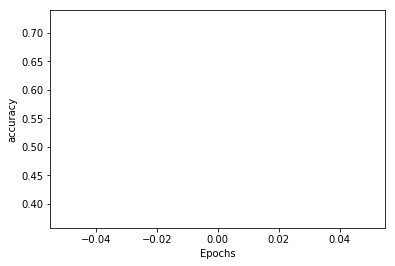

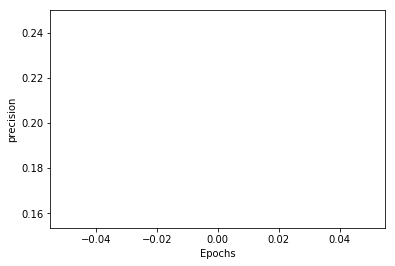

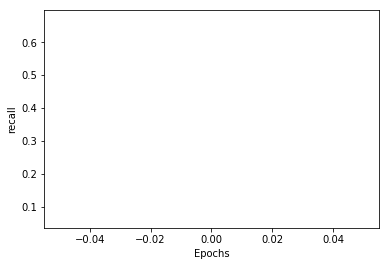

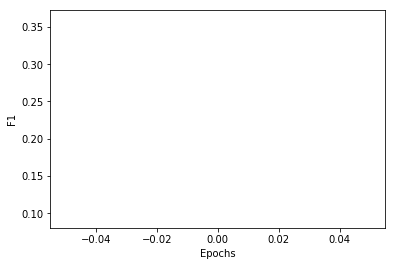

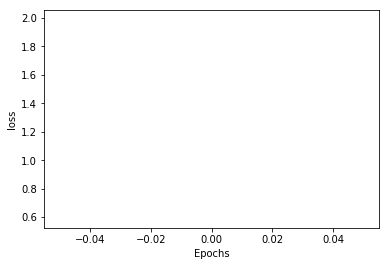

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 2/1000
100%|██████████| 27/27 [00:37<00:00,  1.28s/it, loss=0.337]
- Train metrics: accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 0.649


precision: 0.333 ; recall: 0.044 ; F1: 0.078 ; accuracy: 0.775


- Eval metrics : accuracy: 0.675 ; Confusion_Matrix: 0.675 ; loss: 38.892


precision: 0.273 ; recall: 0.143 ; F1: 0.187 ; accuracy: 0.675


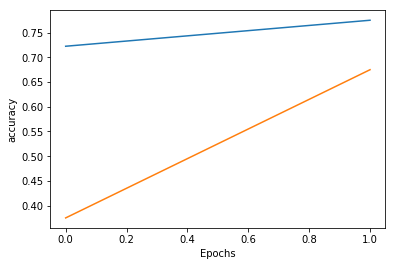

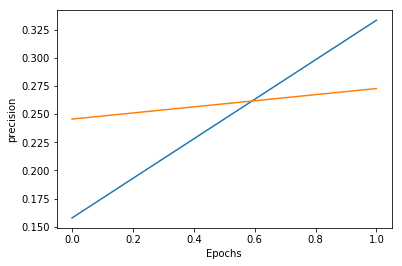

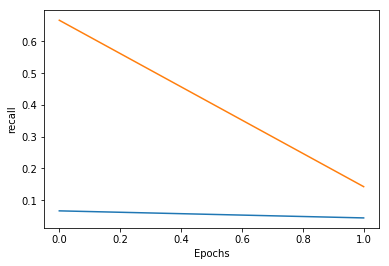

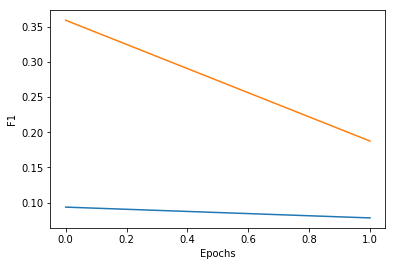

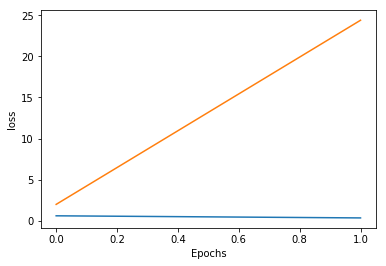

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 3/1000
100%|██████████| 27/27 [00:36<00:00,  1.18s/it, loss=0.393]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.334


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.785


- Eval metrics : accuracy: 0.300 ; Confusion_Matrix: 0.300 ; loss: 305.129


precision: 0.254 ; recall: 0.857 ; F1: 0.391 ; accuracy: 0.300


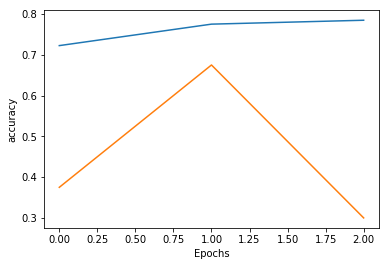

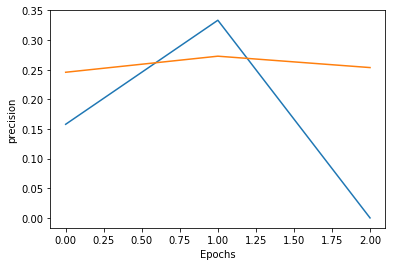

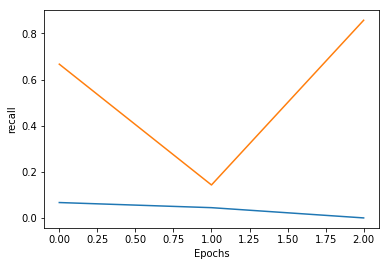

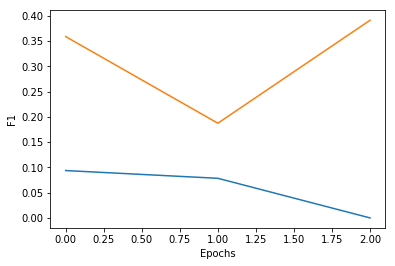

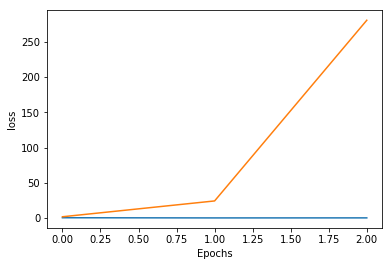

Epoch 4/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:33<00:00,  1.24s/it, loss=0.291]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.204


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.785


- Eval metrics : accuracy: 0.438 ; Confusion_Matrix: 0.438 ; loss: 31.440


precision: 0.250 ; recall: 0.571 ; F1: 0.348 ; accuracy: 0.438


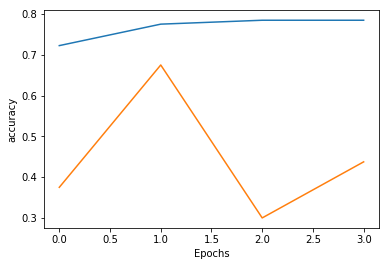

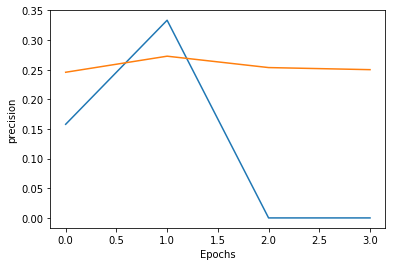

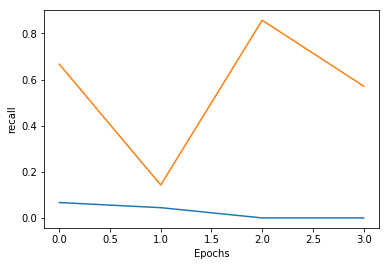

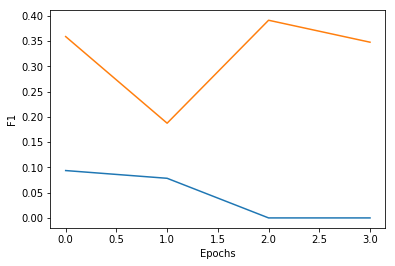

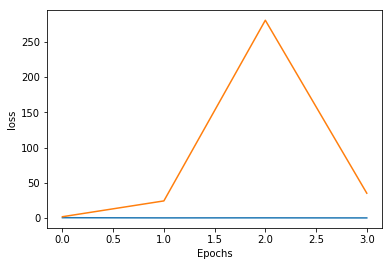

Epoch 5/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:39<00:00,  1.29s/it, loss=0.285]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.293


precision: 0.500 ; recall: 0.022 ; F1: 0.043 ; accuracy: 0.785


- Eval metrics : accuracy: 0.500 ; Confusion_Matrix: 0.500 ; loss: 15.163


precision: 0.229 ; recall: 0.381 ; F1: 0.286 ; accuracy: 0.500


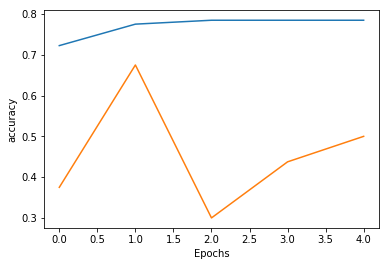

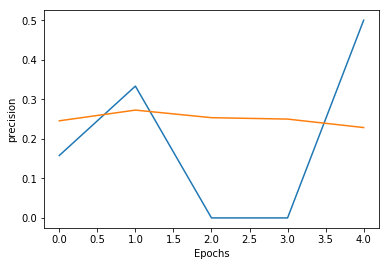

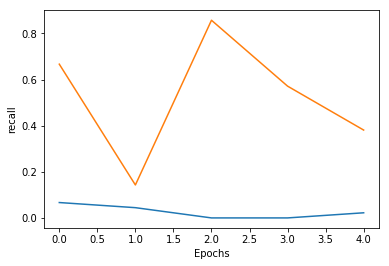

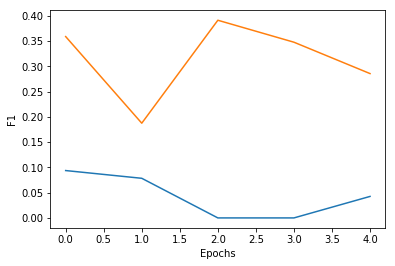

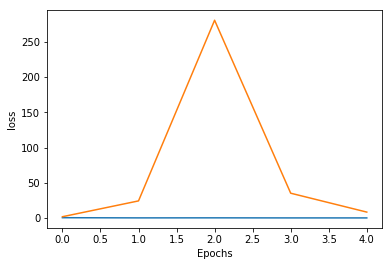

Epoch 6/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:39<00:00,  1.34s/it, loss=0.277]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.343


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.785


- Eval metrics : accuracy: 0.662 ; Confusion_Matrix: 0.662 ; loss: 13.061


precision: 0.393 ; recall: 0.524 ; F1: 0.449 ; accuracy: 0.662


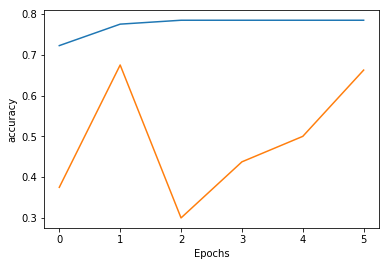

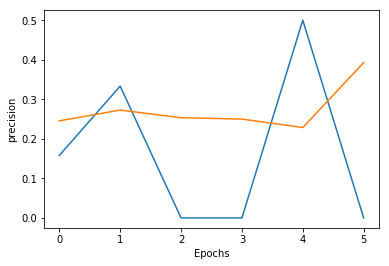

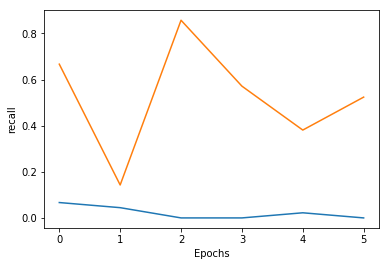

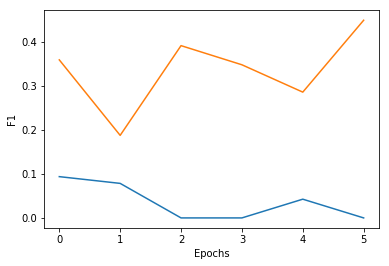

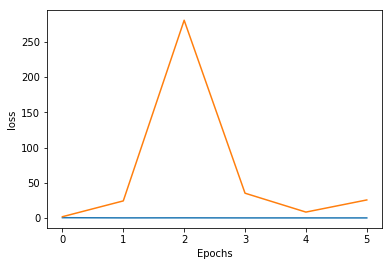

Epoch 7/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.14s/it, loss=0.417]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.166


precision: 0.500 ; recall: 0.067 ; F1: 0.118 ; accuracy: 0.785


- Eval metrics : accuracy: 0.637 ; Confusion_Matrix: 0.637 ; loss: 10.370


precision: 0.346 ; recall: 0.429 ; F1: 0.383 ; accuracy: 0.637


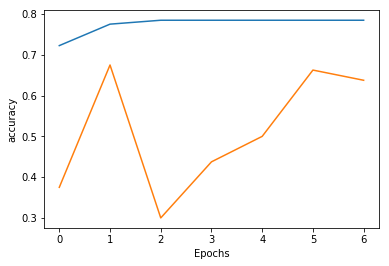

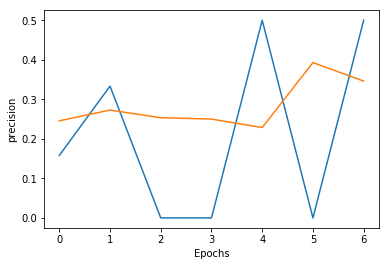

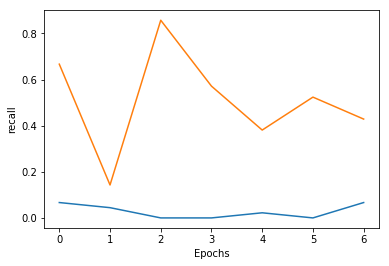

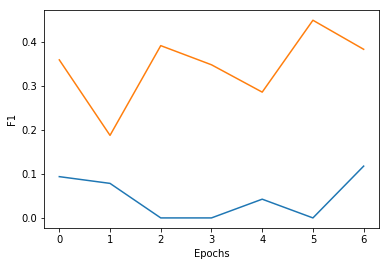

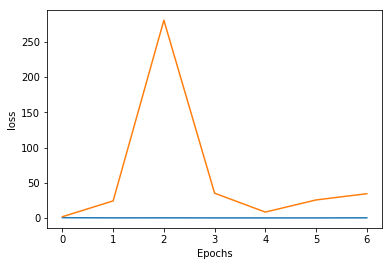

Epoch 8/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:34<00:00,  1.10s/it, loss=0.303]
- Train metrics: accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 0.536


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.785


- Eval metrics : accuracy: 0.400 ; Confusion_Matrix: 0.400 ; loss: 14.170


precision: 0.235 ; recall: 0.571 ; F1: 0.333 ; accuracy: 0.400


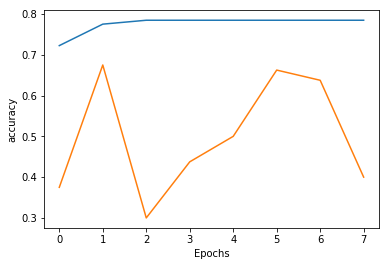

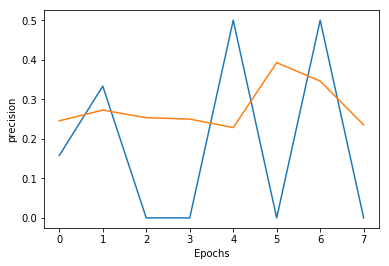

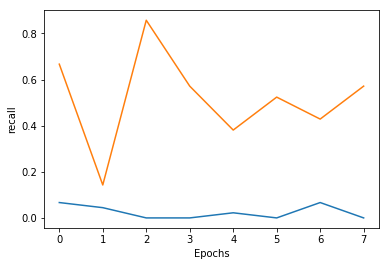

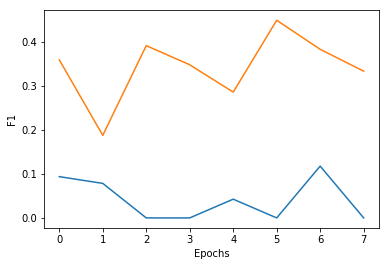

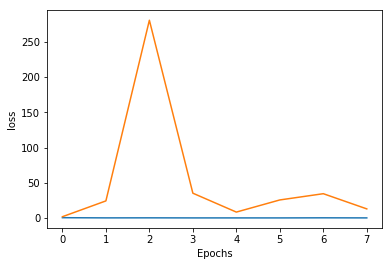

Checkpoint Directory exists! 


Epoch 9/1000
100%|██████████| 27/27 [00:51<00:00,  1.42s/it, loss=0.384]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.324


precision: 0.400 ; recall: 0.044 ; F1: 0.080 ; accuracy: 0.780


- Eval metrics : accuracy: 0.400 ; Confusion_Matrix: 0.400 ; loss: 53.838


precision: 0.245 ; recall: 0.619 ; F1: 0.351 ; accuracy: 0.400


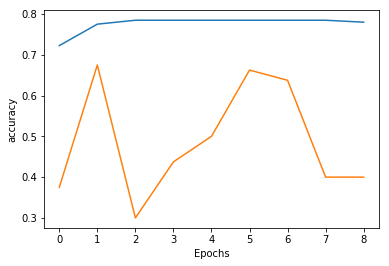

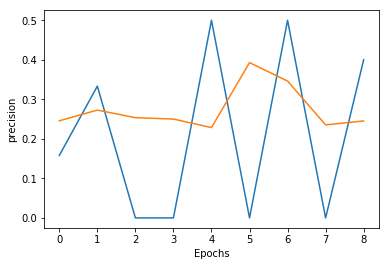

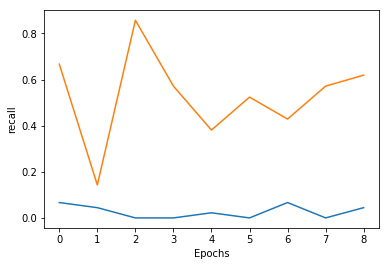

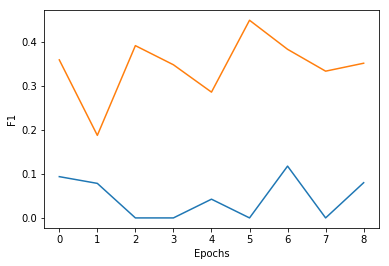

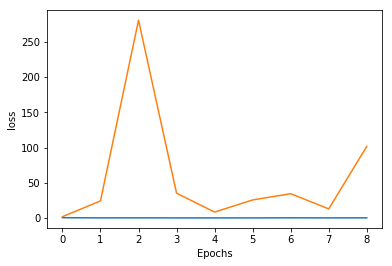

Epoch 10/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:40<00:00,  1.17s/it, loss=0.281]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.288


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.785


- Eval metrics : accuracy: 0.700 ; Confusion_Matrix: 0.700 ; loss: 0.604


precision: 0.412 ; recall: 0.333 ; F1: 0.368 ; accuracy: 0.700


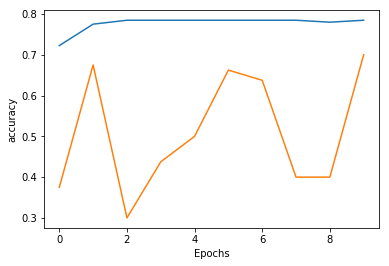

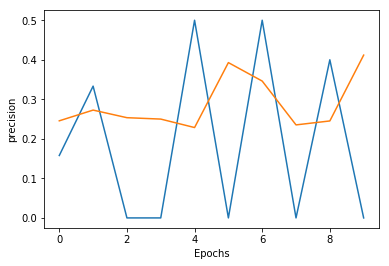

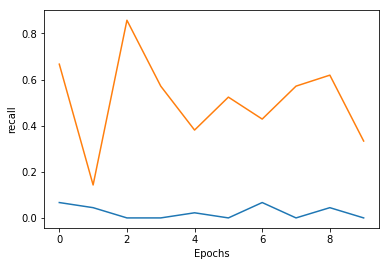

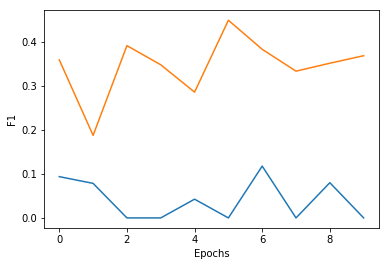

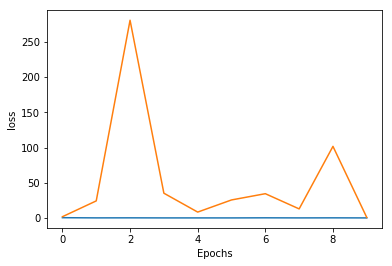

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 11/1000
100%|██████████| 27/27 [00:34<00:00,  1.11s/it, loss=0.275]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.239


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.785


- Eval metrics : accuracy: 0.312 ; Confusion_Matrix: 0.312 ; loss: 767.509


precision: 0.270 ; recall: 0.952 ; F1: 0.421 ; accuracy: 0.312


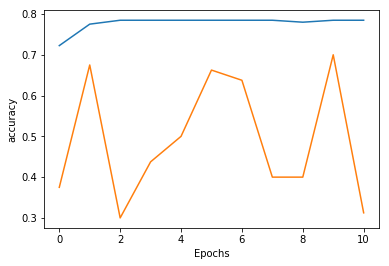

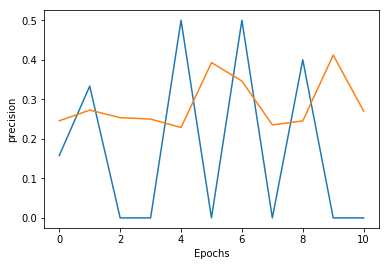

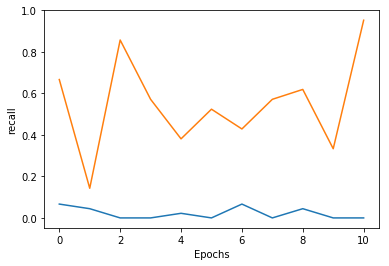

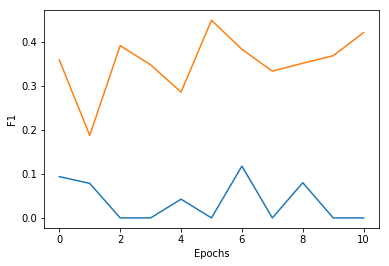

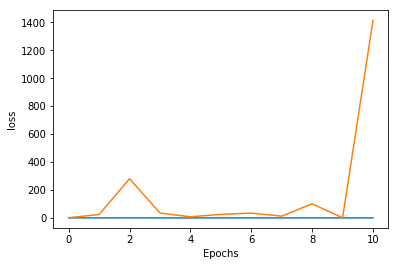

Epoch 12/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.13s/it, loss=0.248]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.135


precision: 0.800 ; recall: 0.089 ; F1: 0.160 ; accuracy: 0.799


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 44.527


precision: 0.500 ; recall: 0.190 ; F1: 0.276 ; accuracy: 0.738


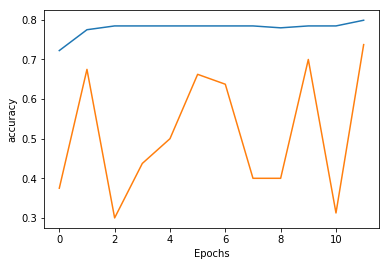

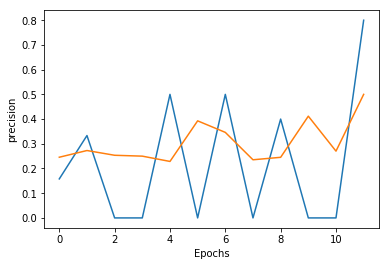

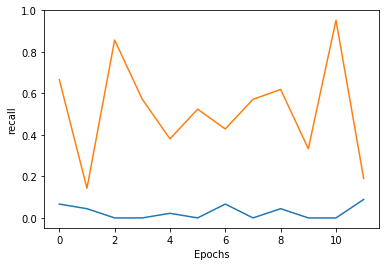

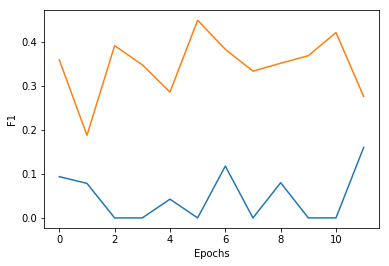

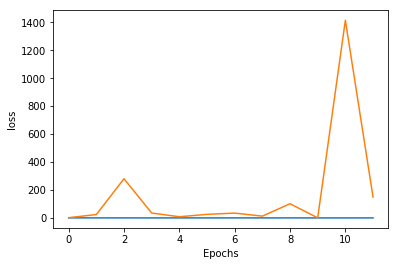

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 13/1000
100%|██████████| 27/27 [00:38<00:00,  1.27s/it, loss=0.260]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.381


precision: 0.625 ; recall: 0.111 ; F1: 0.189 ; accuracy: 0.794


- Eval metrics : accuracy: 0.312 ; Confusion_Matrix: 0.312 ; loss: 12.535


precision: 0.257 ; recall: 0.857 ; F1: 0.396 ; accuracy: 0.312


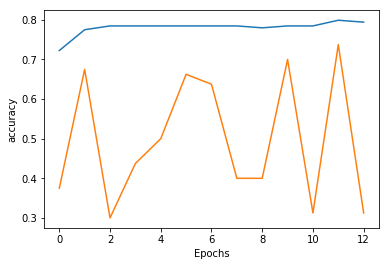

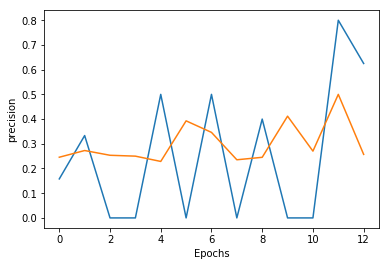

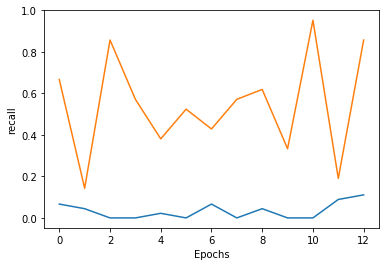

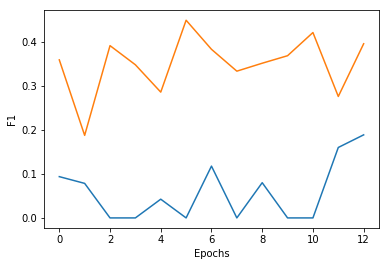

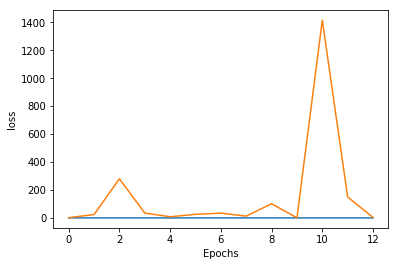

Epoch 14/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.19s/it, loss=0.381]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.242


precision: 0.667 ; recall: 0.089 ; F1: 0.157 ; accuracy: 0.794


- Eval metrics : accuracy: 0.375 ; Confusion_Matrix: 0.375 ; loss: 47.536


precision: 0.277 ; recall: 0.857 ; F1: 0.419 ; accuracy: 0.375


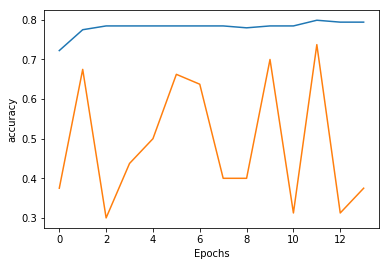

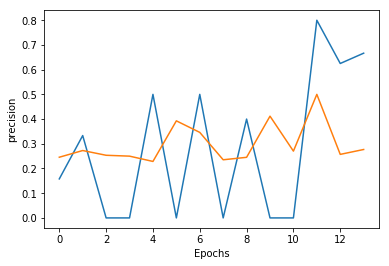

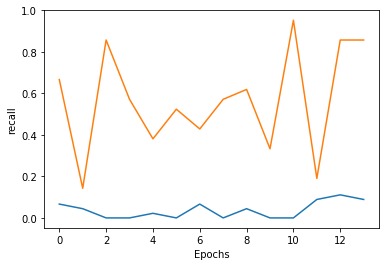

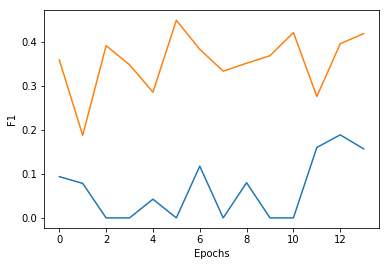

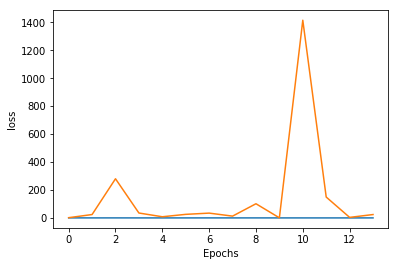

Epoch 15/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.28s/it, loss=0.234]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.178


precision: 0.720 ; recall: 0.400 ; F1: 0.514 ; accuracy: 0.837


- Eval metrics : accuracy: 0.388 ; Confusion_Matrix: 0.388 ; loss: 384.233


precision: 0.167 ; recall: 0.333 ; F1: 0.222 ; accuracy: 0.388


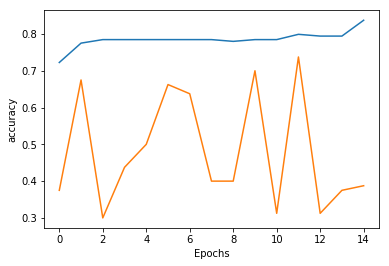

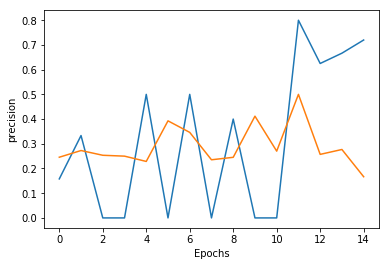

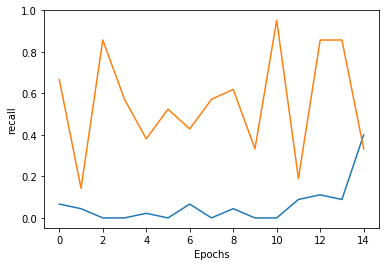

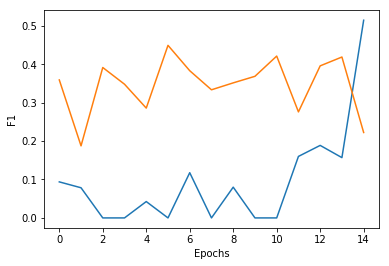

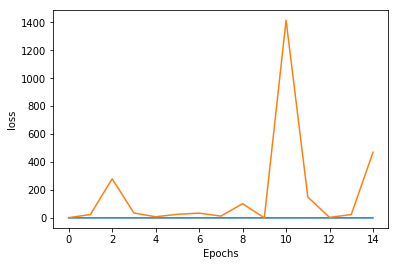

Epoch 16/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.19s/it, loss=0.251]
- Train metrics: accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 0.526


precision: 0.600 ; recall: 0.133 ; F1: 0.218 ; accuracy: 0.794


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 24.579


precision: 0.500 ; recall: 0.048 ; F1: 0.087 ; accuracy: 0.738


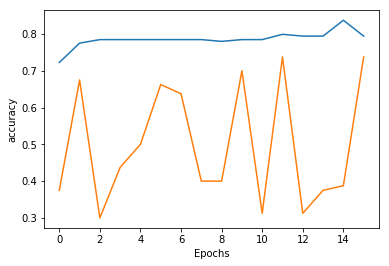

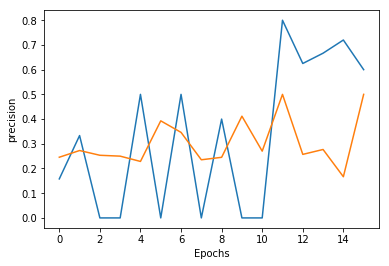

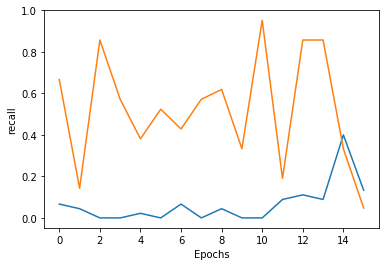

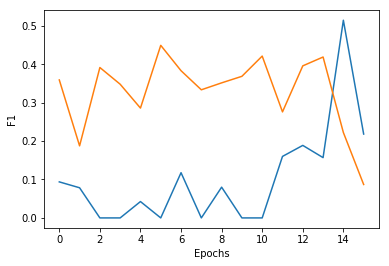

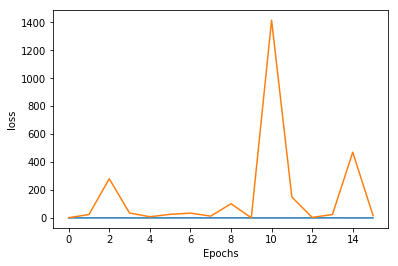

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 17/1000
100%|██████████| 27/27 [00:35<00:00,  1.06s/it, loss=0.282]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.107


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.785


- Eval metrics : accuracy: 0.275 ; Confusion_Matrix: 0.275 ; loss: 9826.299


precision: 0.266 ; recall: 1.000 ; F1: 0.420 ; accuracy: 0.275


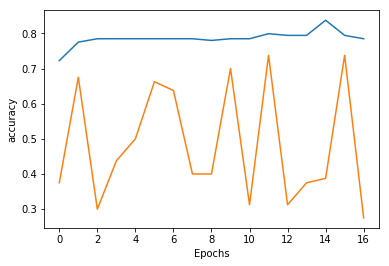

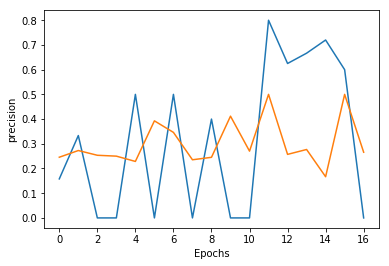

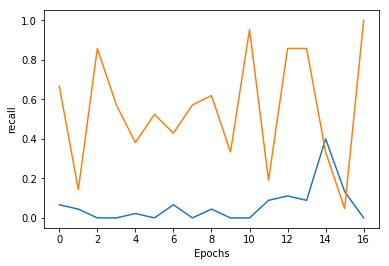

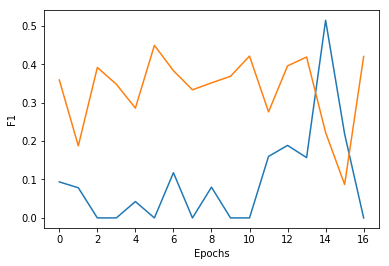

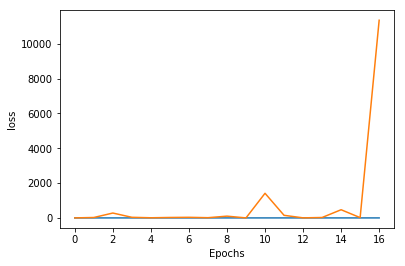

Epoch 18/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.25s/it, loss=0.314]
- Train metrics: accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 0.368


precision: 1.000 ; recall: 0.156 ; F1: 0.269 ; accuracy: 0.818


- Eval metrics : accuracy: 0.287 ; Confusion_Matrix: 0.287 ; loss: 7631.741


precision: 0.269 ; recall: 1.000 ; F1: 0.424 ; accuracy: 0.287


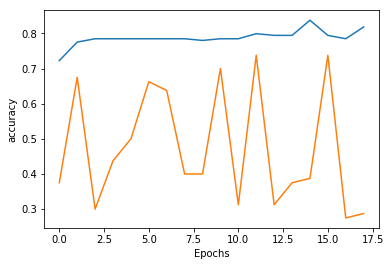

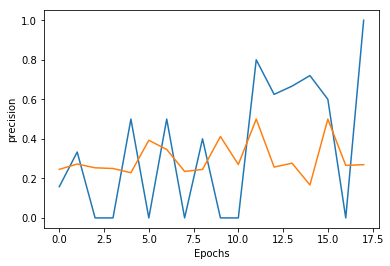

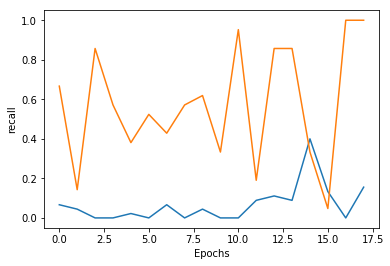

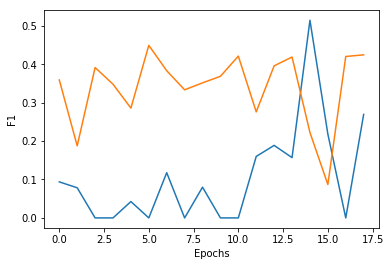

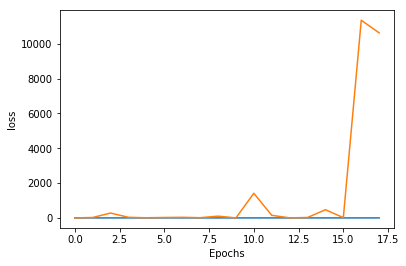

Checkpoint Directory exists! 


Epoch 19/1000
100%|██████████| 27/27 [00:35<00:00,  1.18s/it, loss=0.191]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.064


precision: 0.955 ; recall: 0.467 ; F1: 0.627 ; accuracy: 0.880


- Eval metrics : accuracy: 0.662 ; Confusion_Matrix: 0.662 ; loss: 20.849


precision: 0.350 ; recall: 0.333 ; F1: 0.341 ; accuracy: 0.662


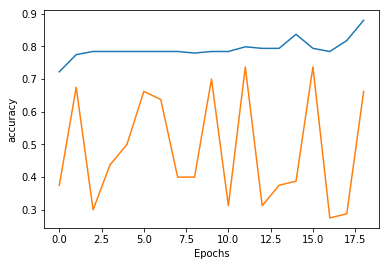

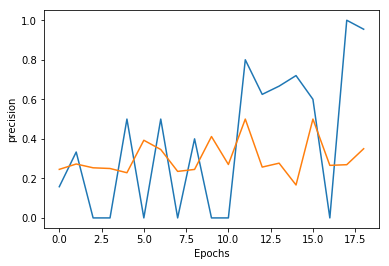

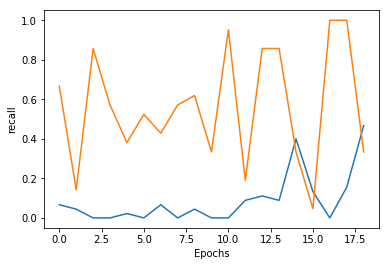

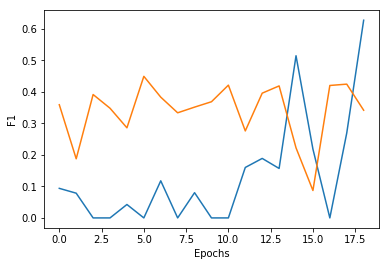

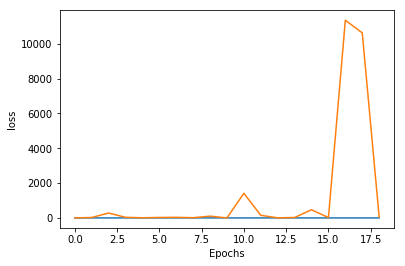

Epoch 20/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:39<00:00,  1.29s/it, loss=0.267]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.269


precision: 0.706 ; recall: 0.267 ; F1: 0.387 ; accuracy: 0.818


- Eval metrics : accuracy: 0.713 ; Confusion_Matrix: 0.713 ; loss: 263.140


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.713


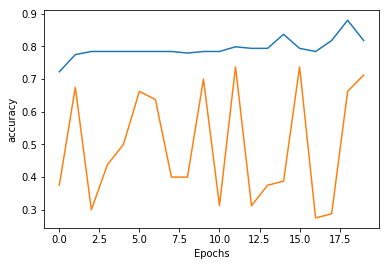

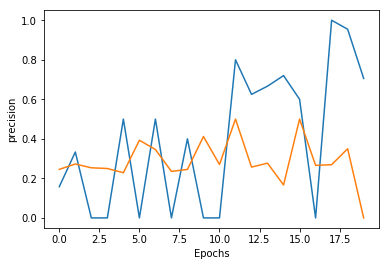

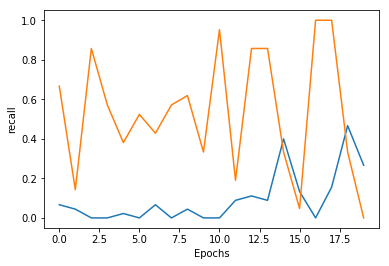

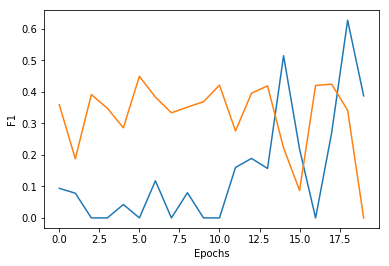

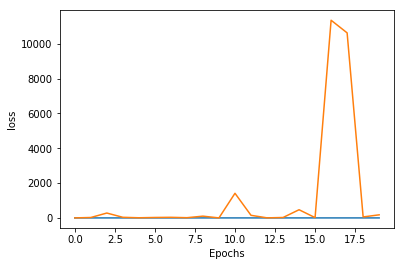

Epoch 21/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:38<00:00,  1.21s/it, loss=0.222]
- Train metrics: accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 0.423


precision: 0.889 ; recall: 0.178 ; F1: 0.296 ; accuracy: 0.818


- Eval metrics : accuracy: 0.475 ; Confusion_Matrix: 0.475 ; loss: 35.096


precision: 0.256 ; recall: 0.524 ; F1: 0.344 ; accuracy: 0.475


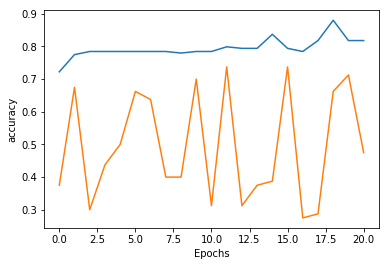

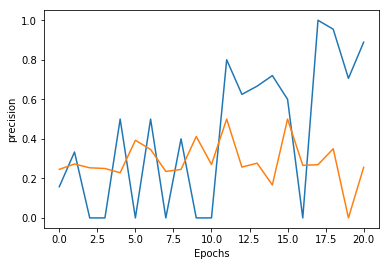

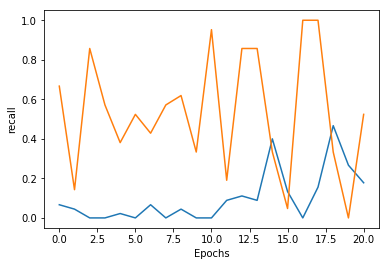

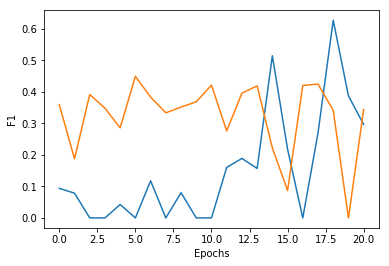

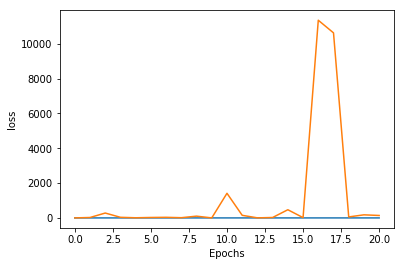

Epoch 22/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.17s/it, loss=0.217]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.076


precision: 0.727 ; recall: 0.356 ; F1: 0.478 ; accuracy: 0.833


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 1754.756


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


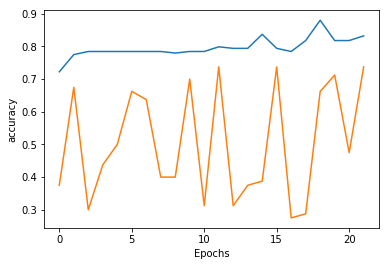

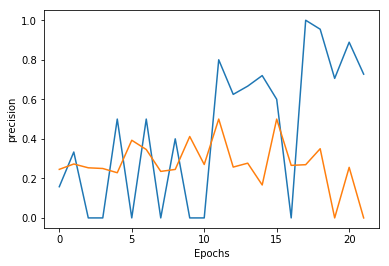

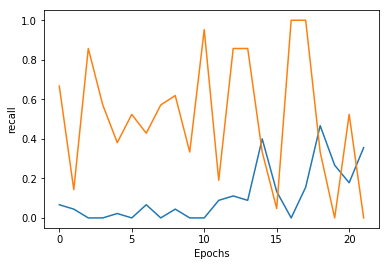

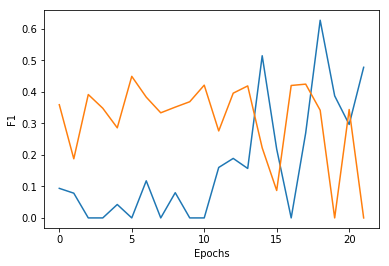

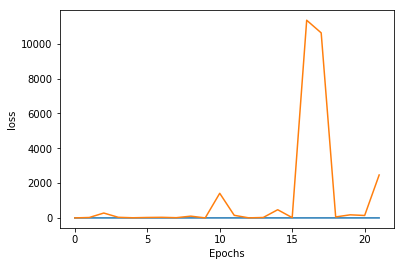

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 23/1000
100%|██████████| 27/27 [00:35<00:00,  1.29s/it, loss=0.240]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.213


precision: 0.900 ; recall: 0.200 ; F1: 0.327 ; accuracy: 0.823


- Eval metrics : accuracy: 0.250 ; Confusion_Matrix: 0.250 ; loss: 398.256


precision: 0.247 ; recall: 0.905 ; F1: 0.388 ; accuracy: 0.250


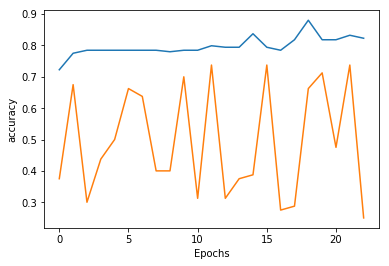

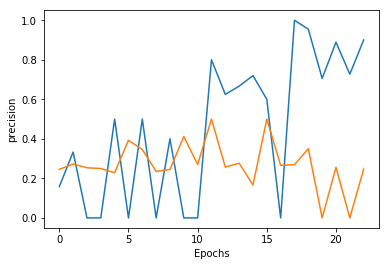

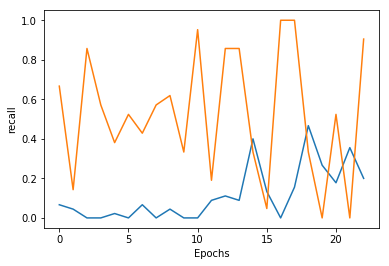

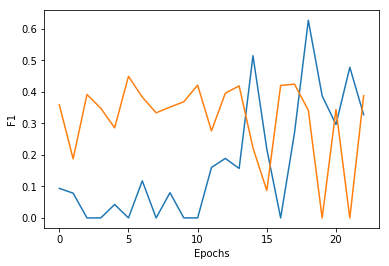

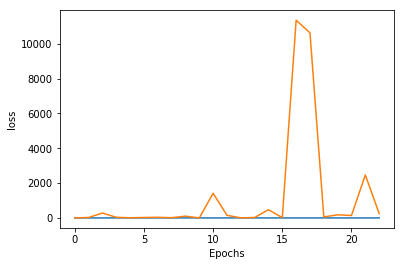

Epoch 24/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:44<00:00,  1.37s/it, loss=0.340]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.174


precision: 0.833 ; recall: 0.111 ; F1: 0.196 ; accuracy: 0.804


- Eval metrics : accuracy: 0.450 ; Confusion_Matrix: 0.450 ; loss: 261.677


precision: 0.189 ; recall: 0.333 ; F1: 0.241 ; accuracy: 0.450


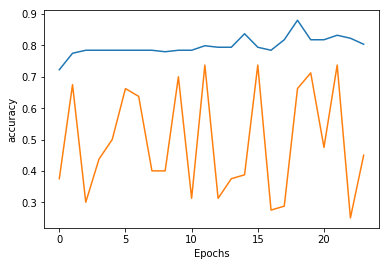

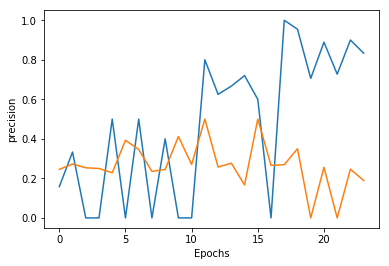

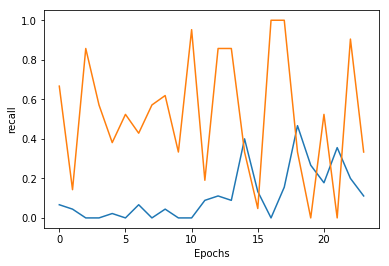

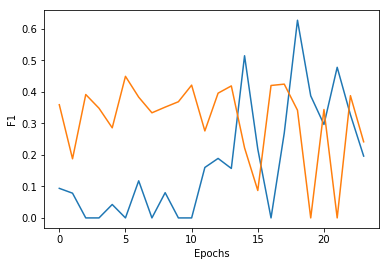

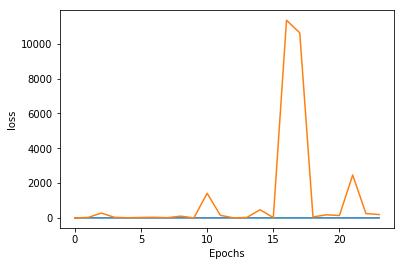

Epoch 25/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.26s/it, loss=0.233]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.115


precision: 0.846 ; recall: 0.489 ; F1: 0.620 ; accuracy: 0.871


- Eval metrics : accuracy: 0.263 ; Confusion_Matrix: 0.263 ; loss: 2090.639


precision: 0.229 ; recall: 0.762 ; F1: 0.352 ; accuracy: 0.263


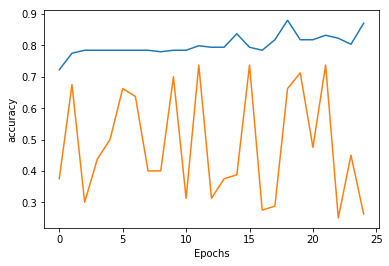

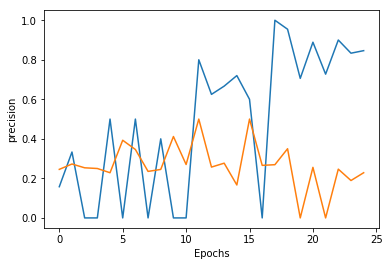

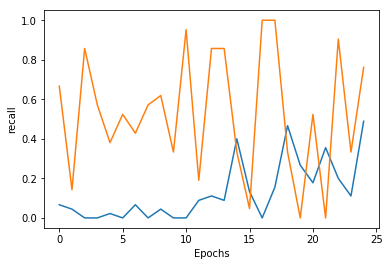

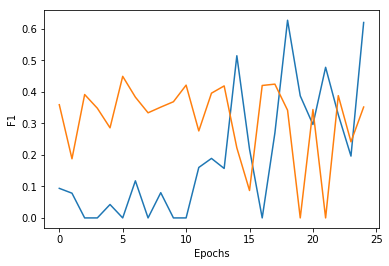

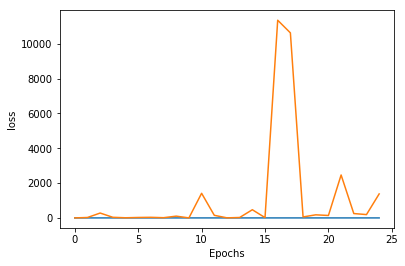

Epoch 26/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.28s/it, loss=0.331]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.171


precision: 0.933 ; recall: 0.311 ; F1: 0.467 ; accuracy: 0.847


- Eval metrics : accuracy: 0.263 ; Confusion_Matrix: 0.263 ; loss: 15278.251


precision: 0.263 ; recall: 1.000 ; F1: 0.416 ; accuracy: 0.263


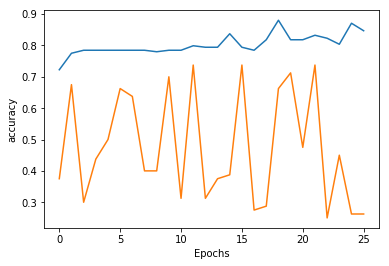

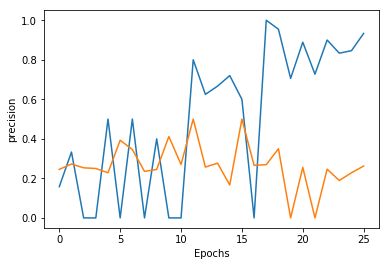

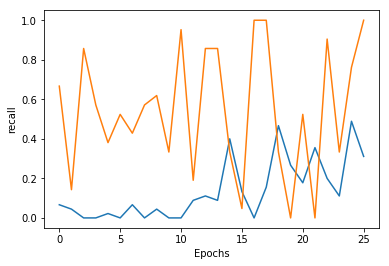

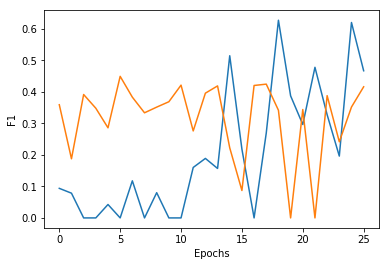

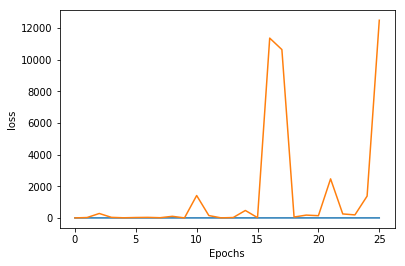

Epoch 27/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.10s/it, loss=0.336]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.168


precision: 0.810 ; recall: 0.378 ; F1: 0.515 ; accuracy: 0.847


- Eval metrics : accuracy: 0.263 ; Confusion_Matrix: 0.263 ; loss: 1935.317


precision: 0.256 ; recall: 0.952 ; F1: 0.404 ; accuracy: 0.263


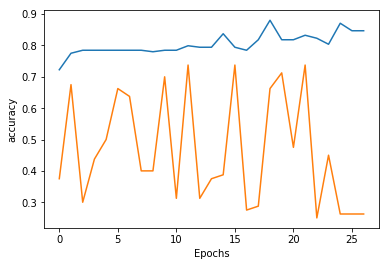

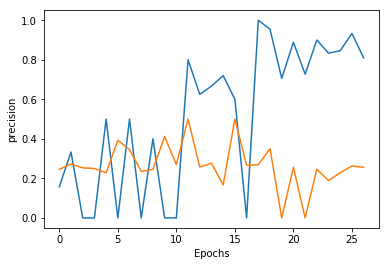

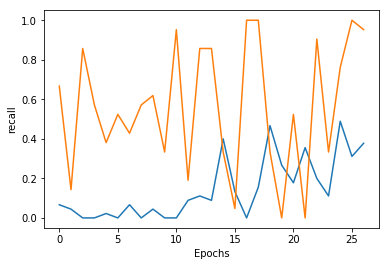

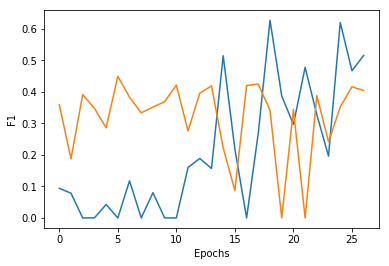

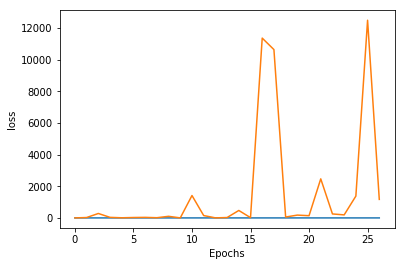

Epoch 28/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.23s/it, loss=0.209]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.096


precision: 0.783 ; recall: 0.400 ; F1: 0.529 ; accuracy: 0.847


- Eval metrics : accuracy: 0.263 ; Confusion_Matrix: 0.263 ; loss: 19.183


precision: 0.250 ; recall: 0.905 ; F1: 0.392 ; accuracy: 0.263


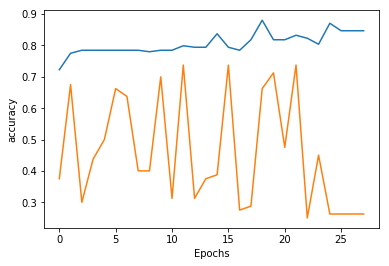

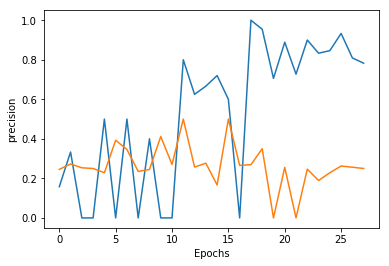

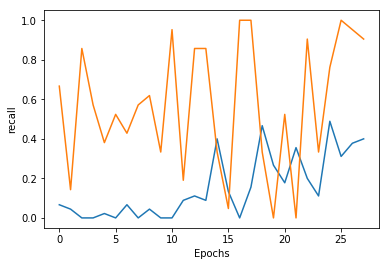

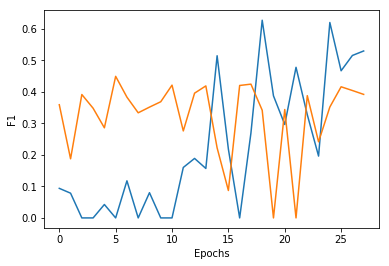

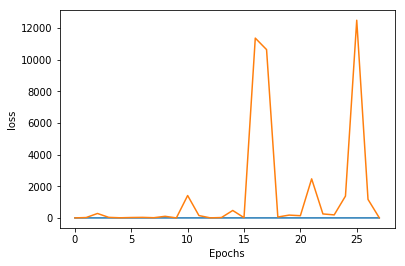

Checkpoint Directory exists! 


Epoch 29/1000
100%|██████████| 27/27 [00:36<00:00,  1.20s/it, loss=0.202]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.073


precision: 0.957 ; recall: 0.489 ; F1: 0.647 ; accuracy: 0.885


- Eval metrics : accuracy: 0.275 ; Confusion_Matrix: 0.275 ; loss: 1445.189


precision: 0.266 ; recall: 1.000 ; F1: 0.420 ; accuracy: 0.275


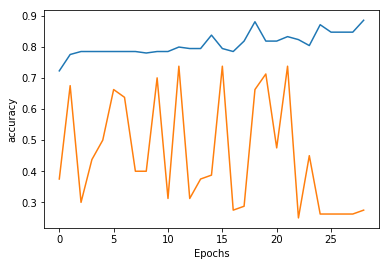

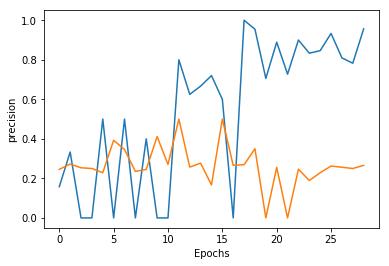

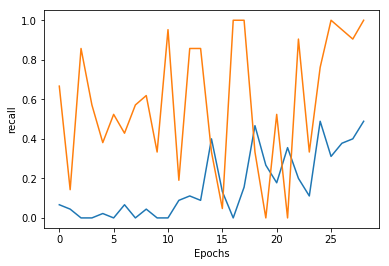

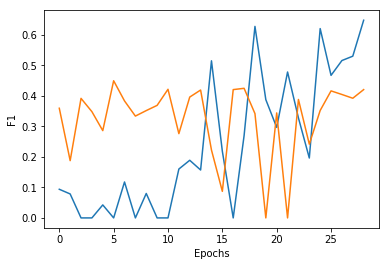

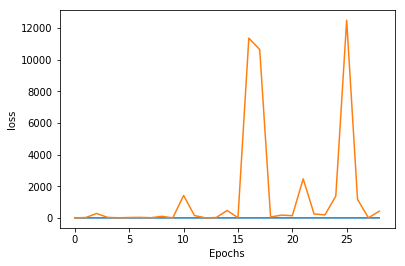

Epoch 30/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.18s/it, loss=0.163]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.057


precision: 0.957 ; recall: 0.489 ; F1: 0.647 ; accuracy: 0.885


- Eval metrics : accuracy: 0.275 ; Confusion_Matrix: 0.275 ; loss: 1028.406


precision: 0.260 ; recall: 0.952 ; F1: 0.408 ; accuracy: 0.275


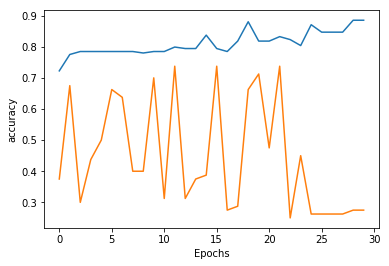

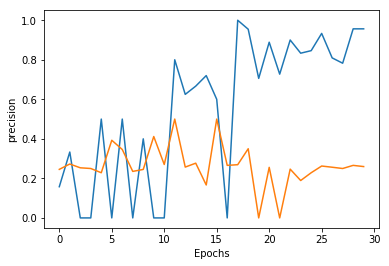

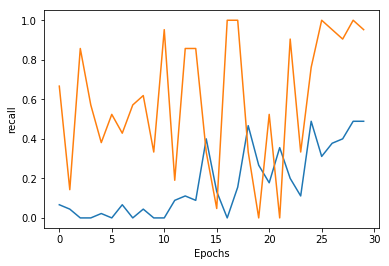

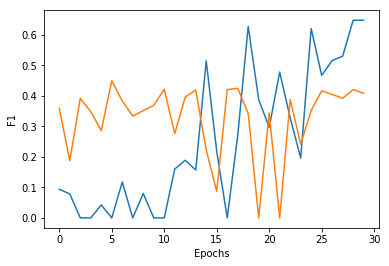

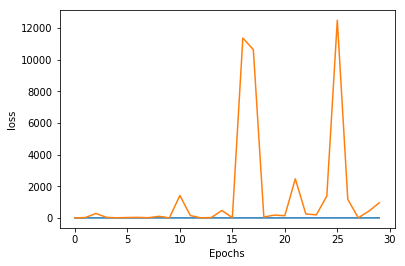

Epoch 31/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.23s/it, loss=0.290]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.246


precision: 0.824 ; recall: 0.622 ; F1: 0.709 ; accuracy: 0.890


- Eval metrics : accuracy: 0.263 ; Confusion_Matrix: 0.263 ; loss: 1022.931


precision: 0.263 ; recall: 1.000 ; F1: 0.416 ; accuracy: 0.263


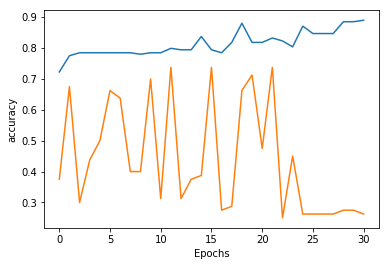

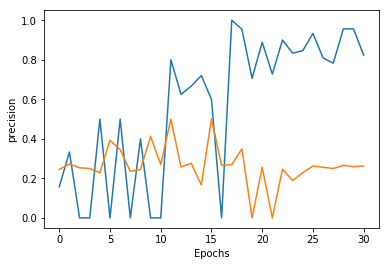

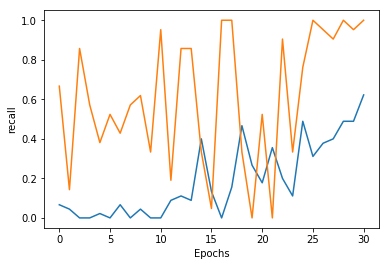

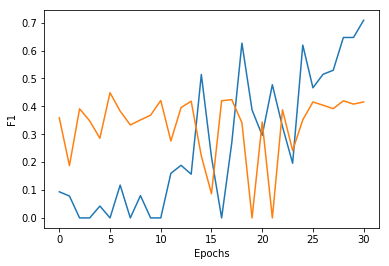

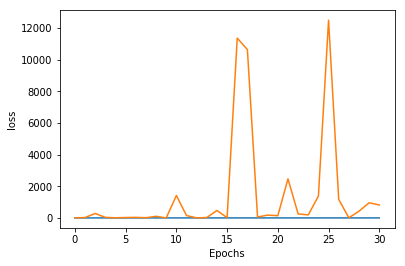

Epoch 32/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.27s/it, loss=0.119]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.068


precision: 0.917 ; recall: 0.733 ; F1: 0.815 ; accuracy: 0.928


- Eval metrics : accuracy: 0.287 ; Confusion_Matrix: 0.287 ; loss: 25.478


precision: 0.263 ; recall: 0.952 ; F1: 0.412 ; accuracy: 0.287


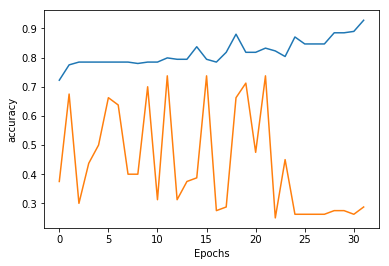

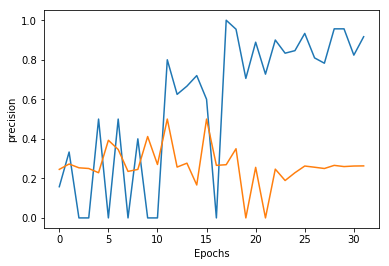

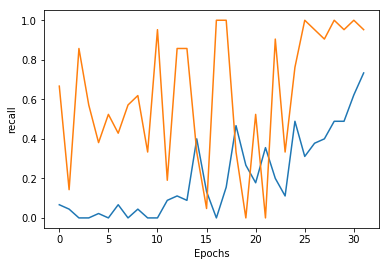

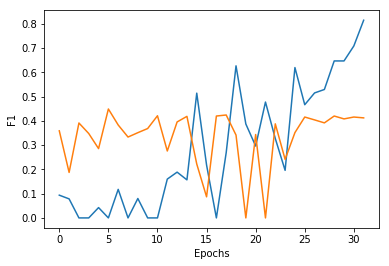

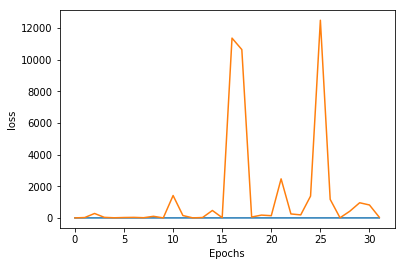

Epoch 33/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.24s/it, loss=0.088]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.081


precision: 0.923 ; recall: 0.800 ; F1: 0.857 ; accuracy: 0.943


- Eval metrics : accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 3.873


precision: 0.235 ; recall: 0.190 ; F1: 0.211 ; accuracy: 0.625


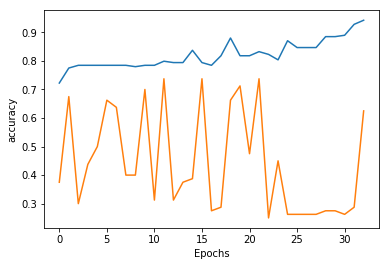

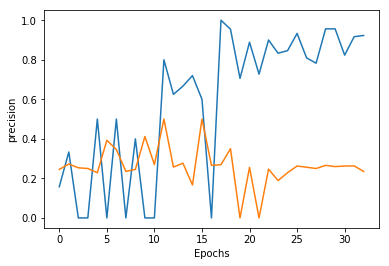

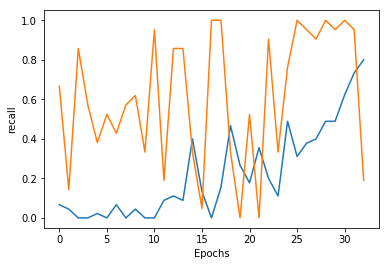

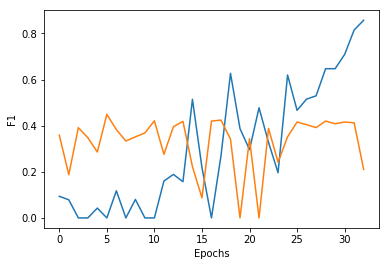

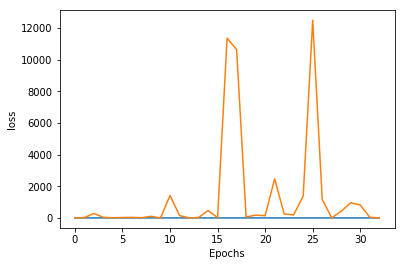

Checkpoint Directory exists! 


Epoch 34/1000
100%|██████████| 27/27 [00:36<00:00,  1.30s/it, loss=0.229]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.113


precision: 0.870 ; recall: 0.444 ; F1: 0.588 ; accuracy: 0.866


- Eval metrics : accuracy: 0.263 ; Confusion_Matrix: 0.263 ; loss: 31728.606


precision: 0.263 ; recall: 1.000 ; F1: 0.416 ; accuracy: 0.263


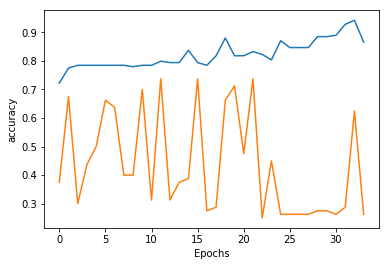

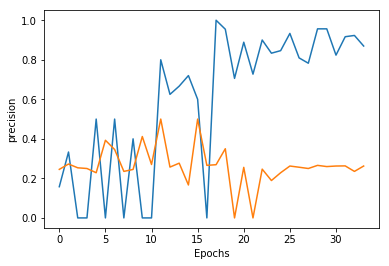

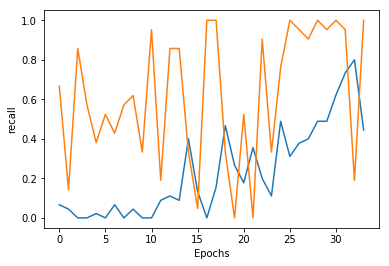

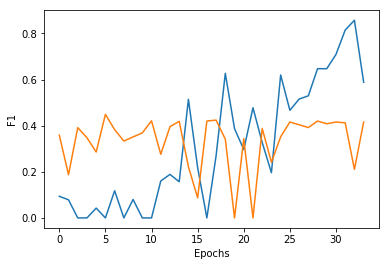

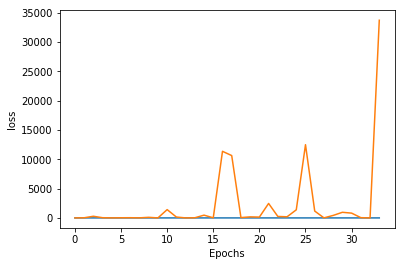

Epoch 35/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.24s/it, loss=0.207]
- Train metrics: accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 0.418


precision: 0.889 ; recall: 0.356 ; F1: 0.508 ; accuracy: 0.852


- Eval metrics : accuracy: 0.388 ; Confusion_Matrix: 0.388 ; loss: 400.278


precision: 0.259 ; recall: 0.714 ; F1: 0.380 ; accuracy: 0.388


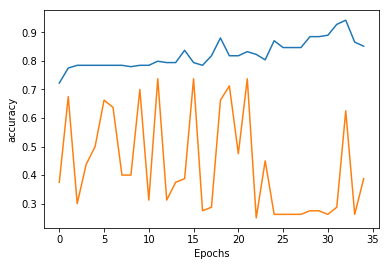

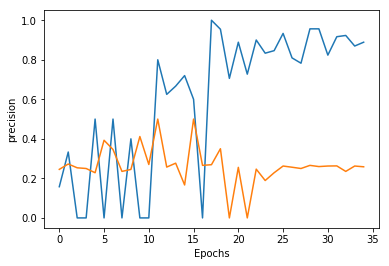

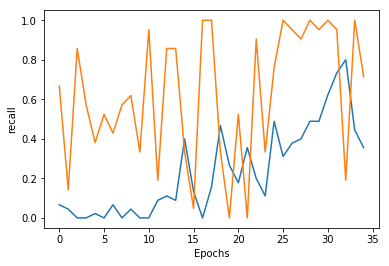

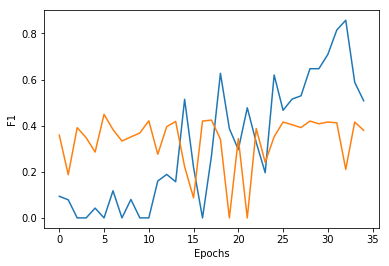

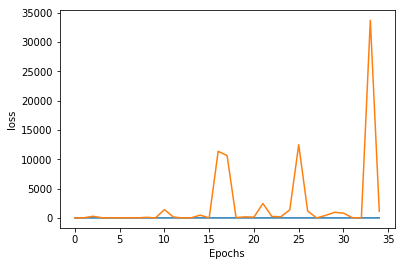

Checkpoint Directory exists! 


Epoch 36/1000
100%|██████████| 27/27 [00:39<00:00,  1.29s/it, loss=0.122]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.084


precision: 0.968 ; recall: 0.667 ; F1: 0.789 ; accuracy: 0.923


- Eval metrics : accuracy: 0.300 ; Confusion_Matrix: 0.300 ; loss: 133.811


precision: 0.267 ; recall: 0.952 ; F1: 0.417 ; accuracy: 0.300


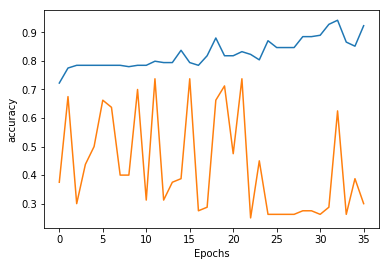

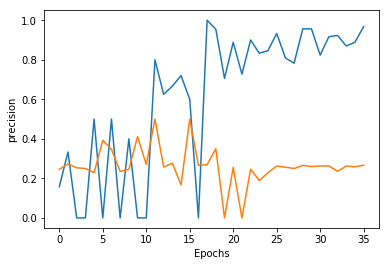

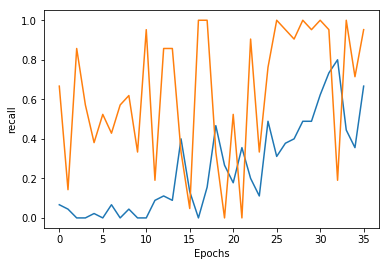

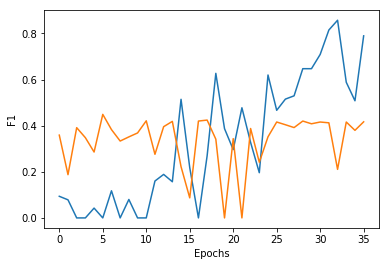

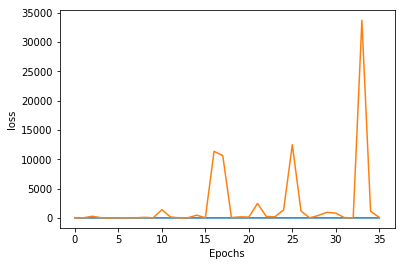

Epoch 37/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:34<00:00,  1.16s/it, loss=0.104]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.116


precision: 0.969 ; recall: 0.689 ; F1: 0.805 ; accuracy: 0.928


- Eval metrics : accuracy: 0.637 ; Confusion_Matrix: 0.637 ; loss: 39.098


precision: 0.346 ; recall: 0.429 ; F1: 0.383 ; accuracy: 0.637


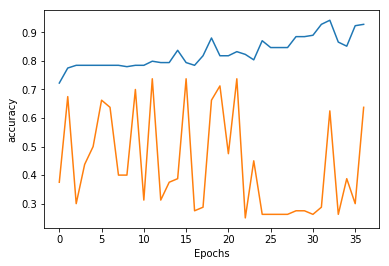

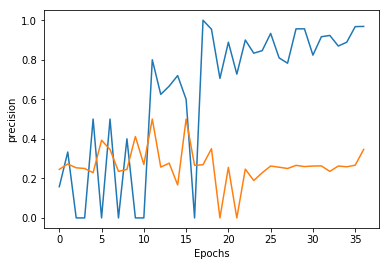

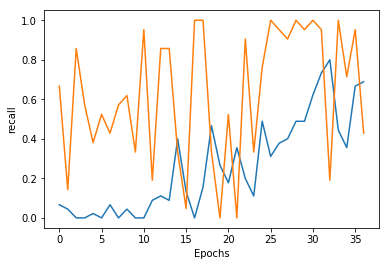

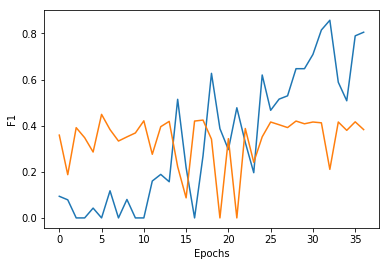

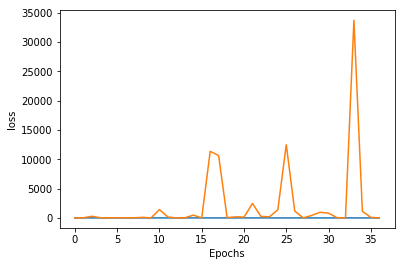

Epoch 38/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:39<00:00,  1.33s/it, loss=0.151]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.016


precision: 0.857 ; recall: 0.800 ; F1: 0.828 ; accuracy: 0.928


- Eval metrics : accuracy: 0.550 ; Confusion_Matrix: 0.550 ; loss: 58.266


precision: 0.273 ; recall: 0.429 ; F1: 0.333 ; accuracy: 0.550


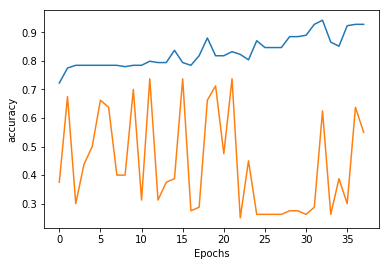

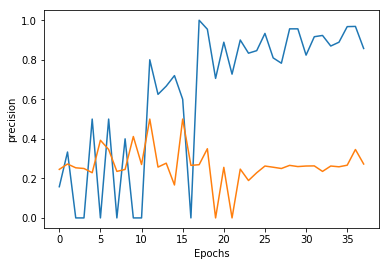

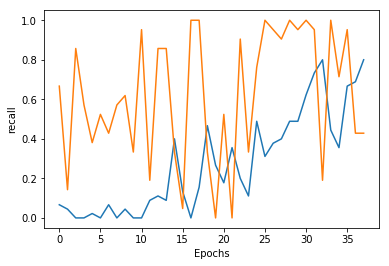

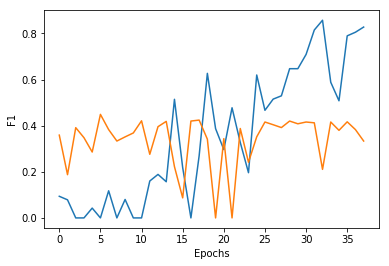

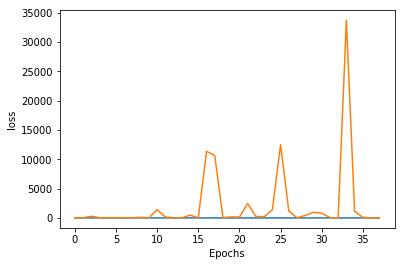

Epoch 39/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:46<00:00,  1.31s/it, loss=0.267]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.046


precision: 0.917 ; recall: 0.244 ; F1: 0.386 ; accuracy: 0.833


- Eval metrics : accuracy: 0.287 ; Confusion_Matrix: 0.287 ; loss: 1194.547


precision: 0.263 ; recall: 0.952 ; F1: 0.412 ; accuracy: 0.287


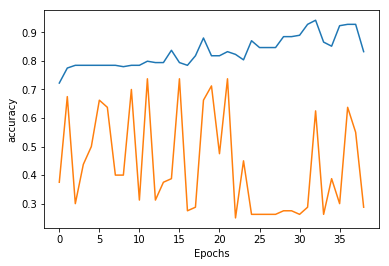

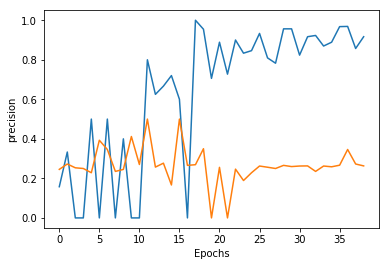

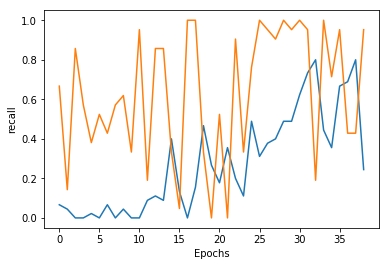

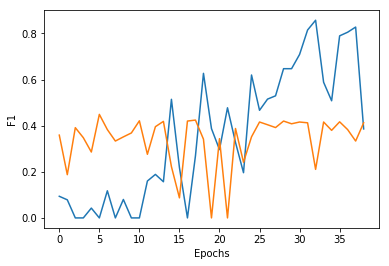

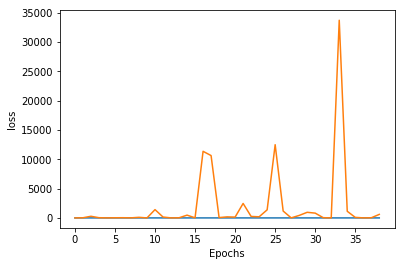

Epoch 40/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.20s/it, loss=0.159]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.271


precision: 0.958 ; recall: 0.511 ; F1: 0.667 ; accuracy: 0.890


- Eval metrics : accuracy: 0.550 ; Confusion_Matrix: 0.550 ; loss: 19.856


precision: 0.059 ; recall: 0.048 ; F1: 0.053 ; accuracy: 0.550


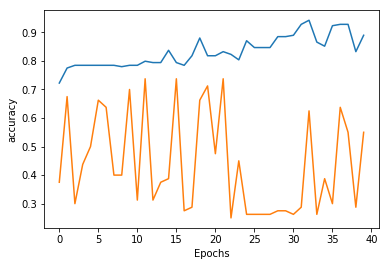

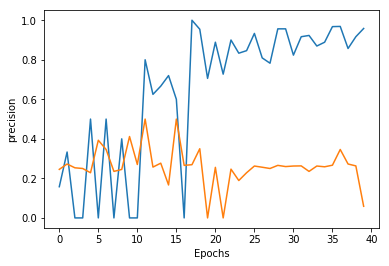

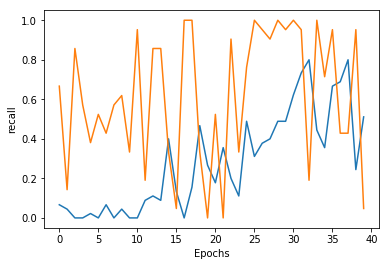

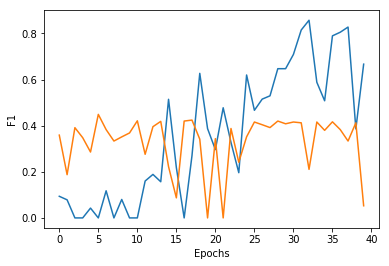

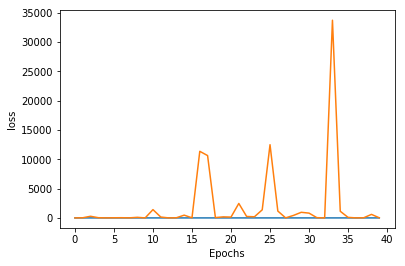

Epoch 41/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.10s/it, loss=0.108]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.303


precision: 0.966 ; recall: 0.622 ; F1: 0.757 ; accuracy: 0.914


- Eval metrics : accuracy: 0.463 ; Confusion_Matrix: 0.463 ; loss: 353.250


precision: 0.250 ; recall: 0.524 ; F1: 0.338 ; accuracy: 0.463


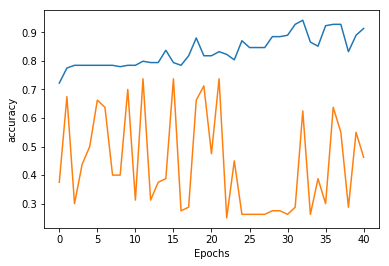

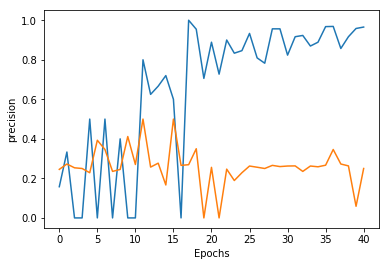

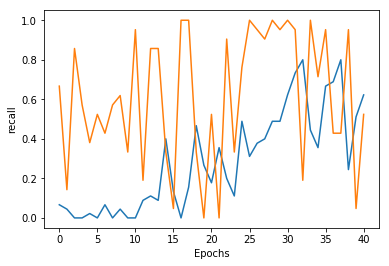

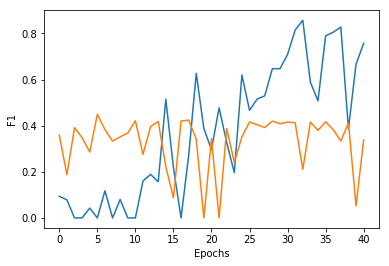

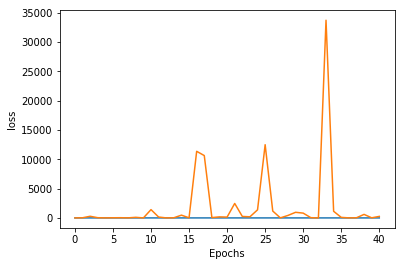

Epoch 42/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.19s/it, loss=0.084]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.018


precision: 0.943 ; recall: 0.733 ; F1: 0.825 ; accuracy: 0.933


- Eval metrics : accuracy: 0.700 ; Confusion_Matrix: 0.700 ; loss: 350.984


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.700


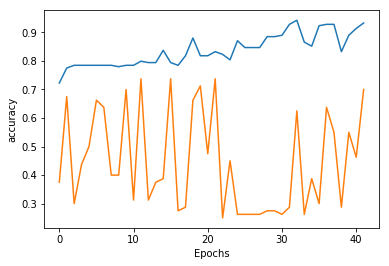

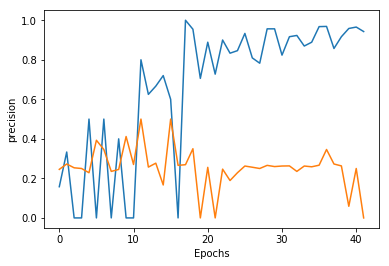

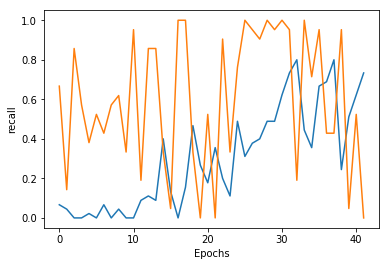

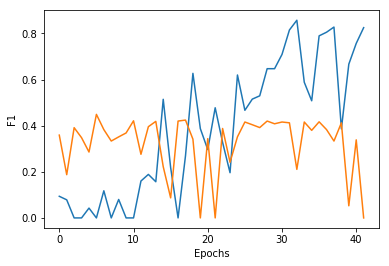

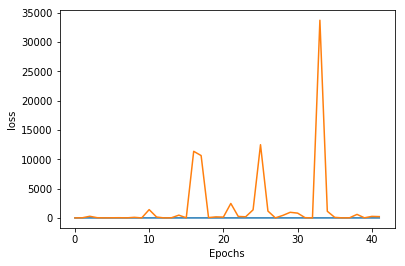

Epoch 43/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.32s/it, loss=0.159]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.460


precision: 0.840 ; recall: 0.467 ; F1: 0.600 ; accuracy: 0.866


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 268.727


precision: 0.500 ; recall: 0.048 ; F1: 0.087 ; accuracy: 0.738


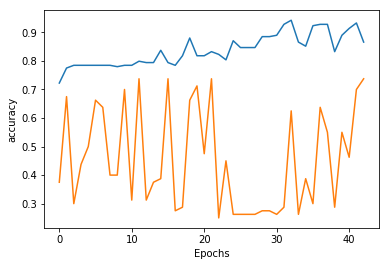

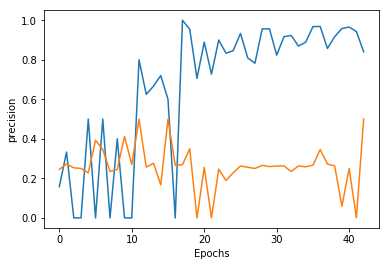

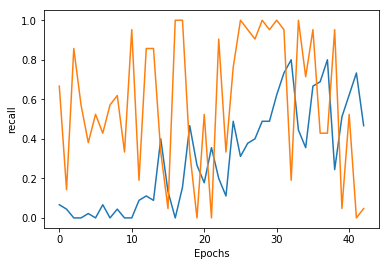

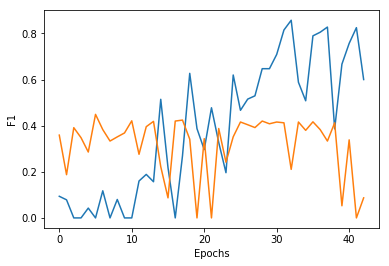

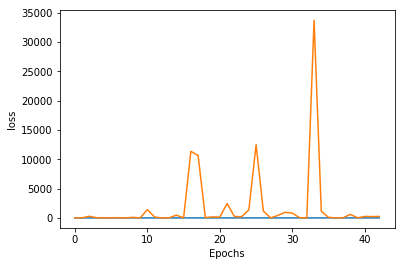

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 44/1000
100%|██████████| 27/27 [00:35<00:00,  1.29s/it, loss=0.107]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.260


precision: 0.941 ; recall: 0.711 ; F1: 0.810 ; accuracy: 0.928


- Eval metrics : accuracy: 0.312 ; Confusion_Matrix: 0.312 ; loss: 16.179


precision: 0.264 ; recall: 0.905 ; F1: 0.409 ; accuracy: 0.312


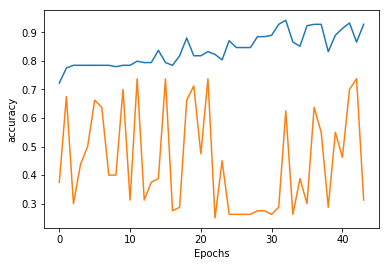

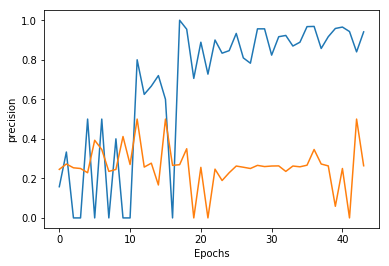

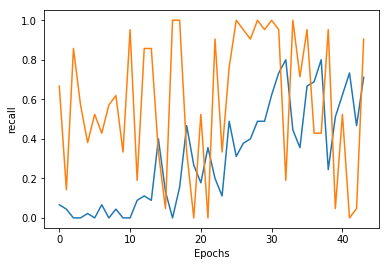

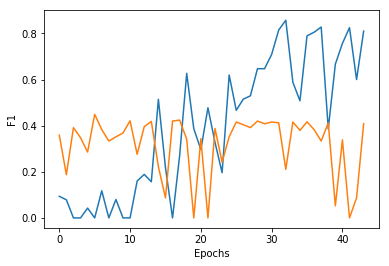

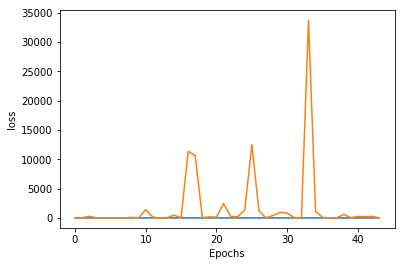

Epoch 45/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.24s/it, loss=0.084]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.057


precision: 0.972 ; recall: 0.778 ; F1: 0.864 ; accuracy: 0.947


- Eval metrics : accuracy: 0.312 ; Confusion_Matrix: 0.312 ; loss: 15.136


precision: 0.250 ; recall: 0.810 ; F1: 0.382 ; accuracy: 0.312


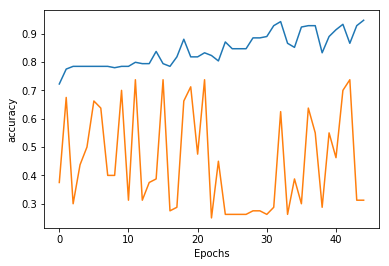

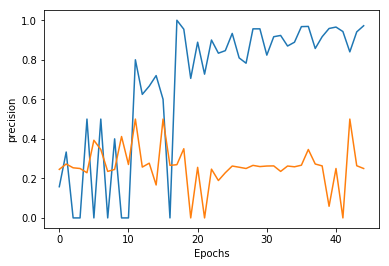

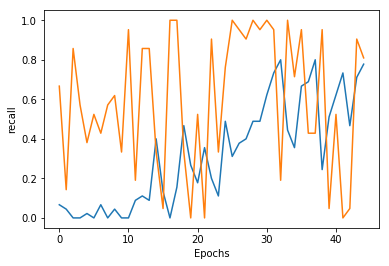

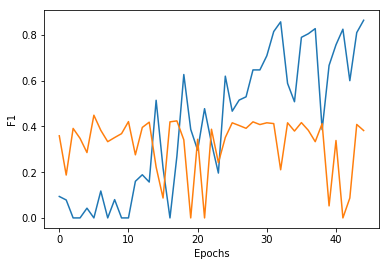

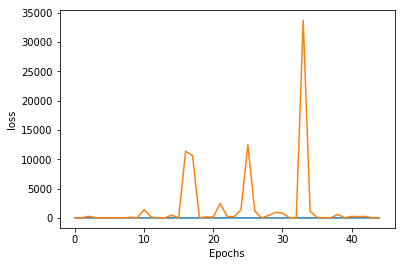

Checkpoint Directory exists! 


Epoch 46/1000
100%|██████████| 27/27 [00:35<00:00,  1.25s/it, loss=0.047]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.057


precision: 0.973 ; recall: 0.800 ; F1: 0.878 ; accuracy: 0.952


- Eval metrics : accuracy: 0.550 ; Confusion_Matrix: 0.550 ; loss: 12.887


precision: 0.222 ; recall: 0.286 ; F1: 0.250 ; accuracy: 0.550


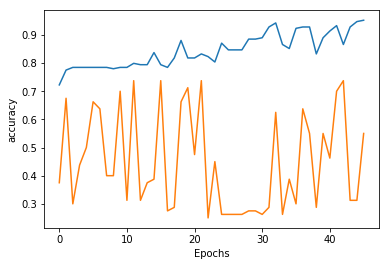

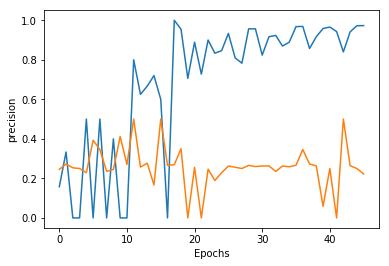

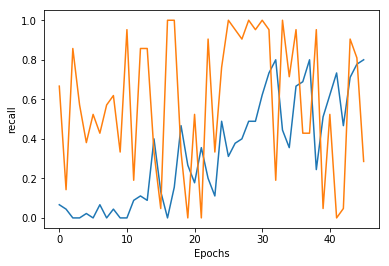

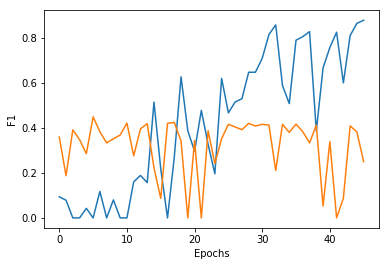

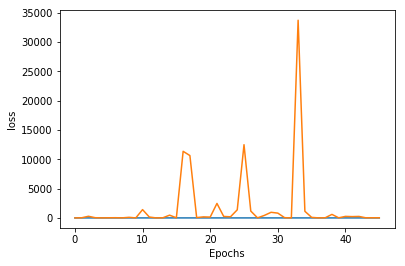

Epoch 47/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.17s/it, loss=0.099]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.022


precision: 0.900 ; recall: 0.800 ; F1: 0.847 ; accuracy: 0.938


- Eval metrics : accuracy: 0.662 ; Confusion_Matrix: 0.662 ; loss: 4.493


precision: 0.350 ; recall: 0.333 ; F1: 0.341 ; accuracy: 0.662


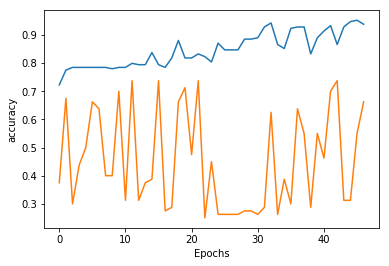

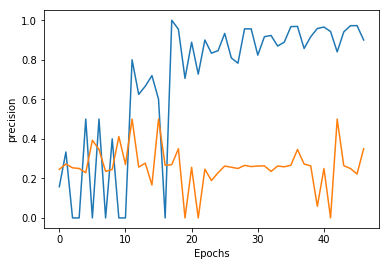

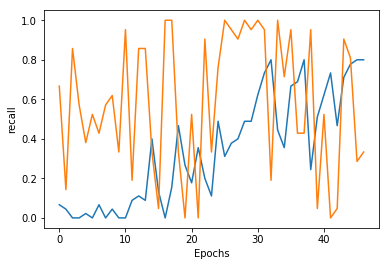

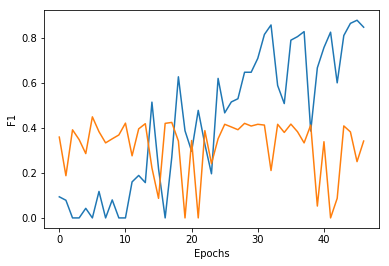

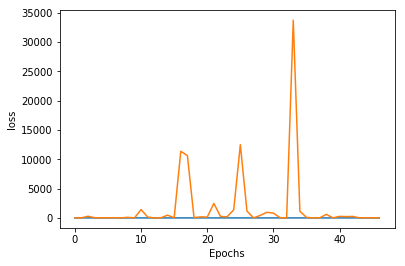

Epoch 48/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.26s/it, loss=0.271]
- Train metrics: accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 0.576


precision: 0.833 ; recall: 0.222 ; F1: 0.351 ; accuracy: 0.823


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 644.602


precision: 0.500 ; recall: 0.095 ; F1: 0.160 ; accuracy: 0.738


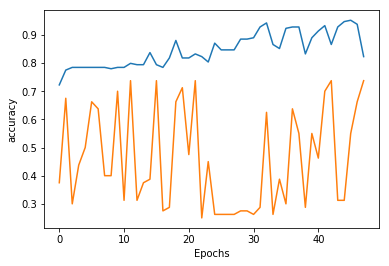

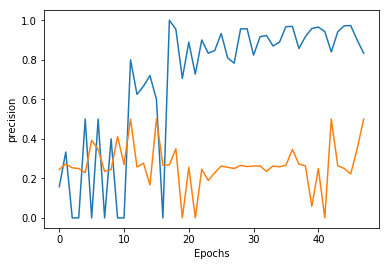

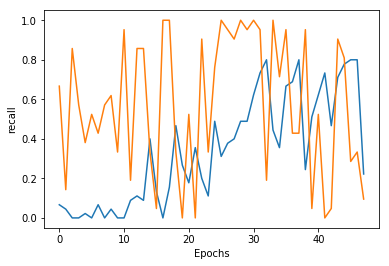

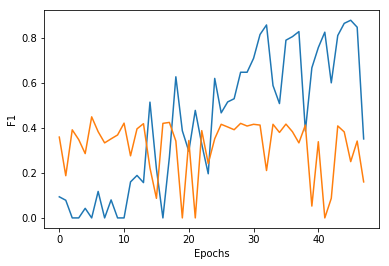

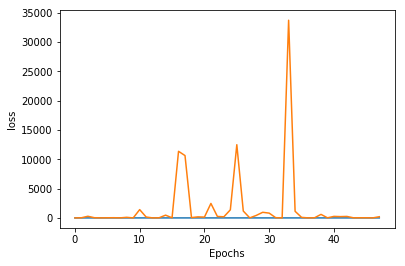

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 49/1000
100%|██████████| 27/27 [00:34<00:00,  1.29s/it, loss=0.125]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.310


precision: 0.967 ; recall: 0.644 ; F1: 0.773 ; accuracy: 0.919


- Eval metrics : accuracy: 0.338 ; Confusion_Matrix: 0.338 ; loss: 2897.907


precision: 0.284 ; recall: 1.000 ; F1: 0.442 ; accuracy: 0.338


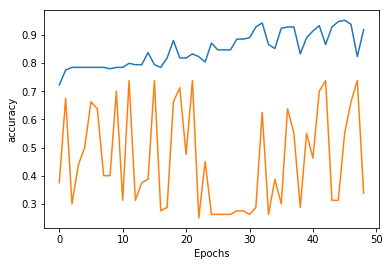

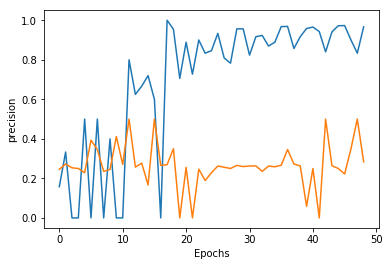

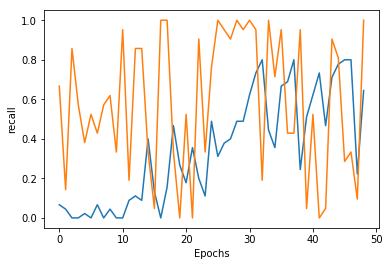

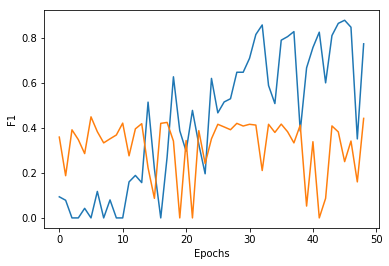

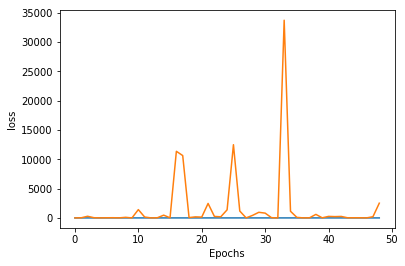

Epoch 50/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:38<00:00,  1.29s/it, loss=0.062]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.118


precision: 0.974 ; recall: 0.822 ; F1: 0.892 ; accuracy: 0.957


- Eval metrics : accuracy: 0.637 ; Confusion_Matrix: 0.637 ; loss: 8.200


precision: 0.318 ; recall: 0.333 ; F1: 0.326 ; accuracy: 0.637


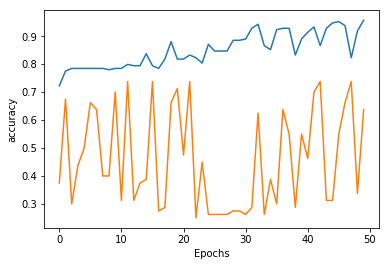

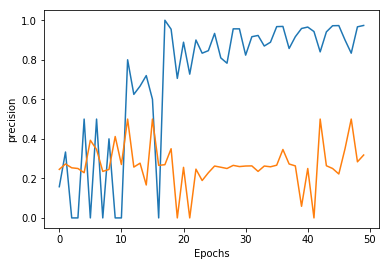

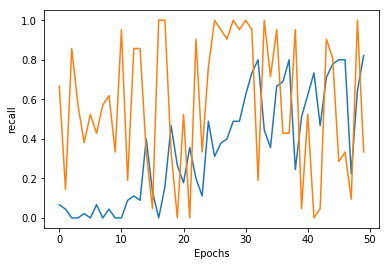

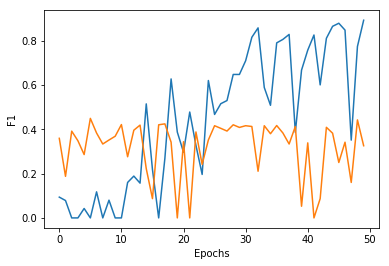

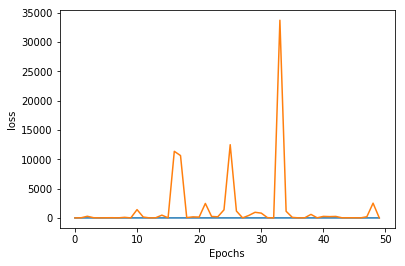

Epoch 51/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.05s/it, loss=0.050]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.026


precision: 0.952 ; recall: 0.889 ; F1: 0.920 ; accuracy: 0.967


- Eval metrics : accuracy: 0.662 ; Confusion_Matrix: 0.662 ; loss: 22.987


precision: 0.250 ; recall: 0.143 ; F1: 0.182 ; accuracy: 0.662


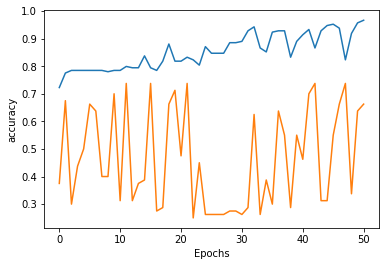

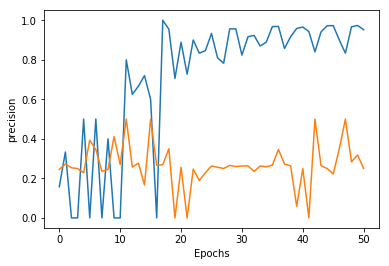

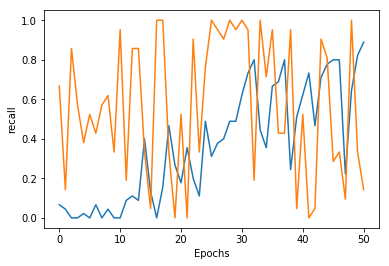

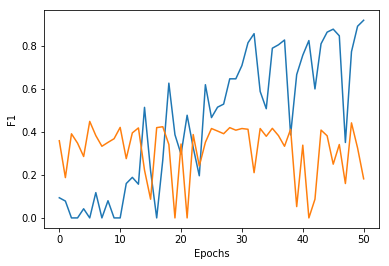

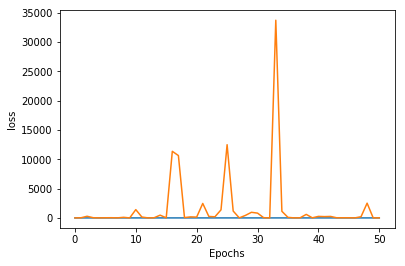

Epoch 52/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.28s/it, loss=0.053]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.010


precision: 0.953 ; recall: 0.911 ; F1: 0.932 ; accuracy: 0.971


- Eval metrics : accuracy: 0.525 ; Confusion_Matrix: 0.525 ; loss: 3.084


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.525


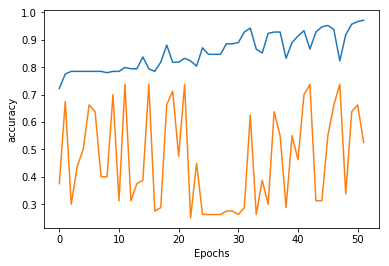

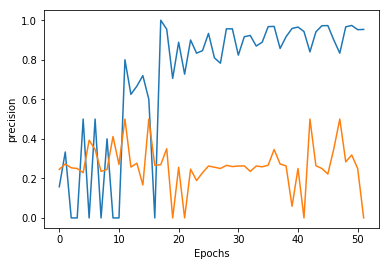

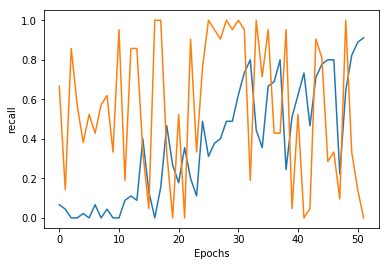

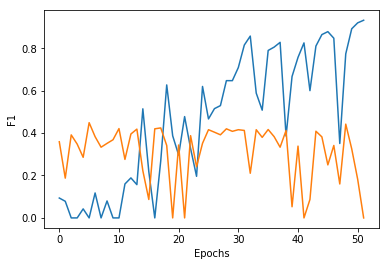

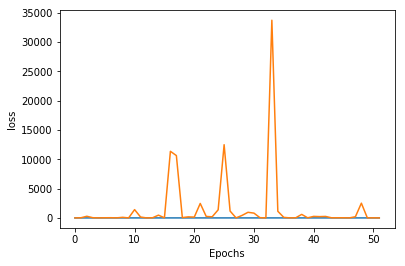

Checkpoint Directory exists! 


Epoch 53/1000
100%|██████████| 27/27 [00:39<00:00,  1.28s/it, loss=0.161]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.135


precision: 0.926 ; recall: 0.556 ; F1: 0.694 ; accuracy: 0.895


- Eval metrics : accuracy: 0.600 ; Confusion_Matrix: 0.600 ; loss: 8.721


precision: 0.261 ; recall: 0.286 ; F1: 0.273 ; accuracy: 0.600


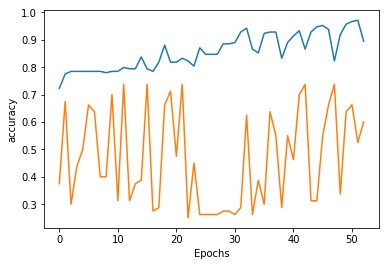

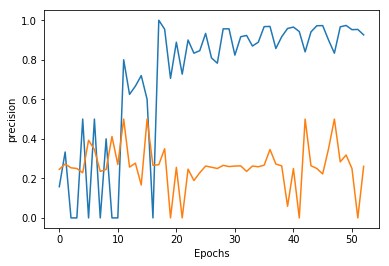

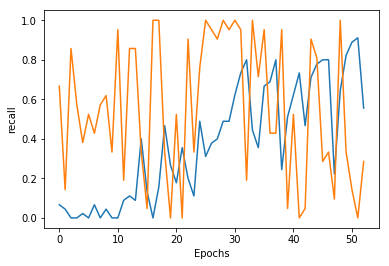

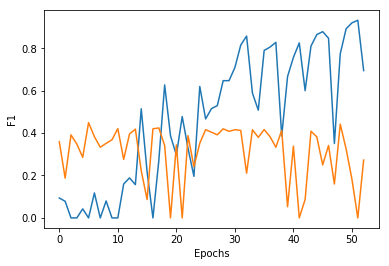

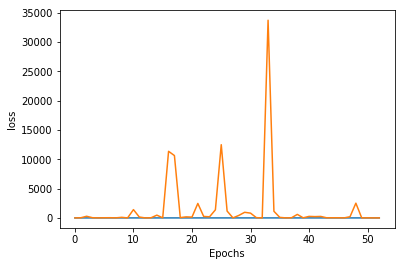

Epoch 54/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:45<00:00,  1.33s/it, loss=0.209]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.121


precision: 0.808 ; recall: 0.467 ; F1: 0.592 ; accuracy: 0.861


- Eval metrics : accuracy: 0.312 ; Confusion_Matrix: 0.312 ; loss: 2846.752


precision: 0.276 ; recall: 1.000 ; F1: 0.433 ; accuracy: 0.312


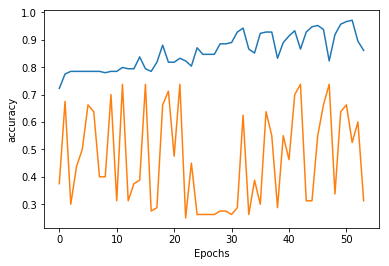

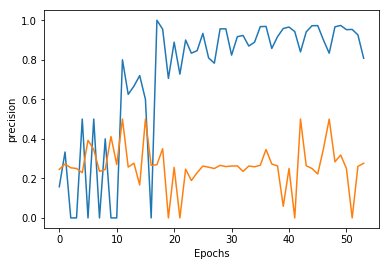

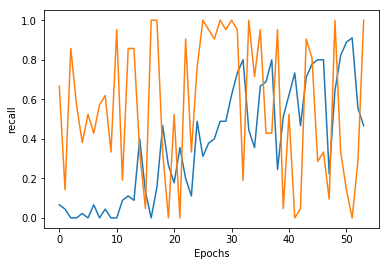

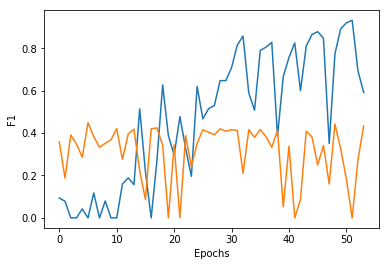

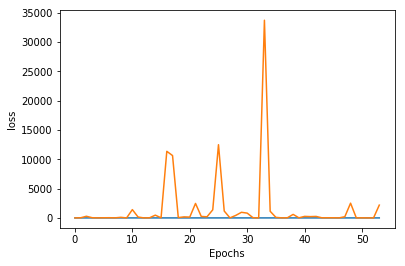

Epoch 55/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.26s/it, loss=0.238]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.135


precision: 0.929 ; recall: 0.578 ; F1: 0.712 ; accuracy: 0.900


- Eval metrics : accuracy: 0.637 ; Confusion_Matrix: 0.637 ; loss: 58.015


precision: 0.346 ; recall: 0.429 ; F1: 0.383 ; accuracy: 0.637


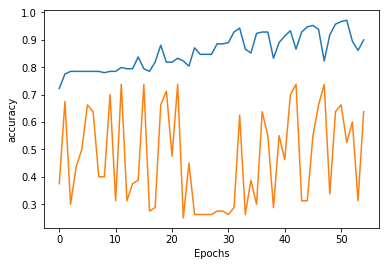

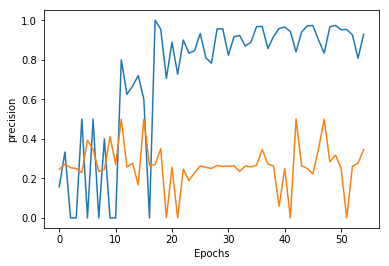

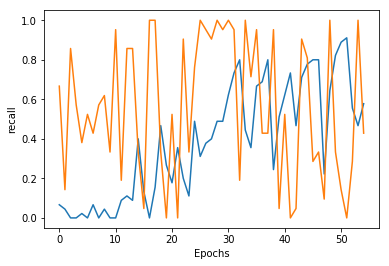

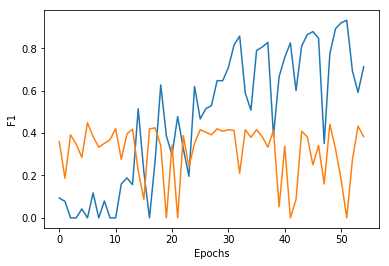

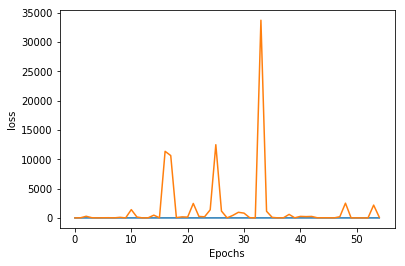

Epoch 56/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.23s/it, loss=0.231]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.045


precision: 0.941 ; recall: 0.711 ; F1: 0.810 ; accuracy: 0.928


- Eval metrics : accuracy: 0.725 ; Confusion_Matrix: 0.725 ; loss: 167.313


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.725


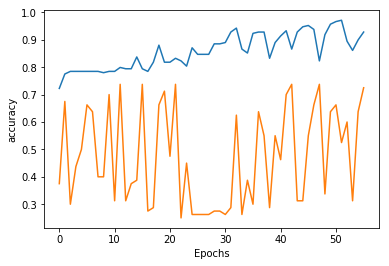

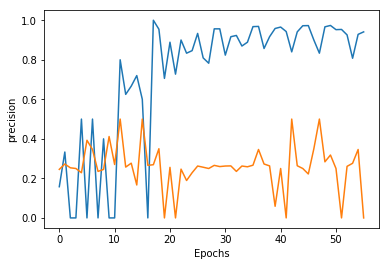

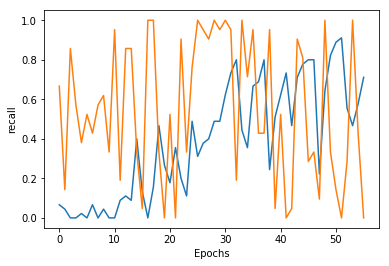

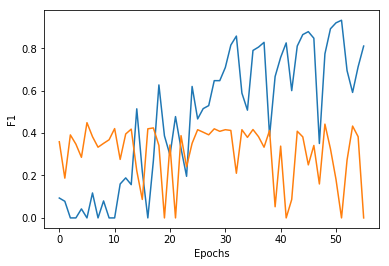

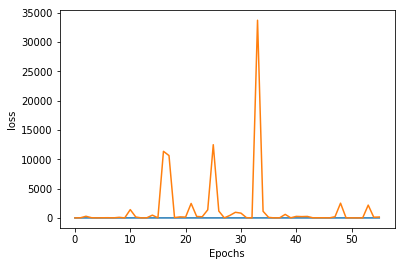

Epoch 57/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:34<00:00,  1.13s/it, loss=0.074]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.072


precision: 0.955 ; recall: 0.933 ; F1: 0.944 ; accuracy: 0.976


- Eval metrics : accuracy: 0.662 ; Confusion_Matrix: 0.662 ; loss: 580.427


precision: 0.286 ; recall: 0.190 ; F1: 0.229 ; accuracy: 0.662


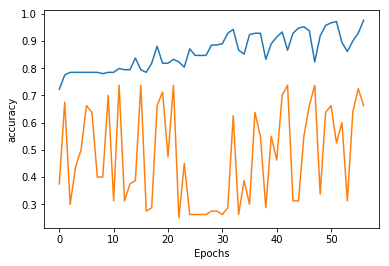

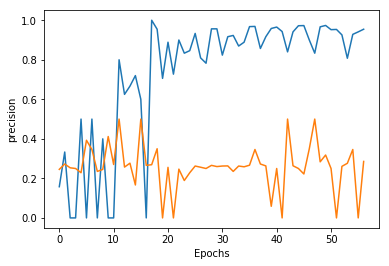

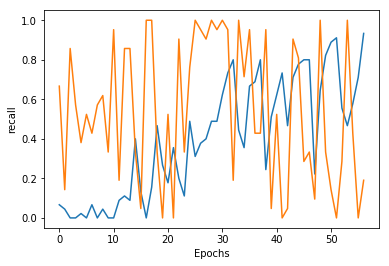

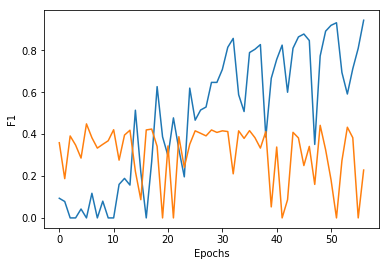

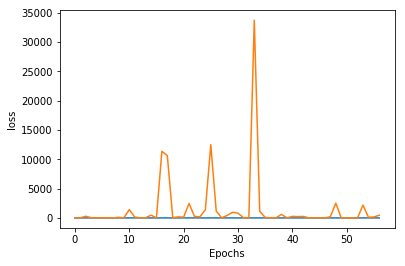

Epoch 58/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.23s/it, loss=0.057]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.034


precision: 0.955 ; recall: 0.933 ; F1: 0.944 ; accuracy: 0.976


- Eval metrics : accuracy: 0.662 ; Confusion_Matrix: 0.662 ; loss: 3585.907


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.662


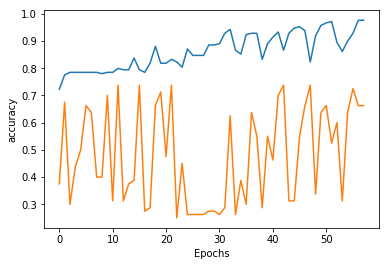

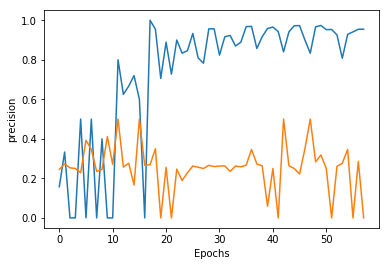

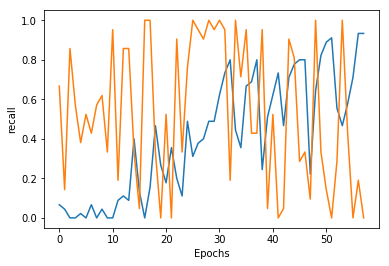

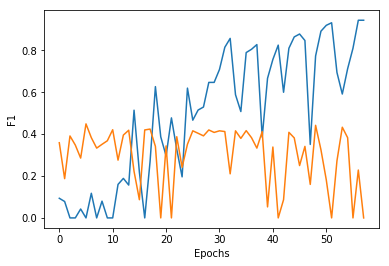

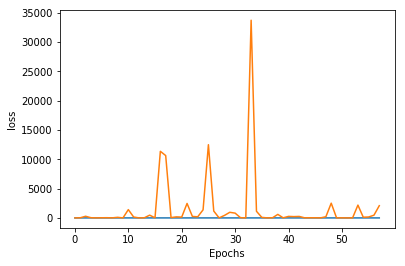

Epoch 59/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.19s/it, loss=0.081]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.005


precision: 0.972 ; recall: 0.778 ; F1: 0.864 ; accuracy: 0.947


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 2828.870


precision: 0.500 ; recall: 0.048 ; F1: 0.087 ; accuracy: 0.738


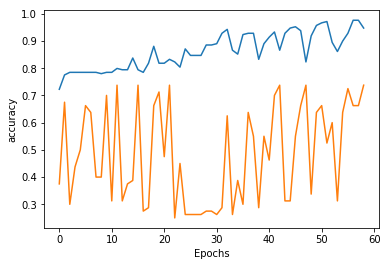

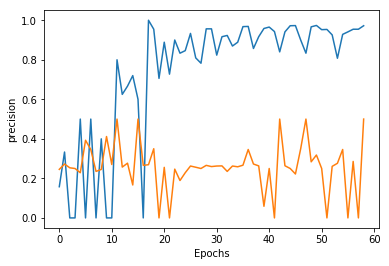

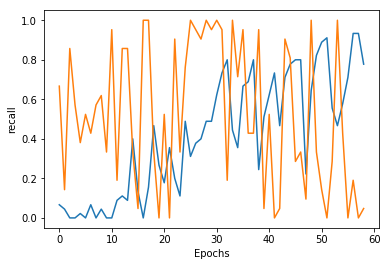

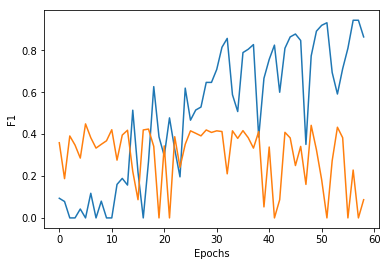

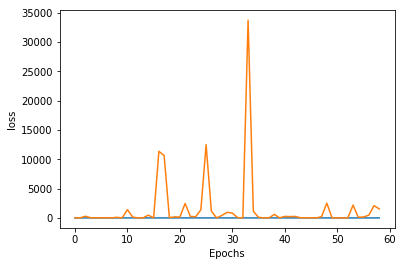

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 60/1000
100%|██████████| 27/27 [00:34<00:00,  1.20s/it, loss=0.265]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.009


precision: 0.951 ; recall: 0.867 ; F1: 0.907 ; accuracy: 0.962


- Eval metrics : accuracy: 0.500 ; Confusion_Matrix: 0.500 ; loss: 53.829


precision: 0.321 ; recall: 0.810 ; F1: 0.459 ; accuracy: 0.500


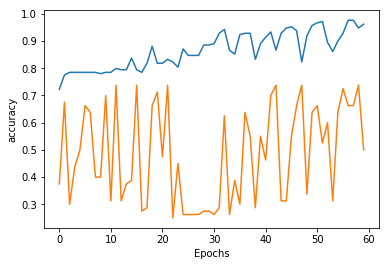

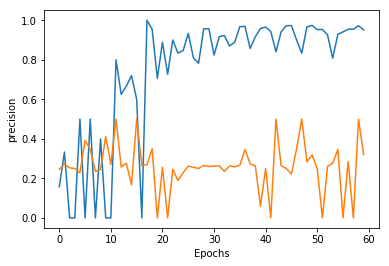

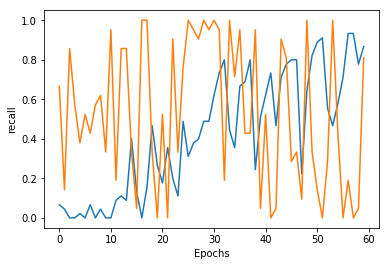

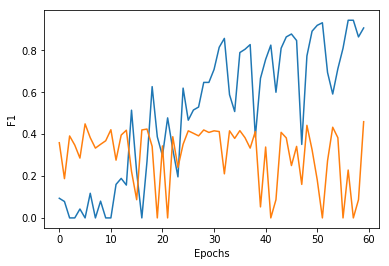

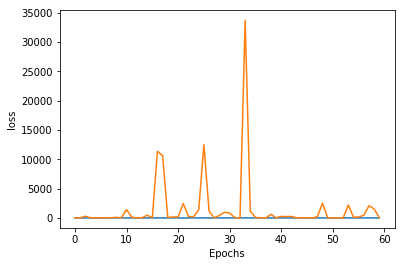

Epoch 61/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.23s/it, loss=0.100]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.047


precision: 0.944 ; recall: 0.756 ; F1: 0.840 ; accuracy: 0.938


- Eval metrics : accuracy: 0.388 ; Confusion_Matrix: 0.388 ; loss: 22.003


precision: 0.250 ; recall: 0.667 ; F1: 0.364 ; accuracy: 0.388


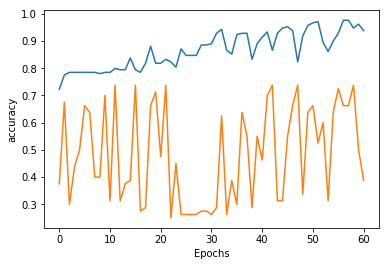

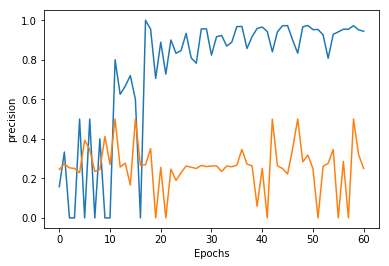

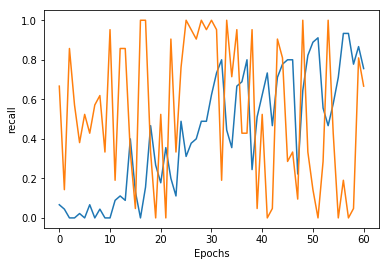

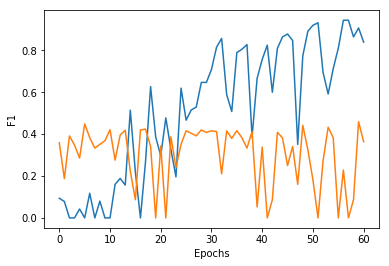

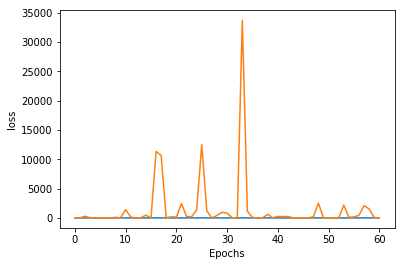

Epoch 62/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.18s/it, loss=0.064]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.016


precision: 0.974 ; recall: 0.844 ; F1: 0.905 ; accuracy: 0.962


- Eval metrics : accuracy: 0.675 ; Confusion_Matrix: 0.675 ; loss: 400.310


precision: 0.333 ; recall: 0.238 ; F1: 0.278 ; accuracy: 0.675


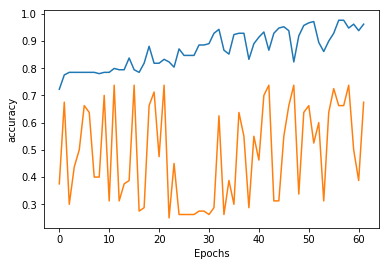

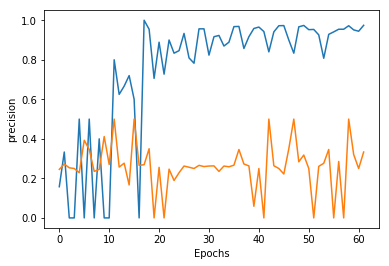

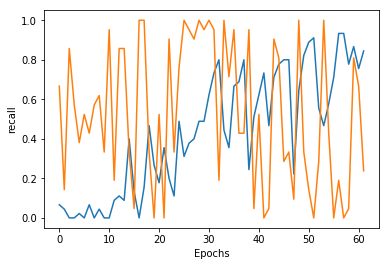

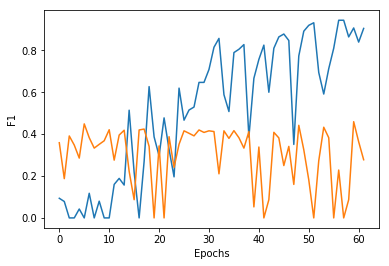

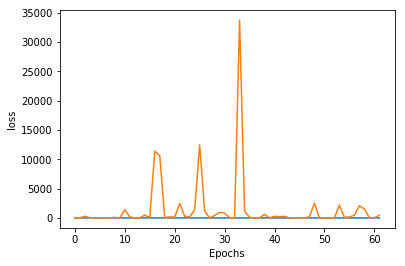

Checkpoint Directory exists! 


Epoch 63/1000
100%|██████████| 27/27 [00:35<00:00,  1.08s/it, loss=0.121]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.042


precision: 0.897 ; recall: 0.778 ; F1: 0.833 ; accuracy: 0.933


- Eval metrics : accuracy: 0.675 ; Confusion_Matrix: 0.675 ; loss: 131.101


precision: 0.353 ; recall: 0.286 ; F1: 0.316 ; accuracy: 0.675


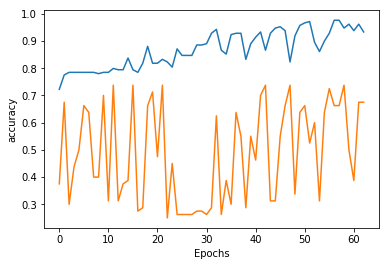

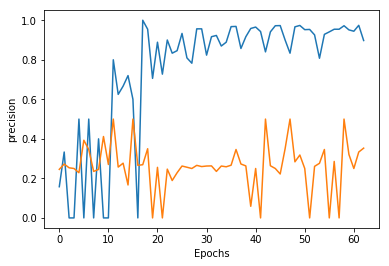

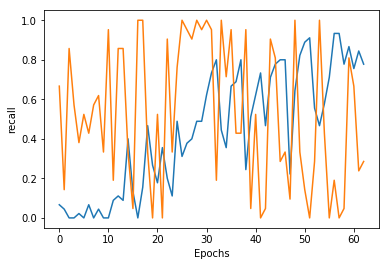

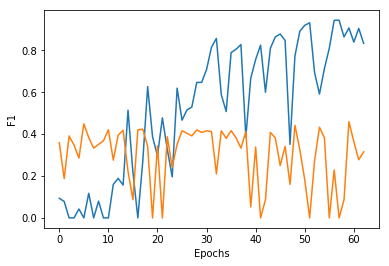

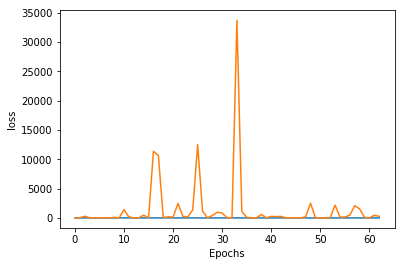

Epoch 64/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.43s/it, loss=0.241]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.064


precision: 1.000 ; recall: 0.800 ; F1: 0.889 ; accuracy: 0.957


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 451.740


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


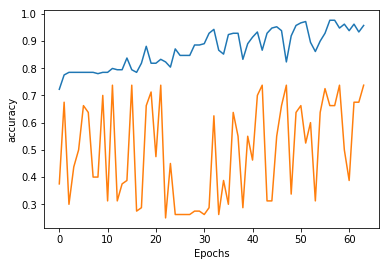

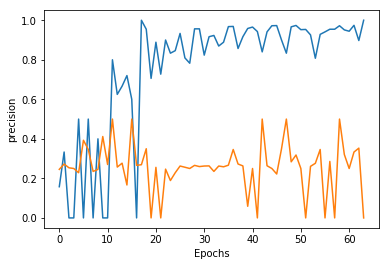

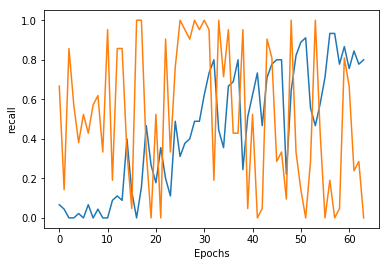

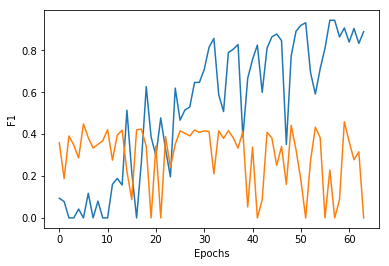

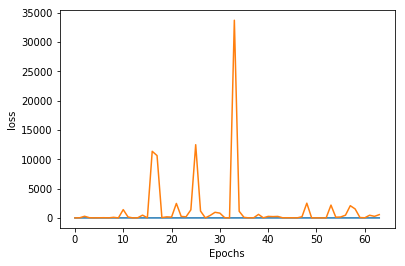

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 65/1000
100%|██████████| 27/27 [00:39<00:00,  1.28s/it, loss=0.069]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.051


precision: 0.938 ; recall: 1.000 ; F1: 0.968 ; accuracy: 0.986


- Eval metrics : accuracy: 0.275 ; Confusion_Matrix: 0.275 ; loss: 463.803


precision: 0.266 ; recall: 1.000 ; F1: 0.420 ; accuracy: 0.275


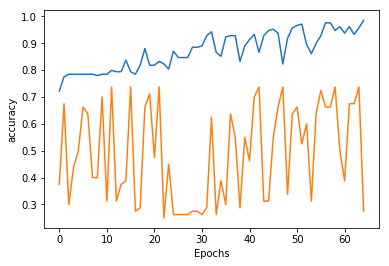

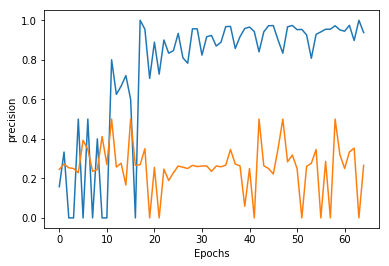

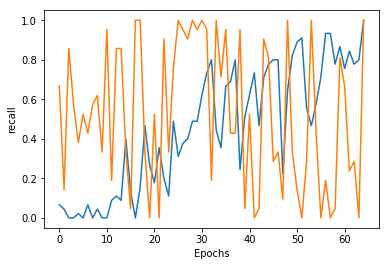

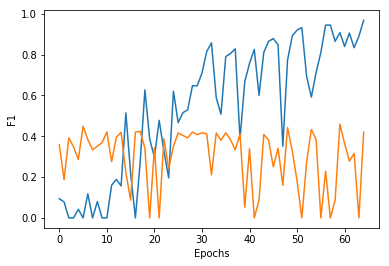

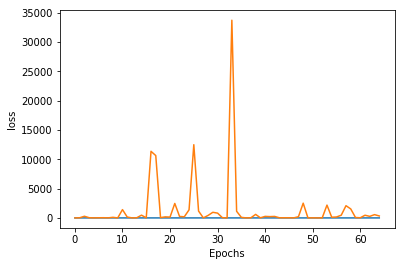

Checkpoint Directory exists! 


Epoch 66/1000
100%|██████████| 27/27 [00:36<00:00,  1.18s/it, loss=0.085]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.570


precision: 0.972 ; recall: 0.778 ; F1: 0.864 ; accuracy: 0.947


- Eval metrics : accuracy: 0.537 ; Confusion_Matrix: 0.537 ; loss: 39.036


precision: 0.265 ; recall: 0.429 ; F1: 0.327 ; accuracy: 0.537


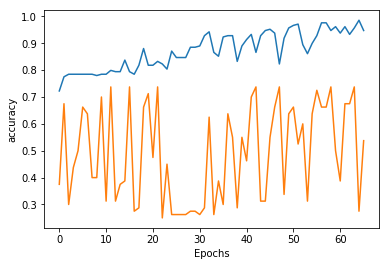

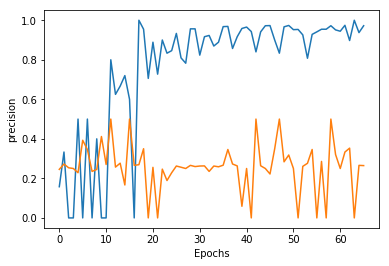

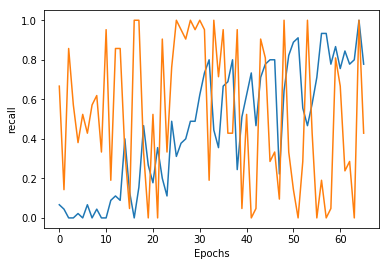

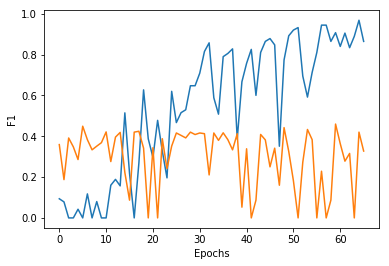

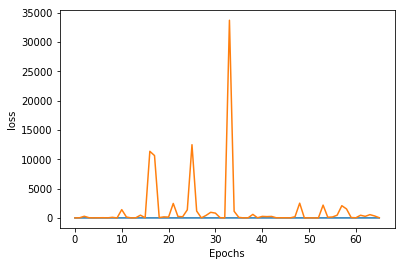

Checkpoint Directory exists! 


Epoch 67/1000
100%|██████████| 27/27 [00:37<00:00,  1.22s/it, loss=0.224]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.150


precision: 0.953 ; recall: 0.911 ; F1: 0.932 ; accuracy: 0.971


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 45.759


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


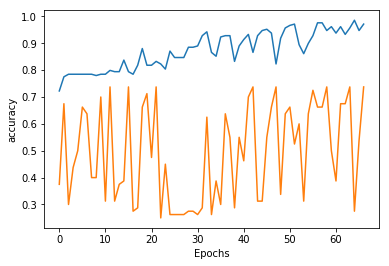

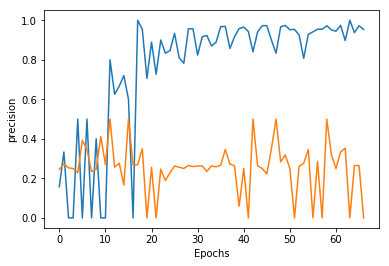

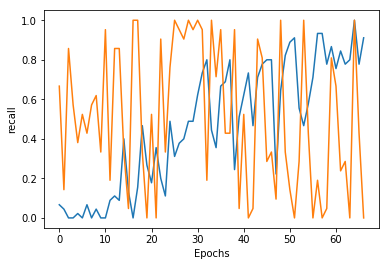

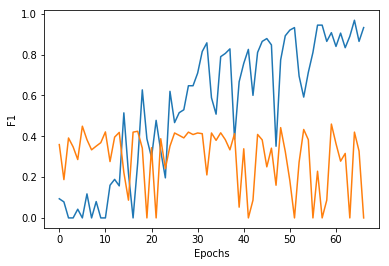

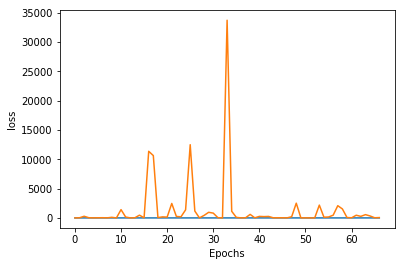

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 68/1000
100%|██████████| 27/27 [00:38<00:00,  1.34s/it, loss=0.062]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.144


precision: 0.956 ; recall: 0.956 ; F1: 0.956 ; accuracy: 0.981


- Eval metrics : accuracy: 0.287 ; Confusion_Matrix: 0.287 ; loss: 21.619


precision: 0.269 ; recall: 1.000 ; F1: 0.424 ; accuracy: 0.287


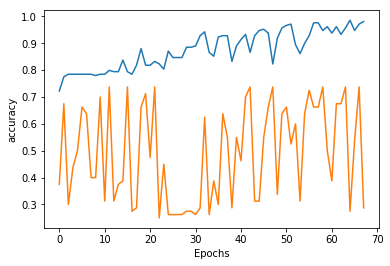

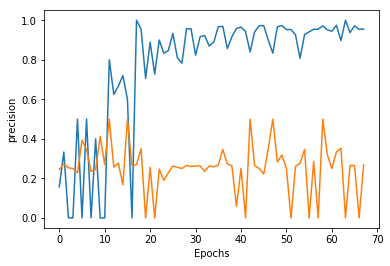

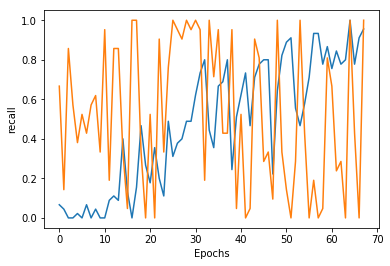

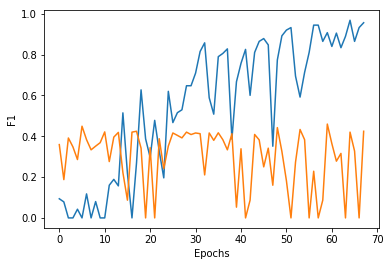

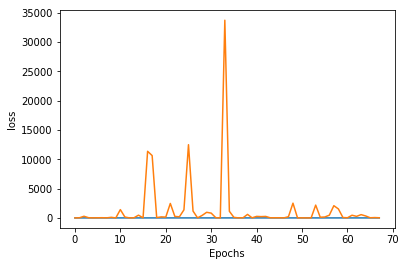

Checkpoint Directory exists! 


Epoch 69/1000
100%|██████████| 27/27 [00:46<00:00,  1.25s/it, loss=0.125]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.068


precision: 0.925 ; recall: 0.822 ; F1: 0.871 ; accuracy: 0.947


- Eval metrics : accuracy: 0.675 ; Confusion_Matrix: 0.675 ; loss: 53.579


precision: 0.143 ; recall: 0.048 ; F1: 0.071 ; accuracy: 0.675


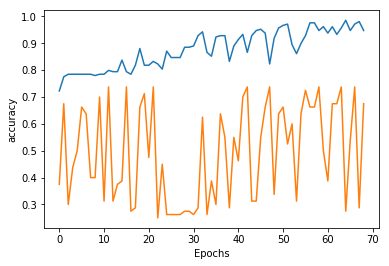

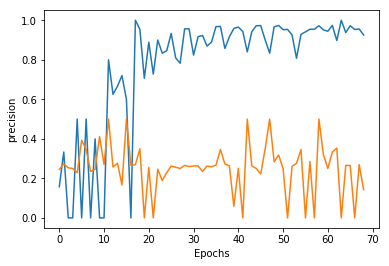

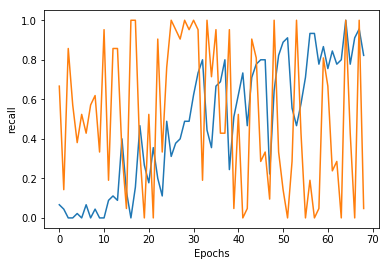

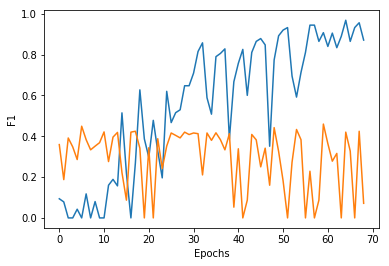

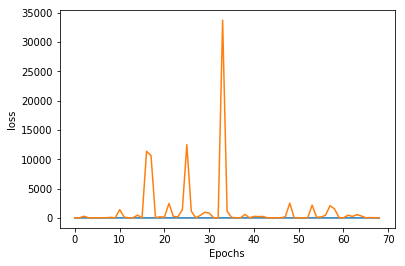

Epoch 70/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:34<00:00,  1.02it/s, loss=0.229]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.195


precision: 0.946 ; recall: 0.778 ; F1: 0.854 ; accuracy: 0.943


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 273.718


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


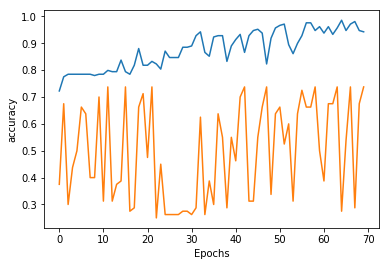

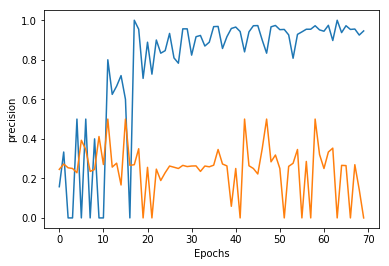

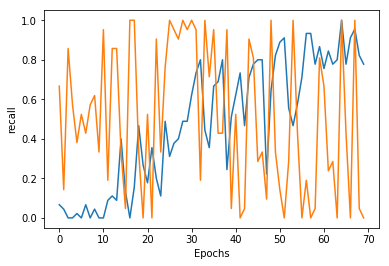

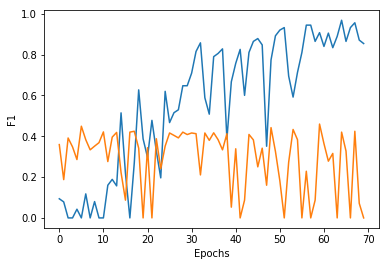

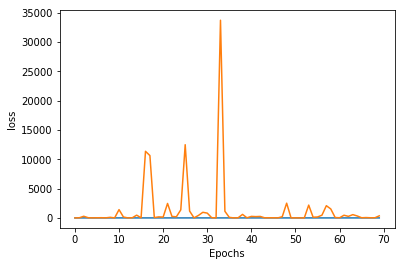

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 71/1000
100%|██████████| 27/27 [00:37<00:00,  1.36s/it, loss=0.172]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.009


precision: 0.929 ; recall: 0.867 ; F1: 0.897 ; accuracy: 0.957


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 102.189


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


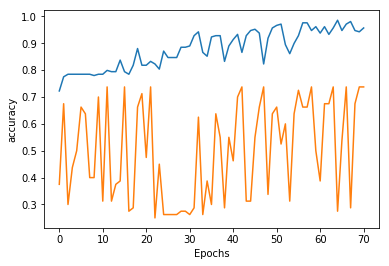

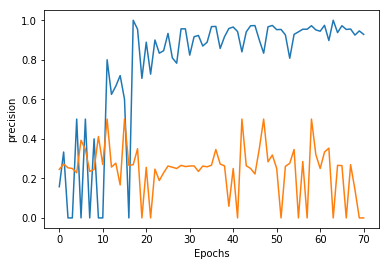

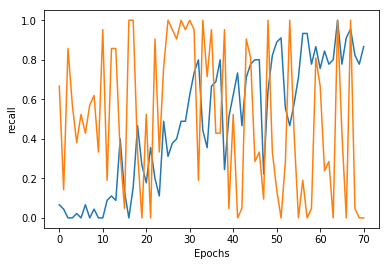

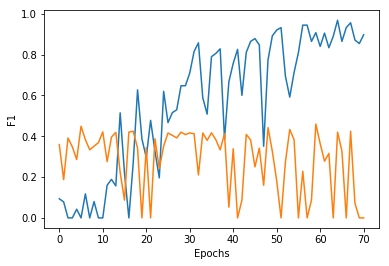

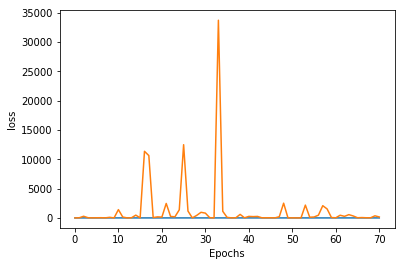

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 72/1000
100%|██████████| 27/27 [00:36<00:00,  1.19s/it, loss=0.071]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.010


precision: 0.938 ; recall: 1.000 ; F1: 0.968 ; accuracy: 0.986


- Eval metrics : accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 50.014


precision: 0.571 ; recall: 0.190 ; F1: 0.286 ; accuracy: 0.750


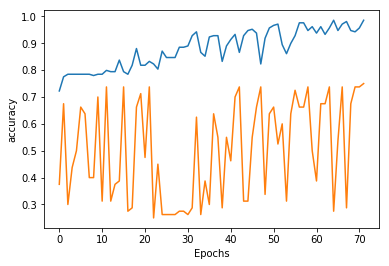

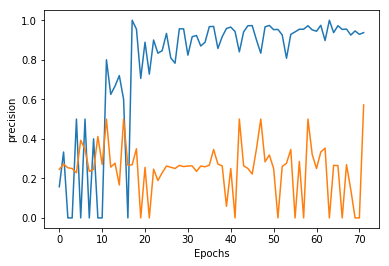

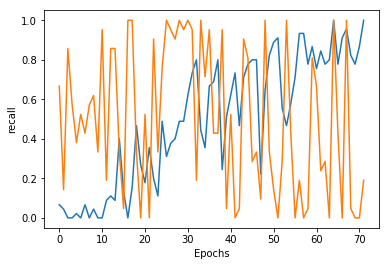

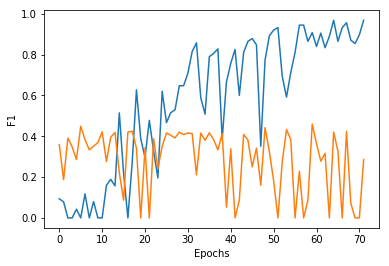

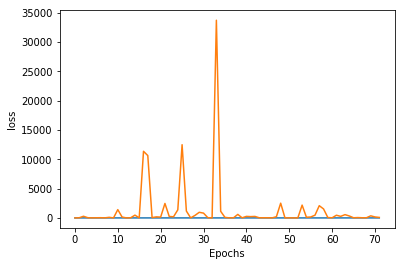

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 73/1000
100%|██████████| 27/27 [00:36<00:00,  1.22s/it, loss=0.017]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.042


precision: 1.000 ; recall: 0.978 ; F1: 0.989 ; accuracy: 0.995


- Eval metrics : accuracy: 0.700 ; Confusion_Matrix: 0.700 ; loss: 25.928


precision: 0.333 ; recall: 0.143 ; F1: 0.200 ; accuracy: 0.700


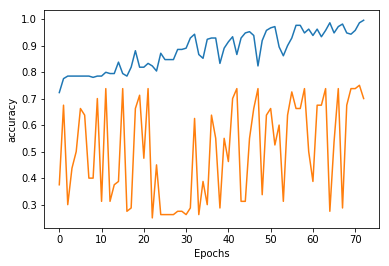

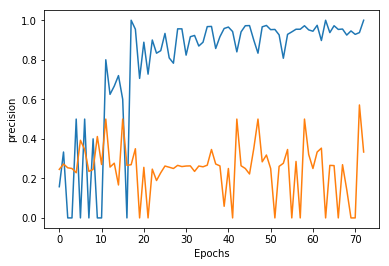

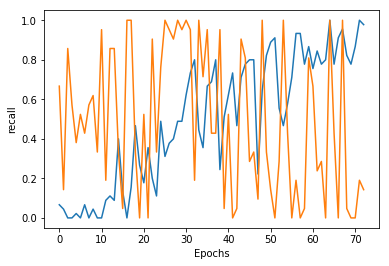

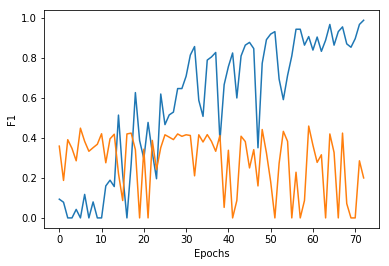

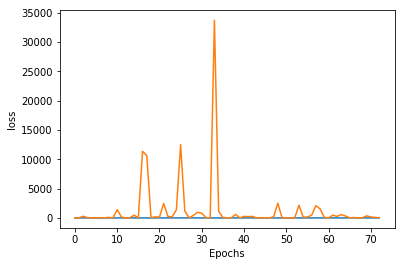

Epoch 74/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.21s/it, loss=0.024]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.064


precision: 1.000 ; recall: 0.978 ; F1: 0.989 ; accuracy: 0.995


- Eval metrics : accuracy: 0.600 ; Confusion_Matrix: 0.600 ; loss: 14.348


precision: 0.077 ; recall: 0.048 ; F1: 0.059 ; accuracy: 0.600


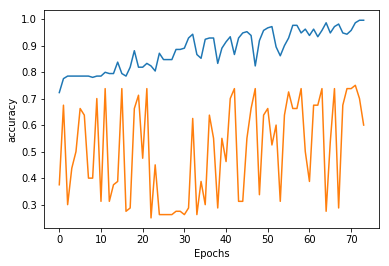

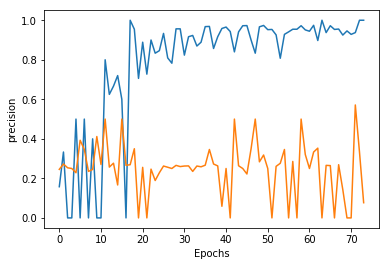

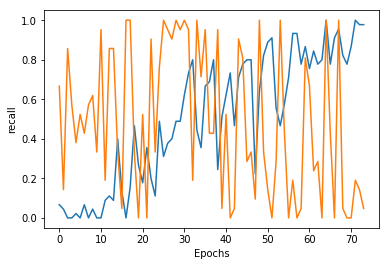

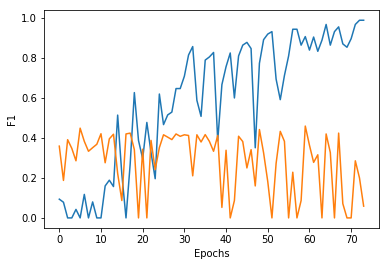

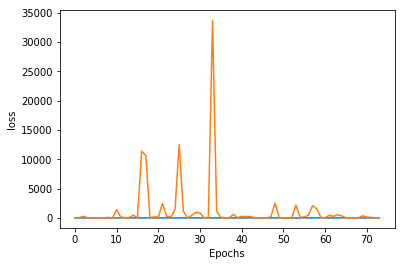

Epoch 75/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.25s/it, loss=0.012]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.004


precision: 1.000 ; recall: 1.000 ; F1: 1.000 ; accuracy: 1.000


- Eval metrics : accuracy: 0.463 ; Confusion_Matrix: 0.463 ; loss: 28.079


precision: 0.211 ; recall: 0.381 ; F1: 0.271 ; accuracy: 0.463


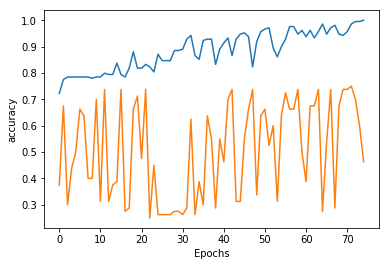

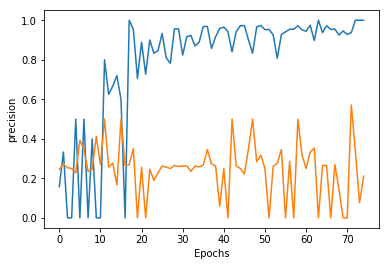

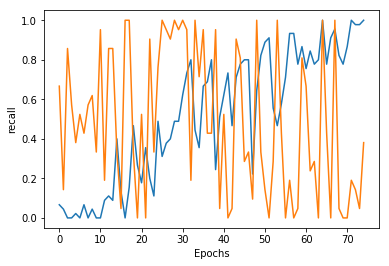

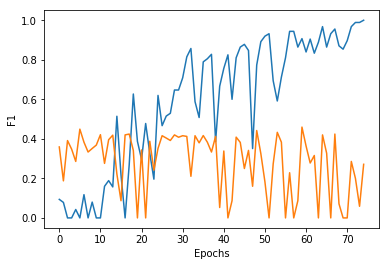

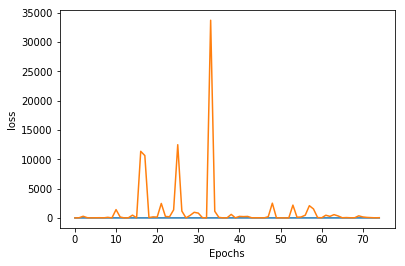

Epoch 76/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.28s/it, loss=0.242]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.018


precision: 0.956 ; recall: 0.956 ; F1: 0.956 ; accuracy: 0.981


- Eval metrics : accuracy: 0.713 ; Confusion_Matrix: 0.713 ; loss: 30.777


precision: 0.375 ; recall: 0.143 ; F1: 0.207 ; accuracy: 0.713


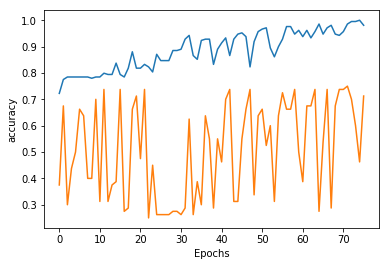

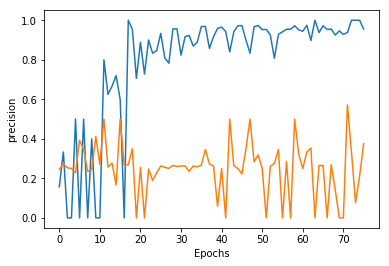

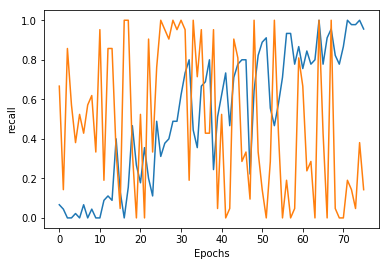

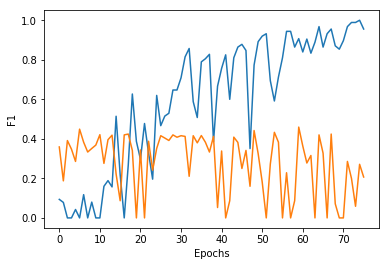

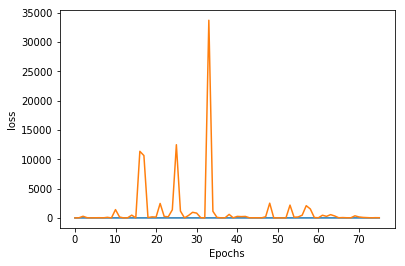

Checkpoint Directory exists! 


Epoch 77/1000
100%|██████████| 27/27 [00:37<00:00,  1.38s/it, loss=0.110]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.002


precision: 0.971 ; recall: 0.733 ; F1: 0.835 ; accuracy: 0.938


- Eval metrics : accuracy: 0.425 ; Confusion_Matrix: 0.425 ; loss: 4.669


precision: 0.255 ; recall: 0.619 ; F1: 0.361 ; accuracy: 0.425


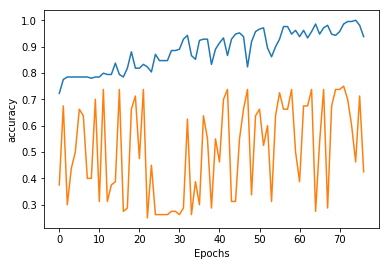

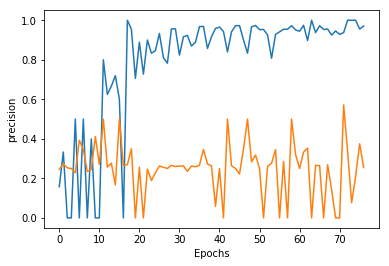

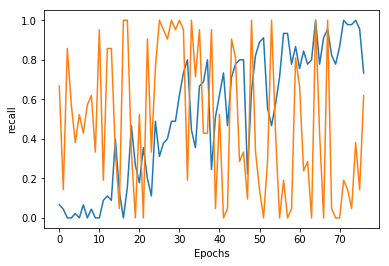

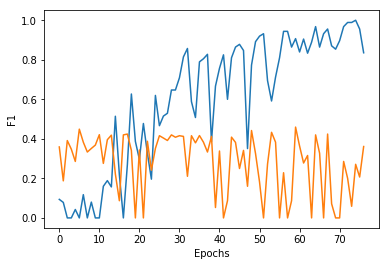

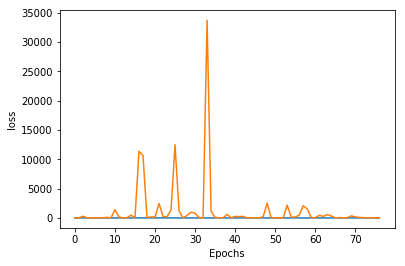

Epoch 78/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.13s/it, loss=0.069]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.087


precision: 0.911 ; recall: 0.911 ; F1: 0.911 ; accuracy: 0.962


- Eval metrics : accuracy: 0.613 ; Confusion_Matrix: 0.613 ; loss: 35.657


precision: 0.143 ; recall: 0.095 ; F1: 0.114 ; accuracy: 0.613


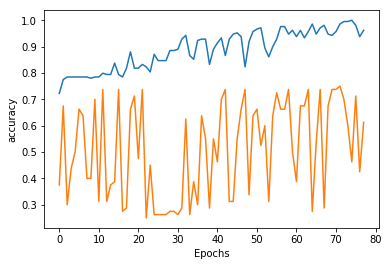

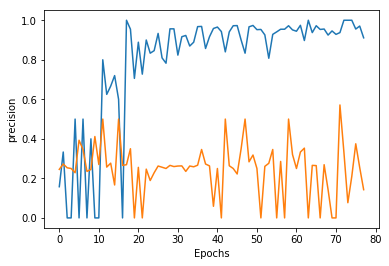

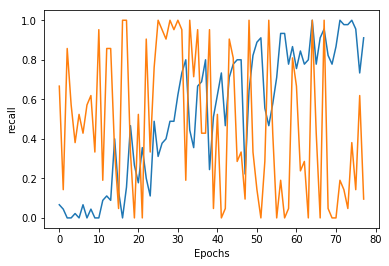

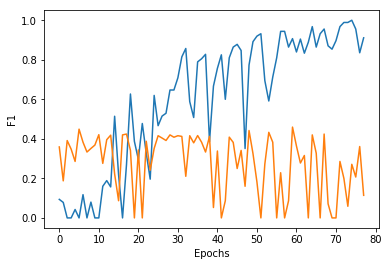

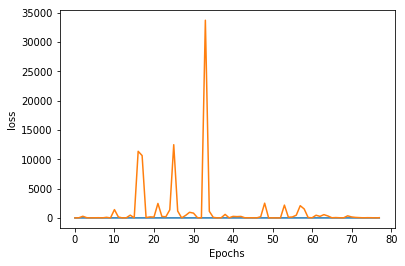

Epoch 79/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.33s/it, loss=0.037]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.058


precision: 0.977 ; recall: 0.933 ; F1: 0.955 ; accuracy: 0.981


- Eval metrics : accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 13.357


precision: 0.200 ; recall: 0.143 ; F1: 0.167 ; accuracy: 0.625


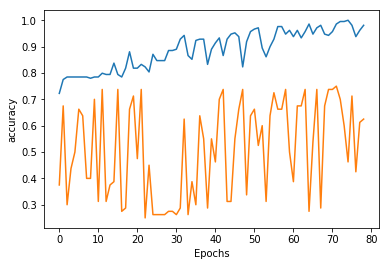

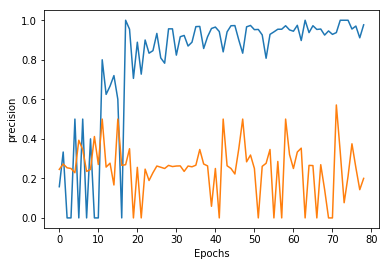

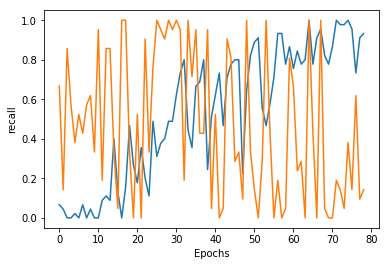

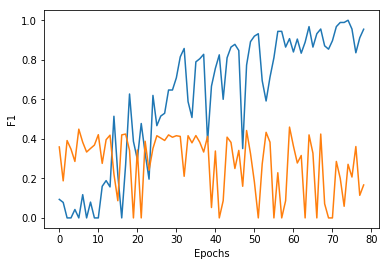

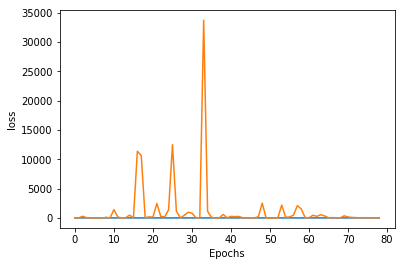

Epoch 80/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:38<00:00,  1.30s/it, loss=0.021]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.009


precision: 1.000 ; recall: 0.978 ; F1: 0.989 ; accuracy: 0.995


- Eval metrics : accuracy: 0.562 ; Confusion_Matrix: 0.562 ; loss: 7.664


precision: 0.208 ; recall: 0.238 ; F1: 0.222 ; accuracy: 0.562


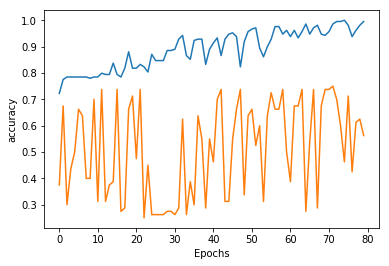

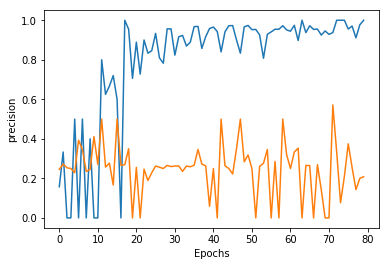

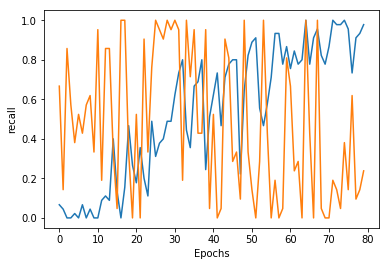

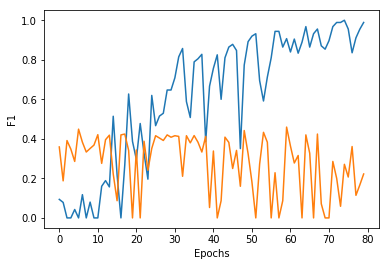

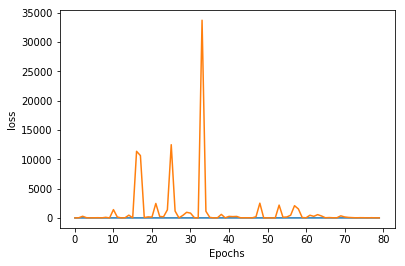

Epoch 81/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:38<00:00,  1.32s/it, loss=0.031]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.002


precision: 0.956 ; recall: 0.956 ; F1: 0.956 ; accuracy: 0.981


- Eval metrics : accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 28.697


precision: 0.263 ; recall: 0.238 ; F1: 0.250 ; accuracy: 0.625


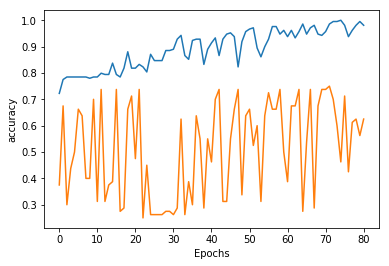

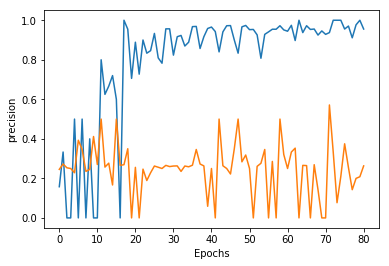

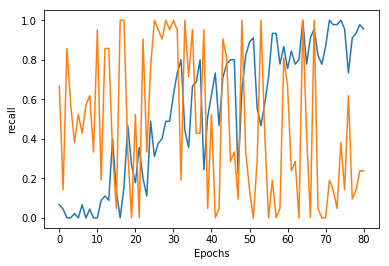

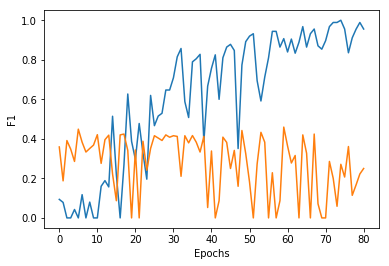

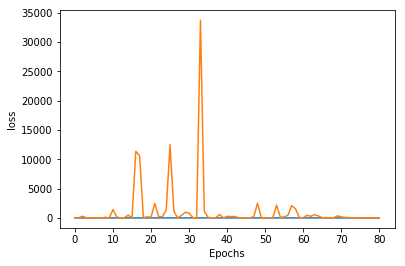

Epoch 82/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.19s/it, loss=0.039]
- Train metrics: accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 0.212


precision: 0.975 ; recall: 0.867 ; F1: 0.918 ; accuracy: 0.967


- Eval metrics : accuracy: 0.600 ; Confusion_Matrix: 0.600 ; loss: 5.568


precision: 0.238 ; recall: 0.238 ; F1: 0.238 ; accuracy: 0.600


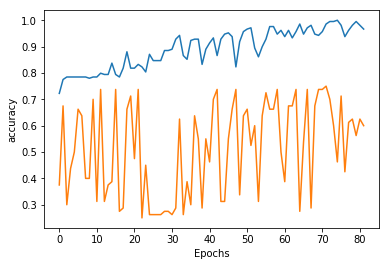

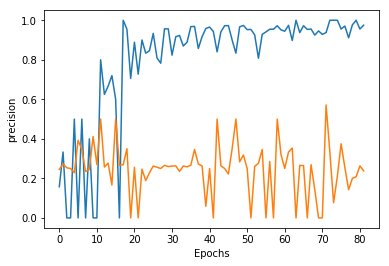

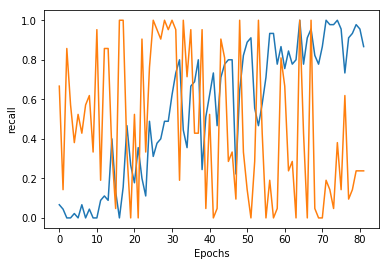

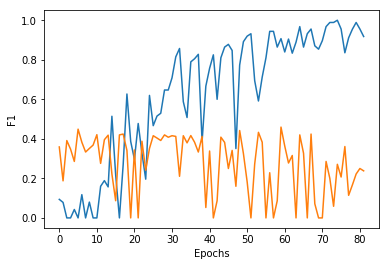

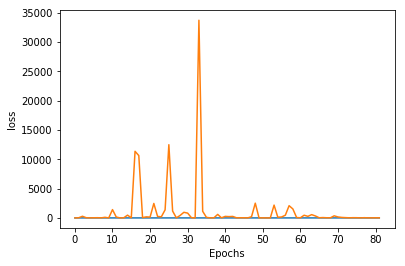

Epoch 83/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:39<00:00,  1.46s/it, loss=0.261]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.013


precision: 0.932 ; recall: 0.911 ; F1: 0.921 ; accuracy: 0.967


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 634.545


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


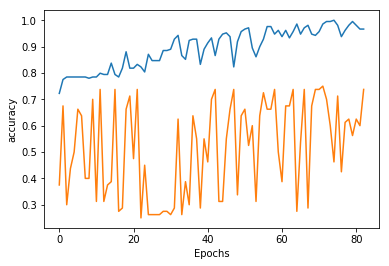

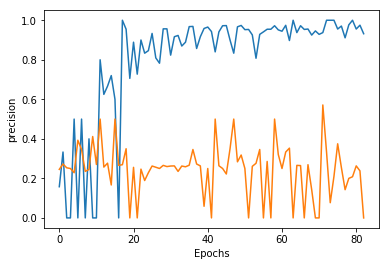

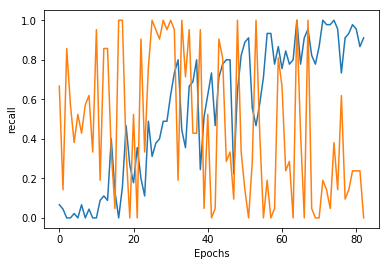

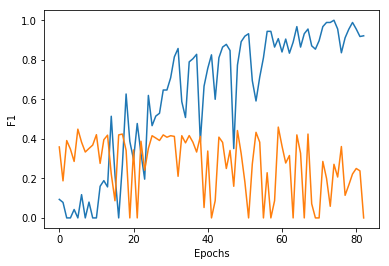

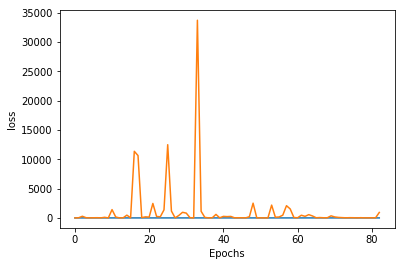

Epoch 84/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:50<00:00,  1.34s/it, loss=0.205]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.018


precision: 0.949 ; recall: 0.822 ; F1: 0.881 ; accuracy: 0.952


- Eval metrics : accuracy: 0.275 ; Confusion_Matrix: 0.275 ; loss: 1653.398


precision: 0.266 ; recall: 1.000 ; F1: 0.420 ; accuracy: 0.275


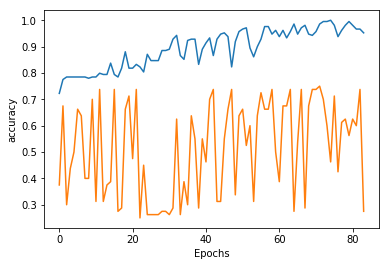

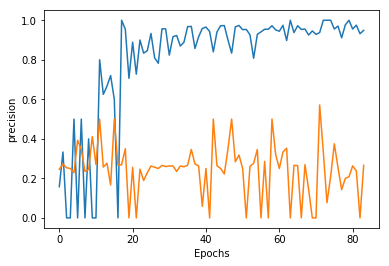

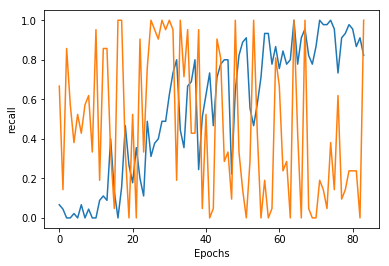

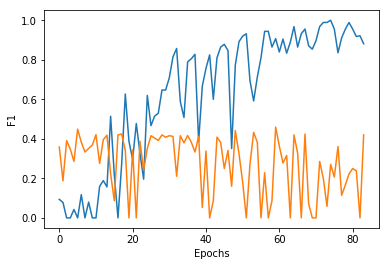

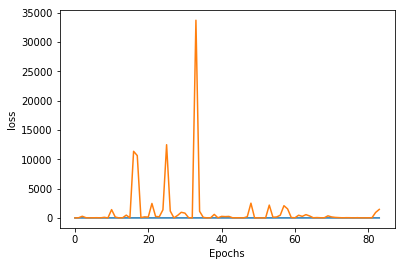

Epoch 85/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.32s/it, loss=0.117]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.022


precision: 0.909 ; recall: 0.889 ; F1: 0.899 ; accuracy: 0.957


- Eval metrics : accuracy: 0.287 ; Confusion_Matrix: 0.287 ; loss: 23.120


precision: 0.269 ; recall: 1.000 ; F1: 0.424 ; accuracy: 0.287


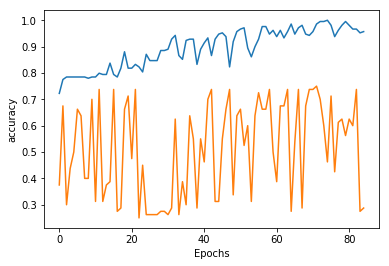

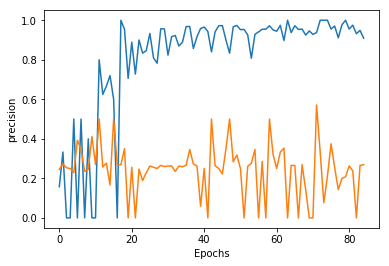

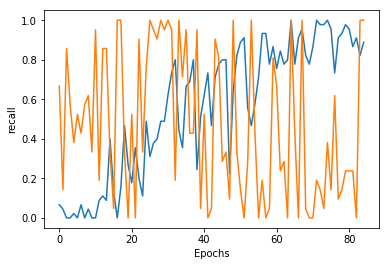

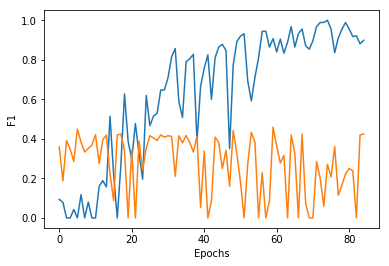

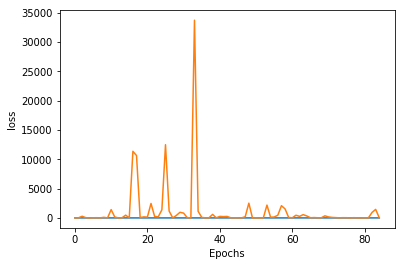

Epoch 86/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.13s/it, loss=0.037]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.059


precision: 1.000 ; recall: 0.956 ; F1: 0.977 ; accuracy: 0.990


- Eval metrics : accuracy: 0.537 ; Confusion_Matrix: 0.537 ; loss: 14.076


precision: 0.250 ; recall: 0.381 ; F1: 0.302 ; accuracy: 0.537


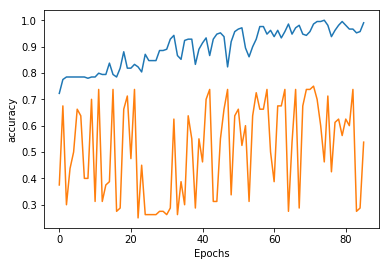

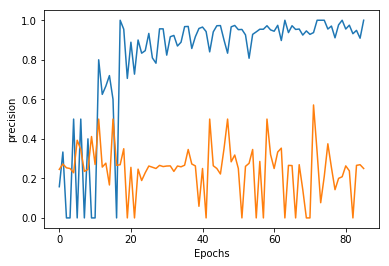

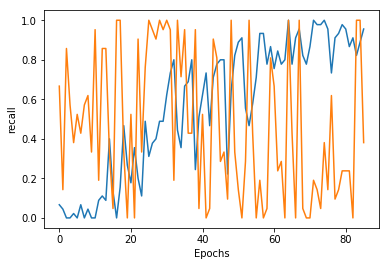

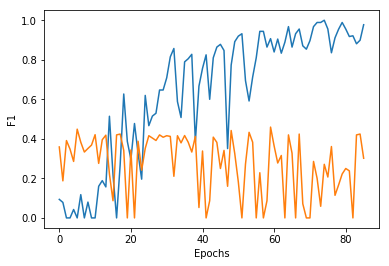

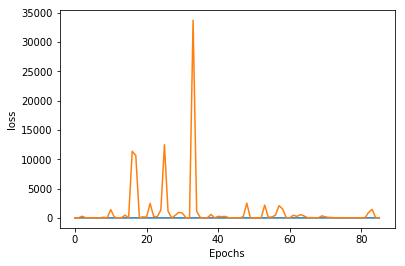

Epoch 87/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.27s/it, loss=0.017]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.069


precision: 1.000 ; recall: 0.978 ; F1: 0.989 ; accuracy: 0.995


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 1288.145


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


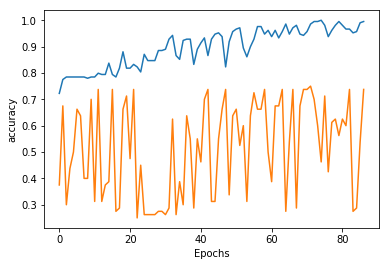

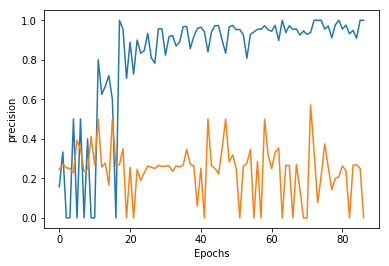

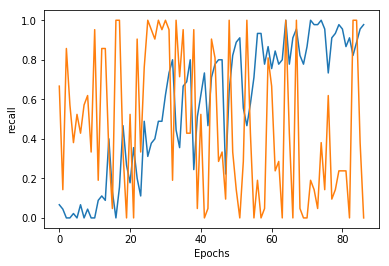

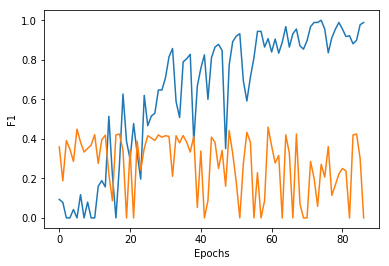

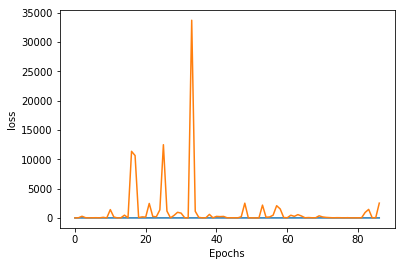

Epoch 88/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.16s/it, loss=0.016]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.004


precision: 1.000 ; recall: 0.956 ; F1: 0.977 ; accuracy: 0.990


- Eval metrics : accuracy: 0.588 ; Confusion_Matrix: 0.588 ; loss: 17.212


precision: 0.286 ; recall: 0.381 ; F1: 0.327 ; accuracy: 0.588


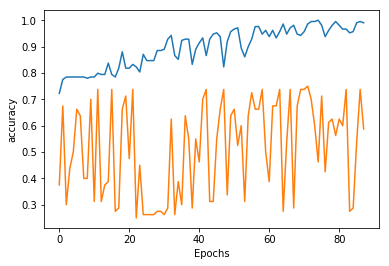

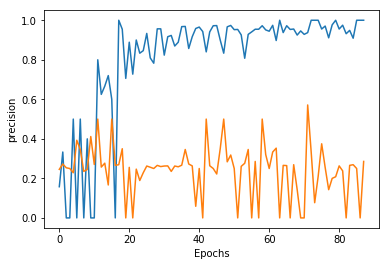

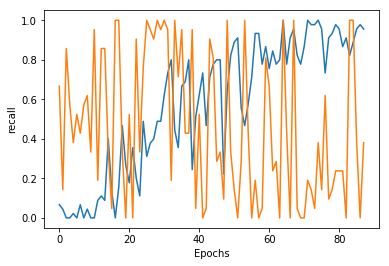

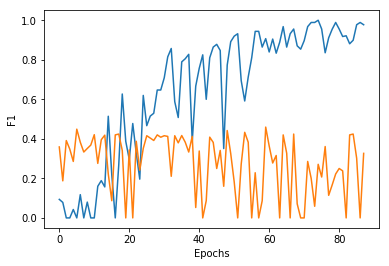

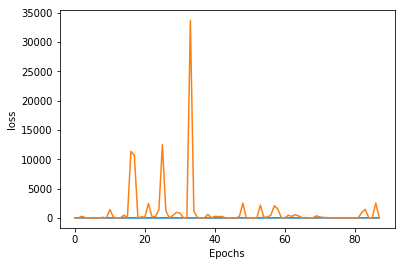

Epoch 89/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.07s/it, loss=0.222]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.003


precision: 1.000 ; recall: 0.933 ; F1: 0.966 ; accuracy: 0.986


- Eval metrics : accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 25.718


precision: 1.000 ; recall: 0.048 ; F1: 0.091 ; accuracy: 0.750


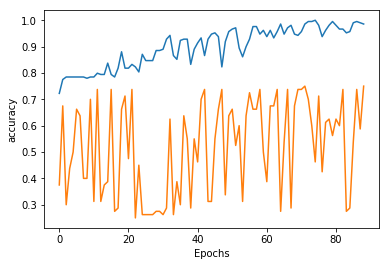

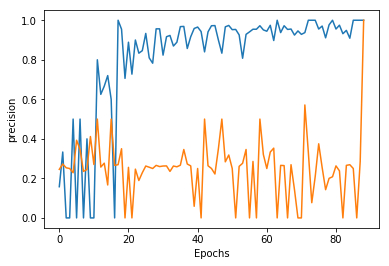

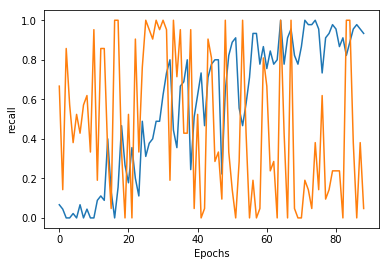

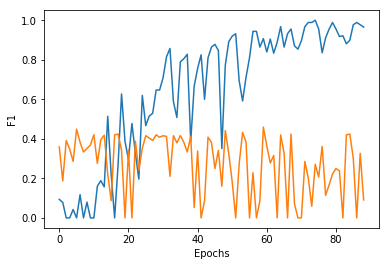

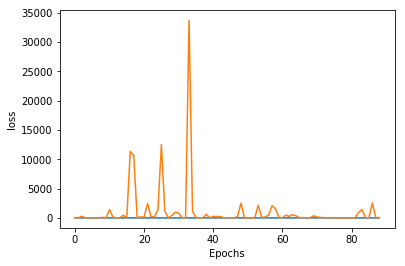

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 90/1000
100%|██████████| 27/27 [00:37<00:00,  1.40s/it, loss=0.033]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.000


precision: 1.000 ; recall: 1.000 ; F1: 1.000 ; accuracy: 1.000


- Eval metrics : accuracy: 0.275 ; Confusion_Matrix: 0.275 ; loss: 102.002


precision: 0.266 ; recall: 1.000 ; F1: 0.420 ; accuracy: 0.275


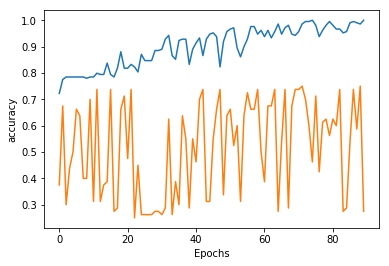

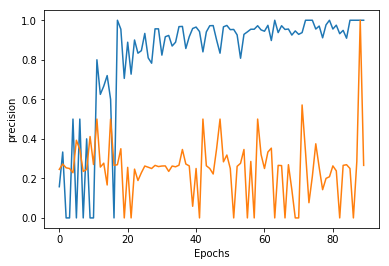

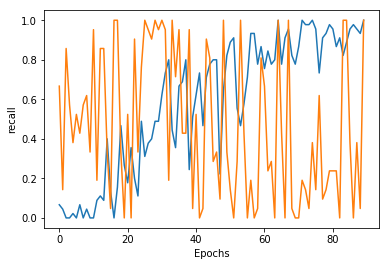

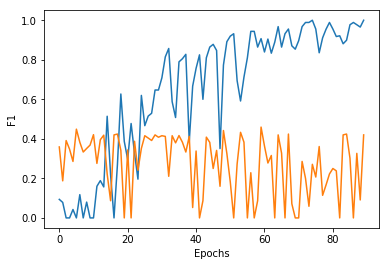

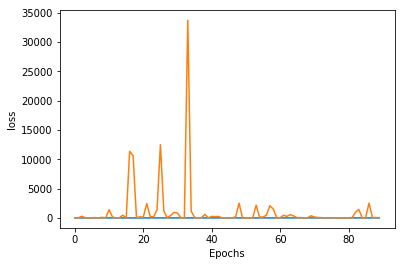

Epoch 91/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:38<00:00,  1.42s/it, loss=0.028]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.063


precision: 1.000 ; recall: 0.956 ; F1: 0.977 ; accuracy: 0.990


- Eval metrics : accuracy: 0.475 ; Confusion_Matrix: 0.475 ; loss: 8.502


precision: 0.256 ; recall: 0.524 ; F1: 0.344 ; accuracy: 0.475


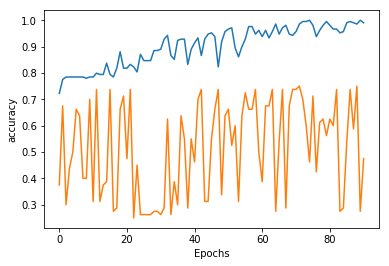

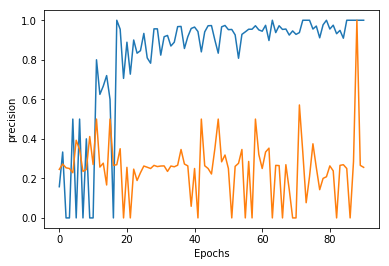

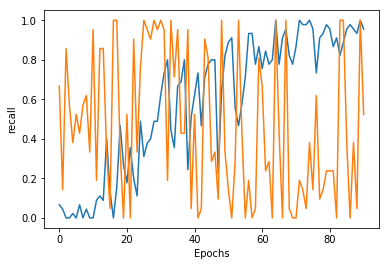

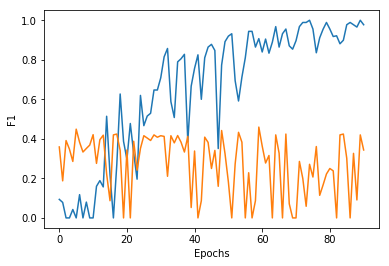

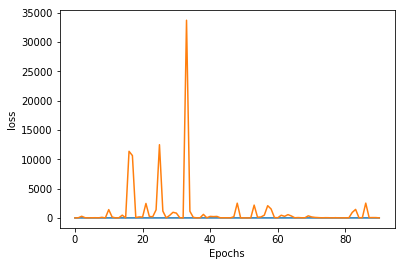

Epoch 92/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:48<00:00,  1.93s/it, loss=0.213]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.008


precision: 0.976 ; recall: 0.911 ; F1: 0.943 ; accuracy: 0.976


- Eval metrics : accuracy: 0.662 ; Confusion_Matrix: 0.662 ; loss: 5.125


precision: 0.200 ; recall: 0.095 ; F1: 0.129 ; accuracy: 0.662


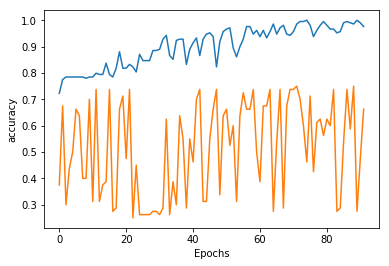

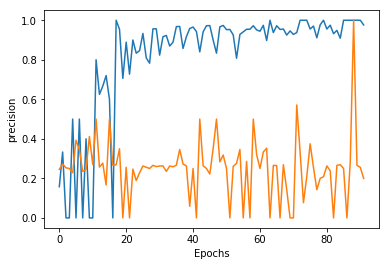

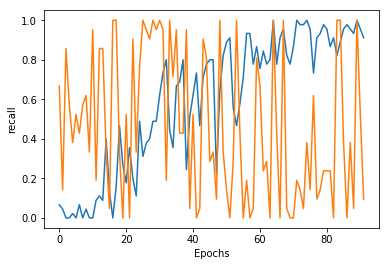

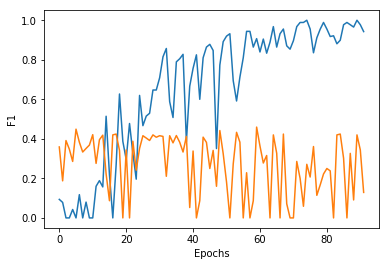

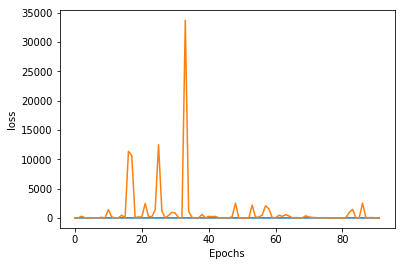

Epoch 93/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:33<00:00,  1.07s/it, loss=0.037]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.003


precision: 1.000 ; recall: 0.978 ; F1: 0.989 ; accuracy: 0.995


- Eval metrics : accuracy: 0.350 ; Confusion_Matrix: 0.350 ; loss: 6.017


precision: 0.288 ; recall: 1.000 ; F1: 0.447 ; accuracy: 0.350


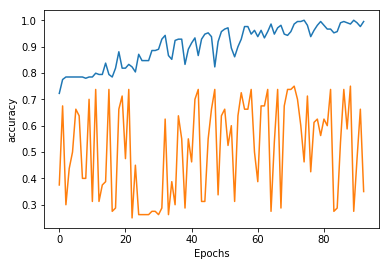

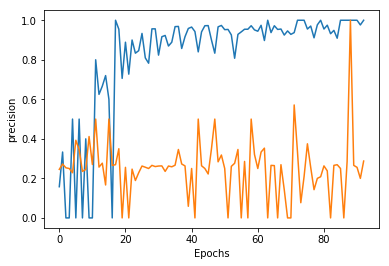

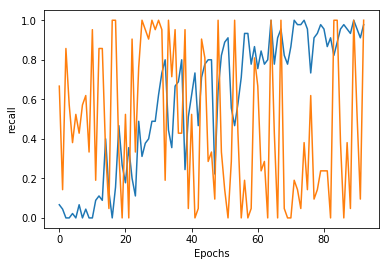

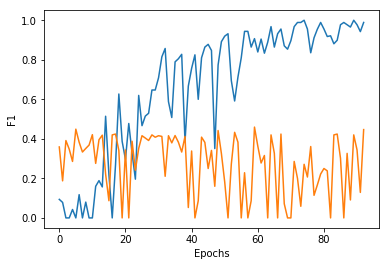

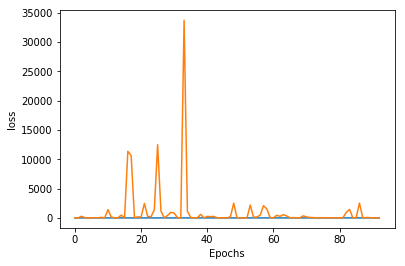

Epoch 94/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:42<00:00,  1.32s/it, loss=0.014]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.012


precision: 1.000 ; recall: 1.000 ; F1: 1.000 ; accuracy: 1.000


- Eval metrics : accuracy: 0.688 ; Confusion_Matrix: 0.688 ; loss: 20.470


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.688


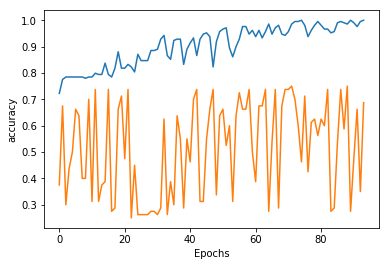

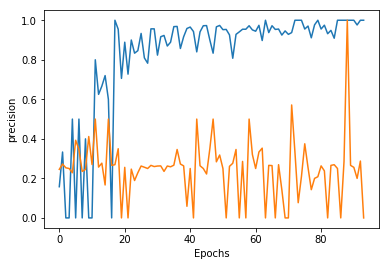

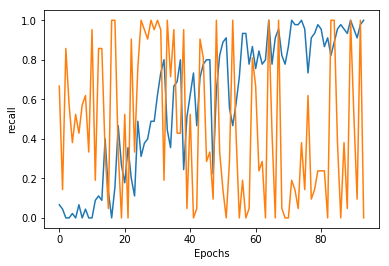

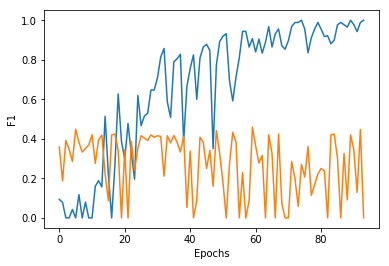

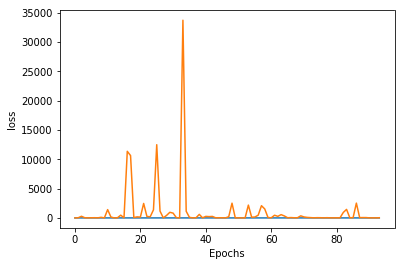

Epoch 95/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:39<00:00,  1.38s/it, loss=0.023]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.006


precision: 1.000 ; recall: 0.956 ; F1: 0.977 ; accuracy: 0.990


- Eval metrics : accuracy: 0.300 ; Confusion_Matrix: 0.300 ; loss: 7.546


precision: 0.254 ; recall: 0.857 ; F1: 0.391 ; accuracy: 0.300


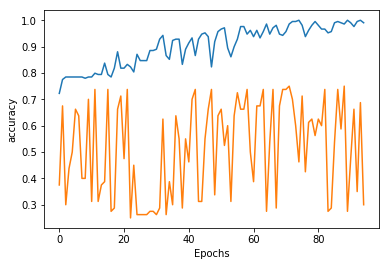

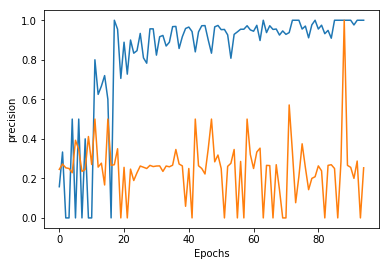

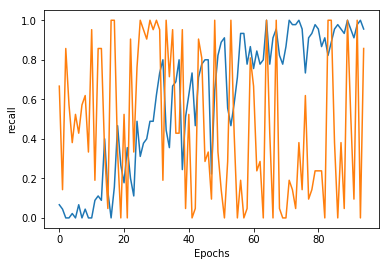

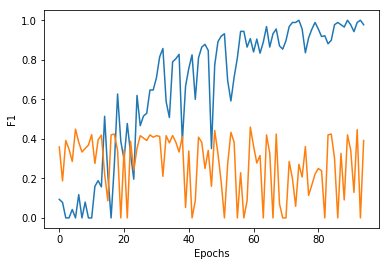

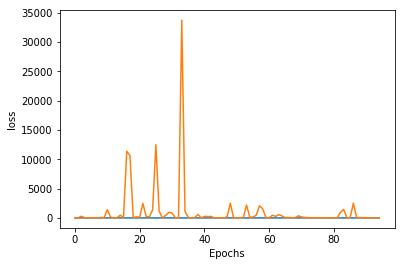

Epoch 96/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:52<00:00,  1.93s/it, loss=0.013]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.096


precision: 1.000 ; recall: 1.000 ; F1: 1.000 ; accuracy: 1.000


- Eval metrics : accuracy: 0.675 ; Confusion_Matrix: 0.675 ; loss: 15.187


precision: 0.333 ; recall: 0.238 ; F1: 0.278 ; accuracy: 0.675


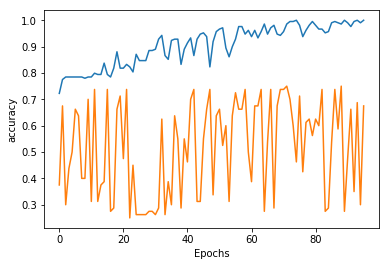

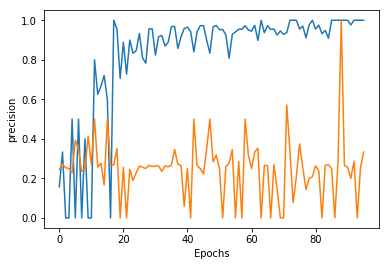

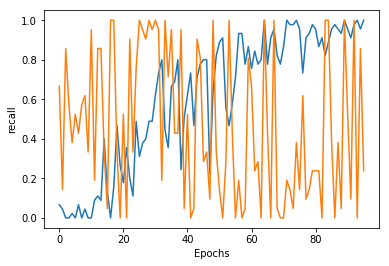

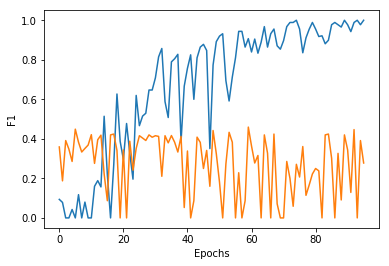

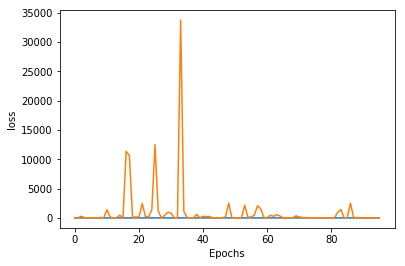

Epoch 97/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.26s/it, loss=0.010]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.002


precision: 1.000 ; recall: 1.000 ; F1: 1.000 ; accuracy: 1.000


- Eval metrics : accuracy: 0.362 ; Confusion_Matrix: 0.362 ; loss: 10.551


precision: 0.273 ; recall: 0.857 ; F1: 0.414 ; accuracy: 0.362


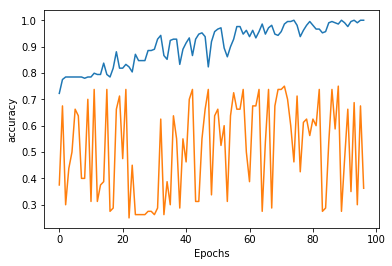

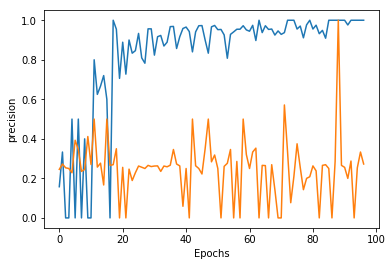

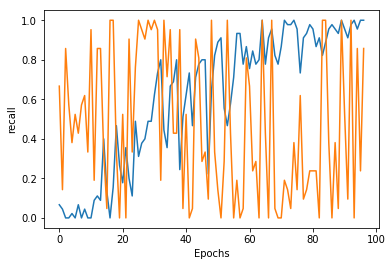

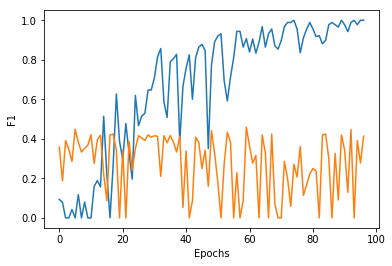

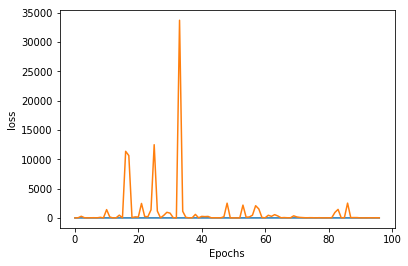

Epoch 98/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:49<00:00,  1.30s/it, loss=0.017]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.000


precision: 1.000 ; recall: 0.956 ; F1: 0.977 ; accuracy: 0.990


- Eval metrics : accuracy: 0.713 ; Confusion_Matrix: 0.713 ; loss: 204.197


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.713


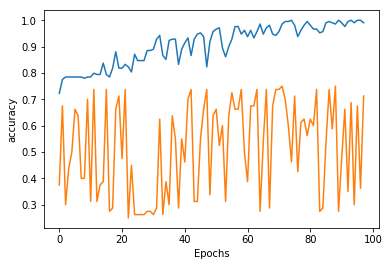

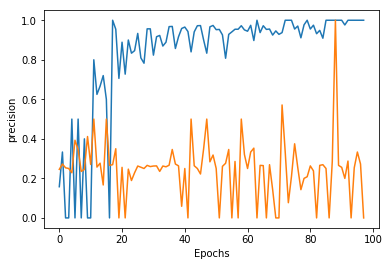

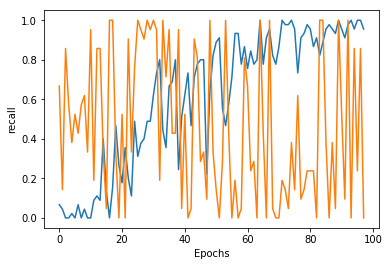

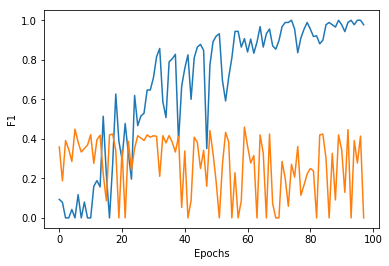

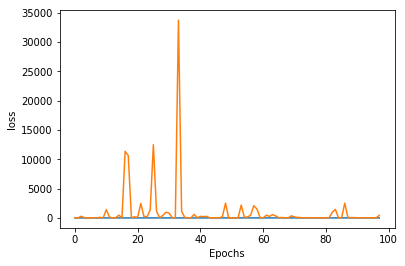

Epoch 99/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:43<00:00,  1.30s/it, loss=0.015]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.027


precision: 1.000 ; recall: 0.933 ; F1: 0.966 ; accuracy: 0.986


- Eval metrics : accuracy: 0.713 ; Confusion_Matrix: 0.713 ; loss: 48.328


precision: 0.250 ; recall: 0.048 ; F1: 0.080 ; accuracy: 0.713


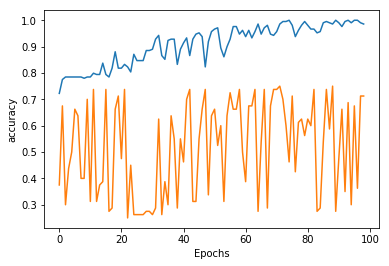

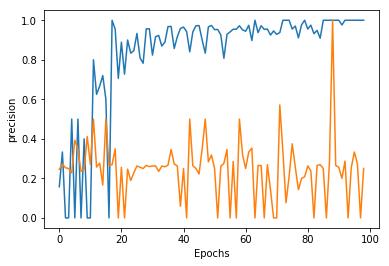

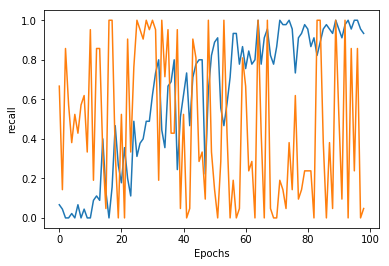

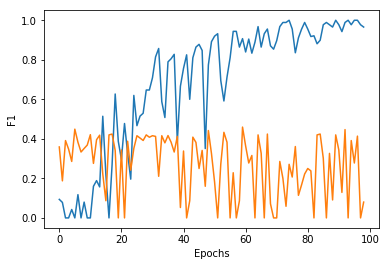

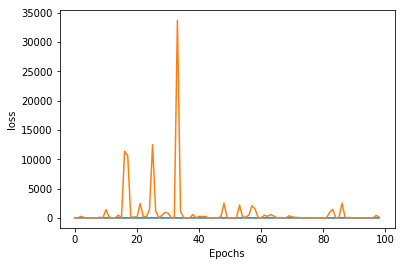

Epoch 100/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:34<00:00,  1.01s/it, loss=0.019]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.001


precision: 0.978 ; recall: 0.978 ; F1: 0.978 ; accuracy: 0.990


- Eval metrics : accuracy: 0.412 ; Confusion_Matrix: 0.412 ; loss: 8.479


precision: 0.276 ; recall: 0.762 ; F1: 0.405 ; accuracy: 0.412


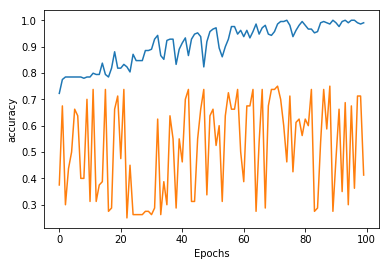

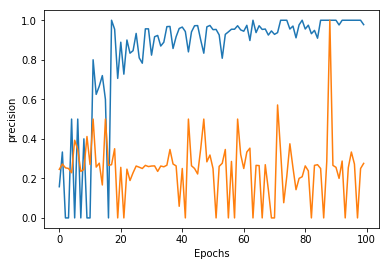

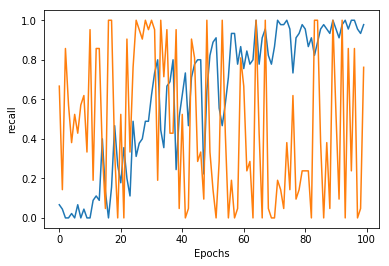

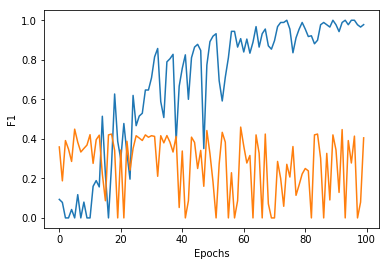

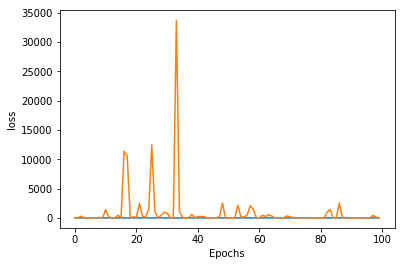

Epoch 101/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:38<00:00,  1.26s/it, loss=0.042]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.148


precision: 0.953 ; recall: 0.911 ; F1: 0.932 ; accuracy: 0.971


- Eval metrics : accuracy: 0.713 ; Confusion_Matrix: 0.713 ; loss: 61.482


precision: 0.400 ; recall: 0.190 ; F1: 0.258 ; accuracy: 0.713


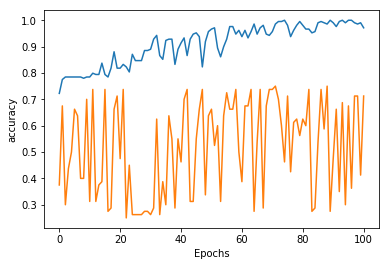

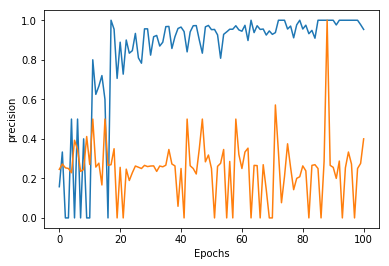

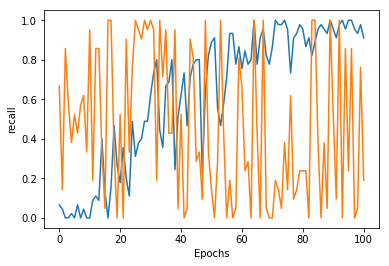

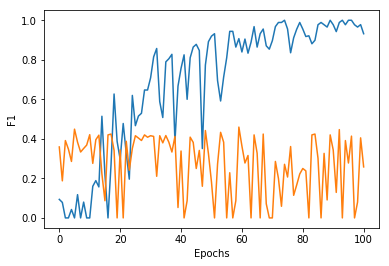

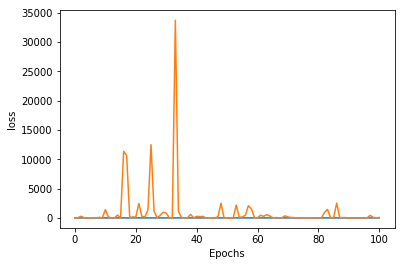

Epoch 102/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.25s/it, loss=0.259]
- Train metrics: accuracy: 0.875 ; Confusion_Matrix: 0.875 ; loss: 0.224


precision: 1.000 ; recall: 0.889 ; F1: 0.941 ; accuracy: 0.976


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 1441.717


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


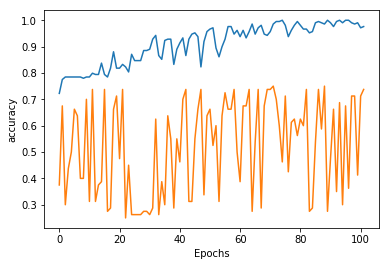

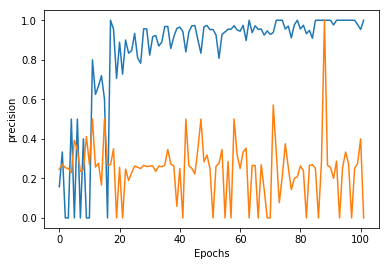

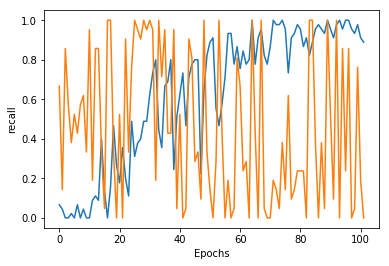

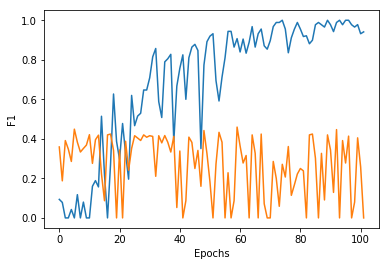

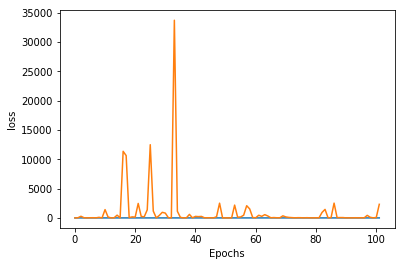

Epoch 103/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:35<00:00,  1.21s/it, loss=0.043]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.018


precision: 0.957 ; recall: 0.978 ; F1: 0.967 ; accuracy: 0.986


- Eval metrics : accuracy: 0.362 ; Confusion_Matrix: 0.362 ; loss: 100.732


precision: 0.292 ; recall: 1.000 ; F1: 0.452 ; accuracy: 0.362


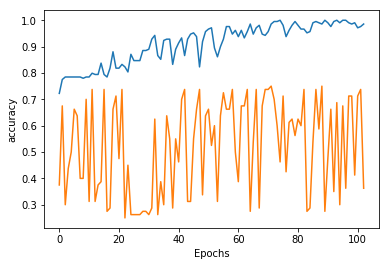

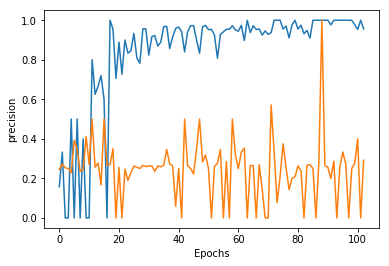

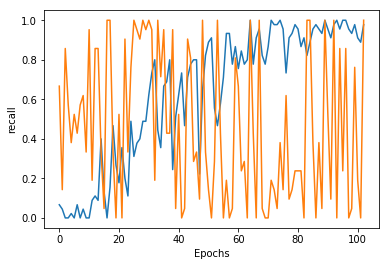

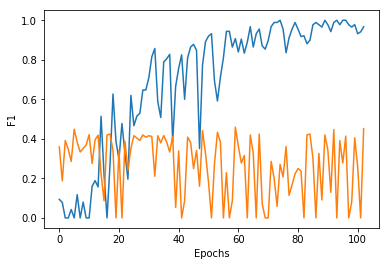

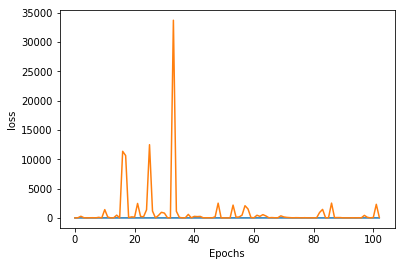

Checkpoint Directory exists! 


Epoch 104/1000
100%|██████████| 27/27 [00:36<00:00,  1.23s/it, loss=0.037]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.004


precision: 1.000 ; recall: 0.867 ; F1: 0.929 ; accuracy: 0.971


- Eval metrics : accuracy: 0.588 ; Confusion_Matrix: 0.588 ; loss: 57.666


precision: 0.167 ; recall: 0.143 ; F1: 0.154 ; accuracy: 0.588


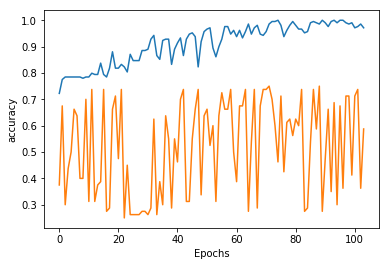

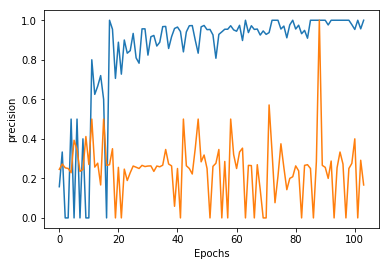

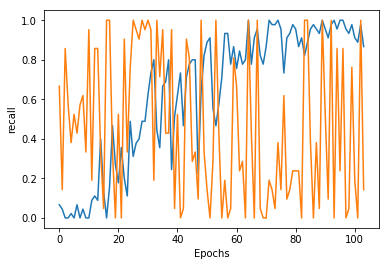

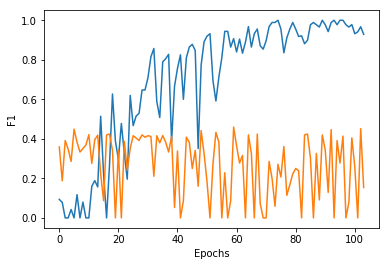

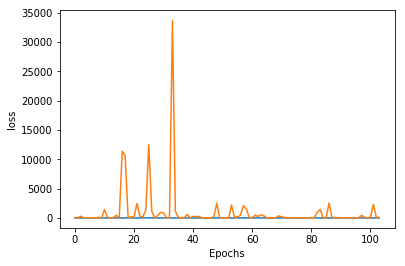

Epoch 105/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.23s/it, loss=0.191]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.002


precision: 0.977 ; recall: 0.956 ; F1: 0.966 ; accuracy: 0.986


- Eval metrics : accuracy: 0.738 ; Confusion_Matrix: 0.738 ; loss: 881.935


precision: 0.000 ; recall: 0.000 ; F1: 0.000 ; accuracy: 0.738


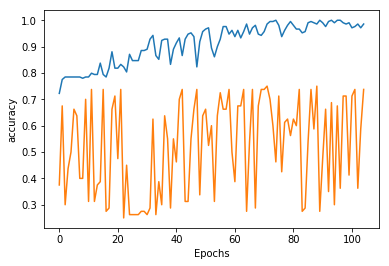

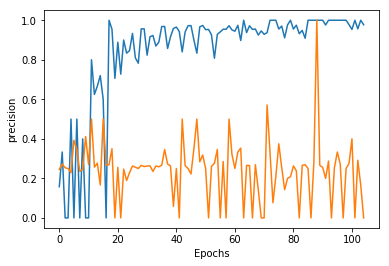

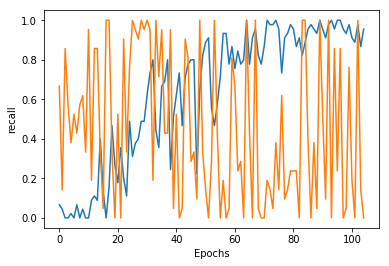

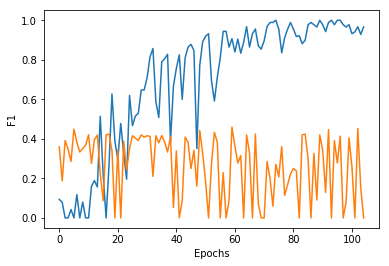

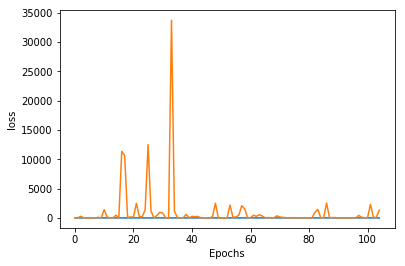

Epoch 106/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.26s/it, loss=0.146]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.001


precision: 0.978 ; recall: 0.978 ; F1: 0.978 ; accuracy: 0.990


- Eval metrics : accuracy: 0.263 ; Confusion_Matrix: 0.263 ; loss: 1406.399


precision: 0.263 ; recall: 1.000 ; F1: 0.416 ; accuracy: 0.263


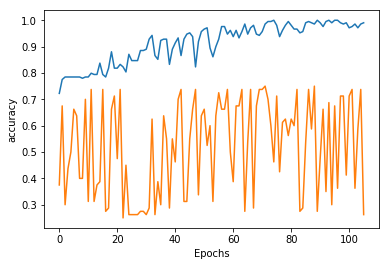

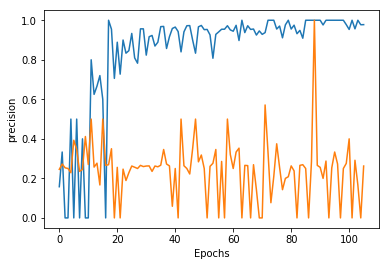

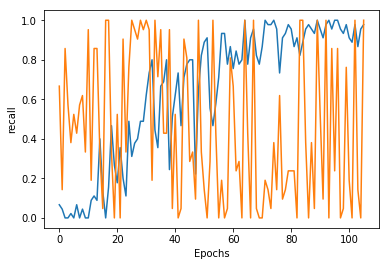

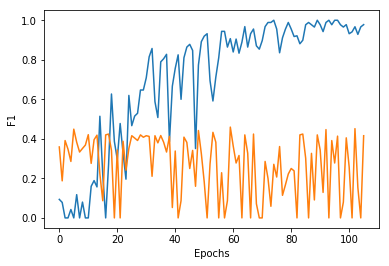

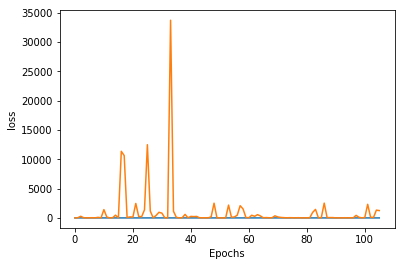

Checkpoint Directory exists! 


Epoch 107/1000
100%|██████████| 27/27 [00:35<00:00,  1.28s/it, loss=0.053]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.006


precision: 1.000 ; recall: 0.956 ; F1: 0.977 ; accuracy: 0.990


- Eval metrics : accuracy: 0.300 ; Confusion_Matrix: 0.300 ; loss: 10.144


precision: 0.273 ; recall: 1.000 ; F1: 0.429 ; accuracy: 0.300


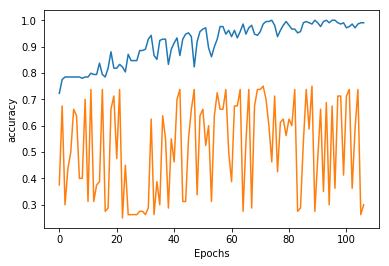

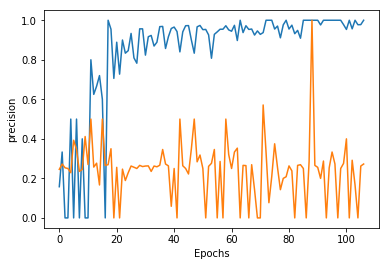

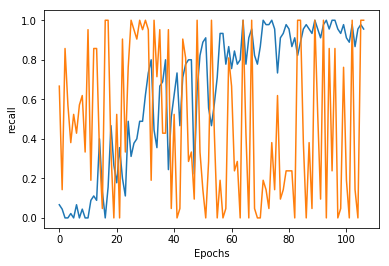

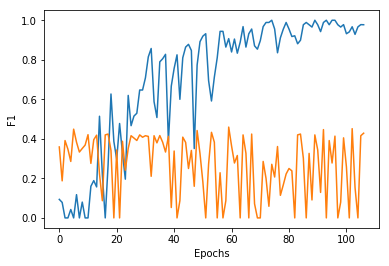

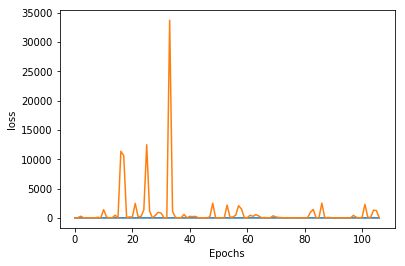

Epoch 108/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.33s/it, loss=0.013]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.012


precision: 1.000 ; recall: 1.000 ; F1: 1.000 ; accuracy: 1.000


- Eval metrics : accuracy: 0.525 ; Confusion_Matrix: 0.525 ; loss: 7.792


precision: 0.207 ; recall: 0.286 ; F1: 0.240 ; accuracy: 0.525


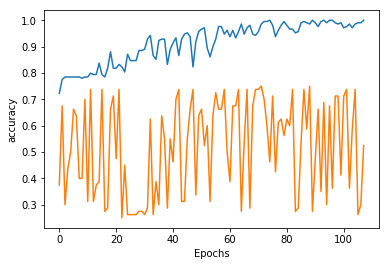

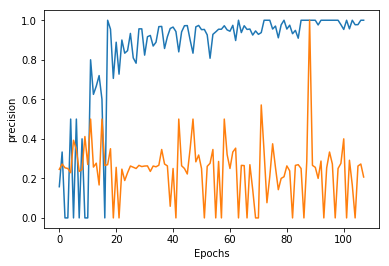

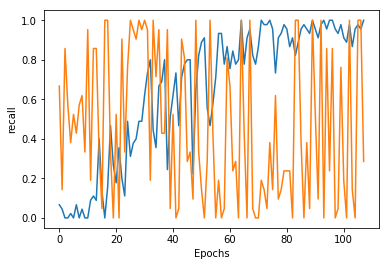

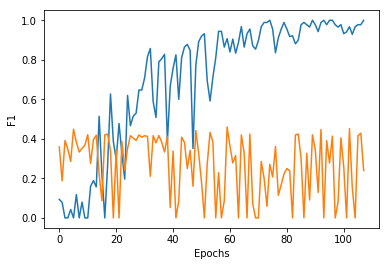

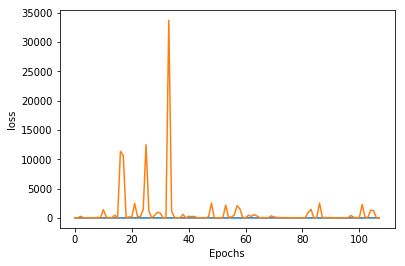

Epoch 109/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:39<00:00,  1.29s/it, loss=0.011]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.013


precision: 1.000 ; recall: 1.000 ; F1: 1.000 ; accuracy: 1.000


- Eval metrics : accuracy: 0.400 ; Confusion_Matrix: 0.400 ; loss: 4.451


precision: 0.235 ; recall: 0.571 ; F1: 0.333 ; accuracy: 0.400


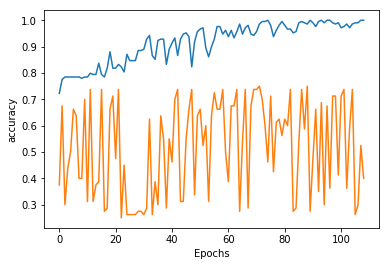

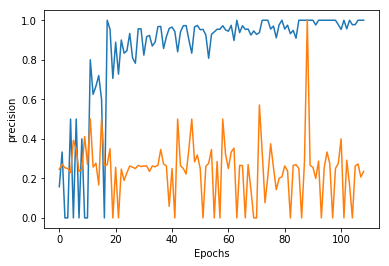

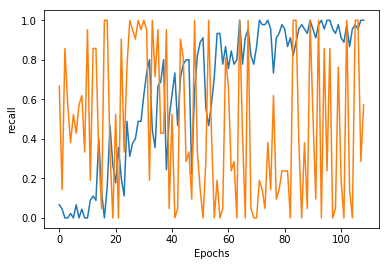

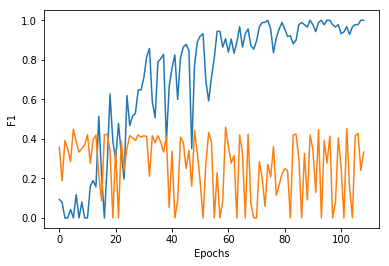

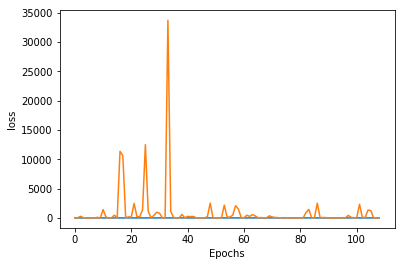

Epoch 110/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.20s/it, loss=0.043]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.001


precision: 1.000 ; recall: 0.911 ; F1: 0.953 ; accuracy: 0.981


- Eval metrics : accuracy: 0.725 ; Confusion_Matrix: 0.725 ; loss: 118.144


precision: 0.333 ; recall: 0.048 ; F1: 0.083 ; accuracy: 0.725


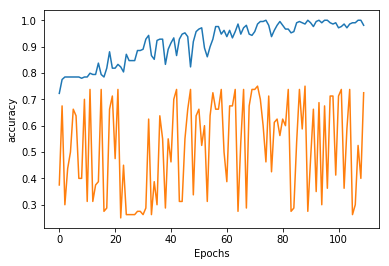

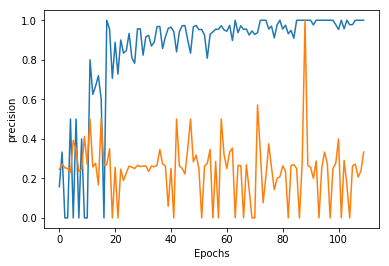

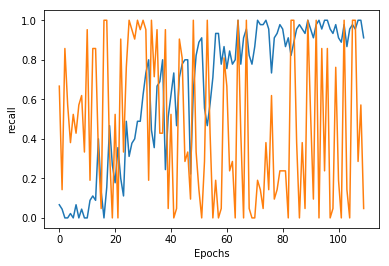

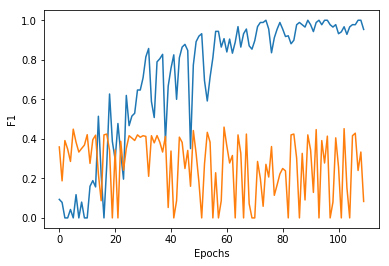

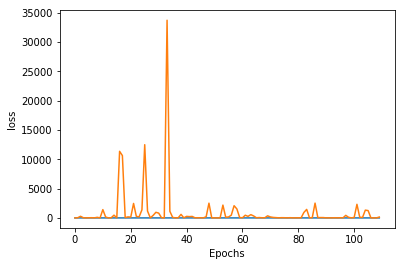

Checkpoint Directory exists! 


Epoch 111/1000
100%|██████████| 27/27 [00:37<00:00,  1.23s/it, loss=0.057]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.003


precision: 0.911 ; recall: 0.911 ; F1: 0.911 ; accuracy: 0.962


- Eval metrics : accuracy: 0.625 ; Confusion_Matrix: 0.625 ; loss: 12.834


precision: 0.355 ; recall: 0.524 ; F1: 0.423 ; accuracy: 0.625


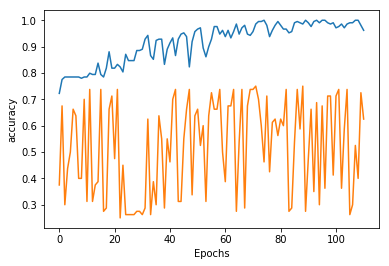

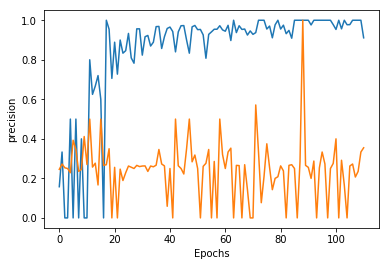

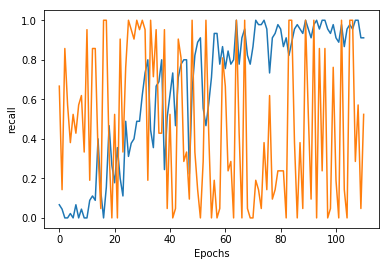

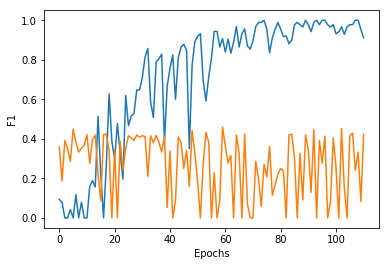

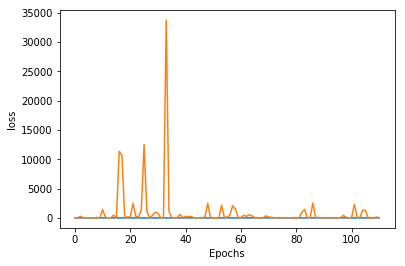

Epoch 112/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:36<00:00,  1.39s/it, loss=0.081]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.012


precision: 0.971 ; recall: 0.756 ; F1: 0.850 ; accuracy: 0.943


- Eval metrics : accuracy: 0.588 ; Confusion_Matrix: 0.588 ; loss: 158.507


precision: 0.300 ; recall: 0.429 ; F1: 0.353 ; accuracy: 0.588


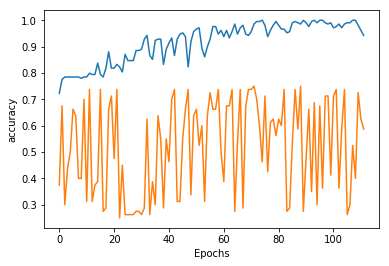

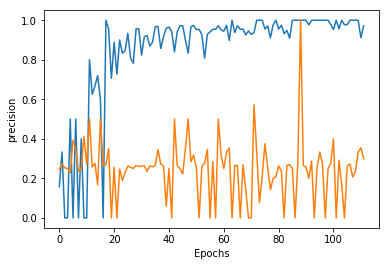

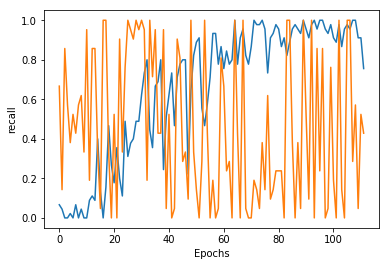

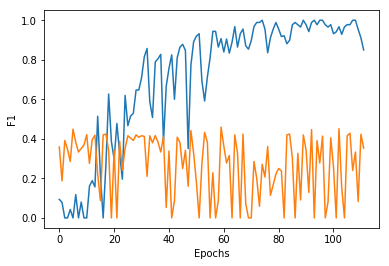

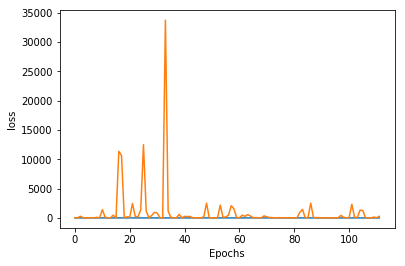

Epoch 113/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:59<00:00,  1.71s/it, loss=0.071]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.003


precision: 0.974 ; recall: 0.822 ; F1: 0.892 ; accuracy: 0.957


- Eval metrics : accuracy: 0.688 ; Confusion_Matrix: 0.688 ; loss: 247.014


precision: 0.250 ; recall: 0.095 ; F1: 0.138 ; accuracy: 0.688


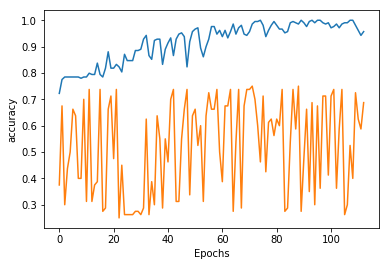

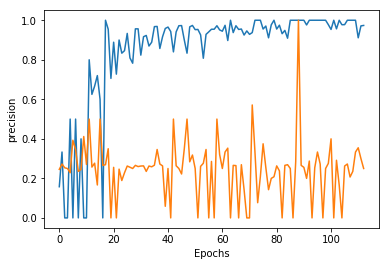

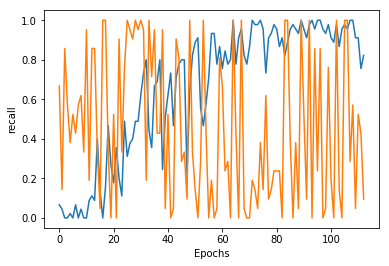

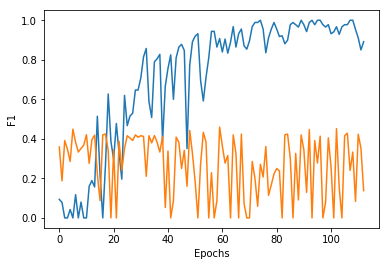

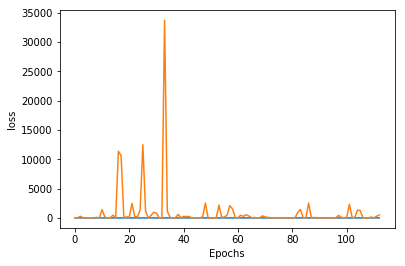

Epoch 114/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:40<00:00,  1.31s/it, loss=0.071]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.083


precision: 0.907 ; recall: 0.867 ; F1: 0.886 ; accuracy: 0.952


- Eval metrics : accuracy: 0.725 ; Confusion_Matrix: 0.725 ; loss: 957.740


precision: 0.333 ; recall: 0.048 ; F1: 0.083 ; accuracy: 0.725


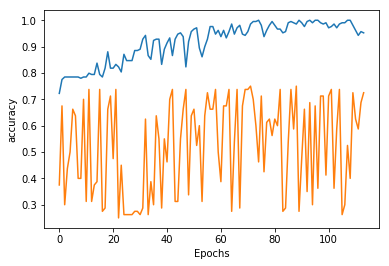

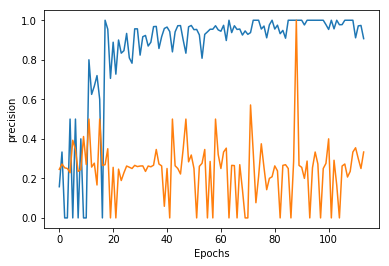

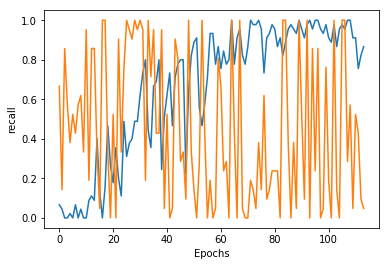

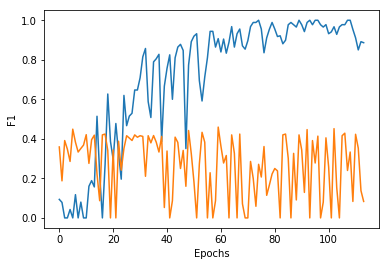

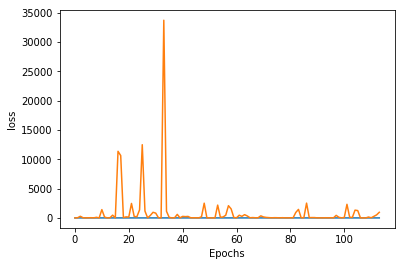

Epoch 115/1000
  0%|          | 0/27 [00:00<?, ?it/s]

Checkpoint Directory exists! 


100%|██████████| 27/27 [00:37<00:00,  1.18s/it, loss=0.081]
- Train metrics: accuracy: 1.000 ; Confusion_Matrix: 1.000 ; loss: 0.009


precision: 0.972 ; recall: 0.778 ; F1: 0.864 ; accuracy: 0.947


- Eval metrics : accuracy: 0.750 ; Confusion_Matrix: 0.750 ; loss: 4278.469


precision: 1.000 ; recall: 0.048 ; F1: 0.091 ; accuracy: 0.750


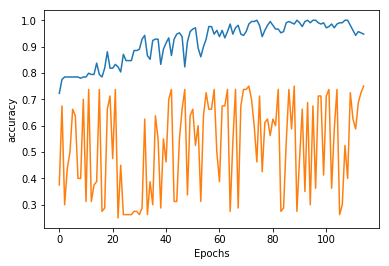

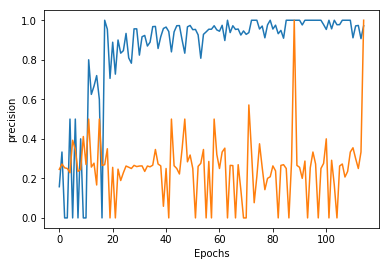

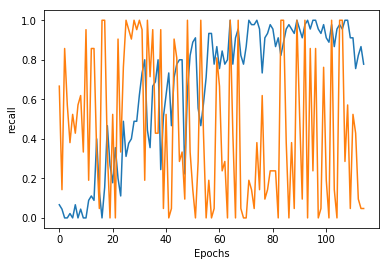

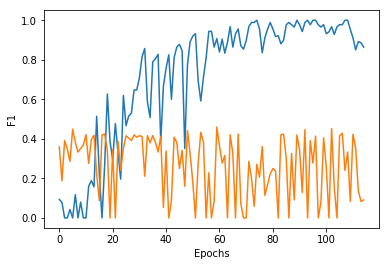

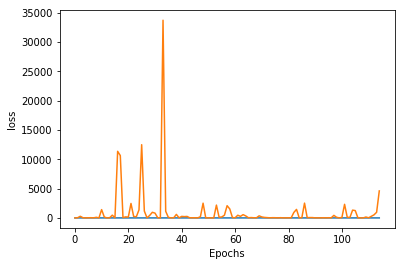

Checkpoint Directory exists! 


- Found new best accuracy
Epoch 116/1000
 52%|█████▏    | 14/27 [00:20<00:16,  1.30s/it, loss=0.071]

In [ ]:
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
json_path = os.path.join(model_dir, 'params.json')
assert os.path.isfile(json_path), "No json configuration file found at {}".format(json_path)
params = utils.Params(json_path)

# use GPU if available
params.cuda = torch.cuda.is_available()

# Set the random seed for reproducible experiments
torch.manual_seed(230)
if params.cuda: torch.cuda.manual_seed(230)

# Set the logger
utils.set_logger(os.path.join(model_dir, 'train.log'))

# Create the input data pipeline
logging.info("Loading the datasets...")

# fetch dataloaders
dataloaders = data_loader.fetch_dataloader(['train', 'val'], data_dir, params)
train_dl = dataloaders['train']
val_dl = dataloaders['val']

logging.info("- done.")

# Define the model and optimizer
model = net.Net(params).cuda() if params.cuda else net.Net(params)
optimizer = optim.Adam(model.parameters(), lr=params.learning_rate)

# fetch loss function and metrics
loss_fn = net.loss_fn
metrics = net.metrics

# Train the model
logging.info("Starting training for {} epoch(s)".format(params.num_epochs))
train_and_evaluate(model, train_dl, val_dl, optimizer, loss_fn, metrics, params, model_dir,
                       restore_file)
